# Question 2.2 Linear Regression Model to Forecast

General Describtion: In this question, users can choose model for certain house to forecast.



In [1]:
from sklearn.linear_model import LinearRegression
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import numpy as np

In [12]:
def linear_pre(file,Id):
    #generate hour number for 6 months
    hour_num = 4*31*24 + 29*24 + 30*24
    #set feature as number of hours
    X = np.arange(hour_num).reshape(-1,1)
    Y = pre_hour_data(file,Id)
    
    # Random spliting by 70%/30%
    (X_train,X_test,Y_train,Y_test)=train_test_split(X,Y,test_size=0.3)  
    
    LR = LinearRegression().fit(X_train,Y_train)
    
    Y_pred_train = LR.predict(X_train)
    Y_pred_test = LR.predict(X_test)
    
    #get R^2 score
    score_train = LR.score(X_train,Y_train)
    score_test = LR.score(X_test,Y_test)
    print('Training score for house '+str(Id)+' is '+str(score_train))
    print('Testing score for house '+str(Id)+' is '+str(score_test))
    
    
    #plot Time series plot of the actual and predicted hourly meter readings
    Y_all =  LR.predict(X)
    plt.plot(X, Y_all,label = 'predict')
    plt.plot(X, Y,label = 'true')
    plt.legend(loc='best')
    plt.xlabel('Number of hours from 1.Oct.2015')
    plt.ylabel('Gas meter')
    plt.title('Linear Regression Prediction Time Series Plot for House '+ str(Id))
    plt.show()
    
    #plot Scatter plot of actual vs predicted meter readings
    plt.scatter(Y,Y_all,color = 'gold')
    plt.xlabel('True value')
    plt.ylabel('Predict')
    plt.title('Linear Regression Scatter plot of actual vs predicted for House '+ str(Id))
    #plot perfect fitting line
    plt.plot([min(Y),max(Y)],[min(Y),max(Y)],label='perfect fitting line')
    plt.legend(loc='best')
    plt.show()

In certain hour, sometimes all data is missing will appeal. To improve accuracy, we preprocessing the data before traing. If dreasing appear, the value for the hour will be change to the same as last reading value. 
The function pre_hour_data(Id) below can prepare data for house with Id.

In [2]:
def pre_hour_data(file,Id):
    file = pd.read_csv(file)
    data = {}
    #generate hour number for 6 months
    hour_num = 4*31*24 + 29*24 + 30*24
    for i in range(0,hour_num):
        data[i]= []
    
    #filter file by dataid 
    file = file[(file['dataid']==Id) | (file['dataid']==str(Id))]
    if len(file) == 0:
        print('???')
        return None
    
    file = file.values

    mon = {10:0,11:31,12:61,1:92,2:123,3:152}
    for i in range(0,len(file)):
        d = int(file[i][0].split('-')[2].split(' ')[0])
        m = int(file[i][0].split('-')[1].split(' ')[0])
        h = int(file[i][0].split('-')[2].split(' ')[1].split(':')[0])
        h_num = (d-1)*24 + h + mon[m]*24
        
        
        data[h_num].append(file[i][2])
    # set decreasing and missing value as
    for i in range(0,hour_num):
        if len(data[i]) != 0:
            hold = sum(data[i])/ len(data[i])
            break
    np_data = []
    for i in range(0,hour_num):
        if len(data[i]) != 0:
            data[i] = sum(data[i])/ len(data[i])
            hold = data[i]
            np_data.append(data[i])
        else: 
            data[i] = hold
            np_data.append(data[i])
    np_data = np.array(np_data)

    return np_data.reshape(-1,1)

Show plots for all house

Training score for house 739 is 0.9661376281546045
Testing score for house 739 is 0.9650095701362817


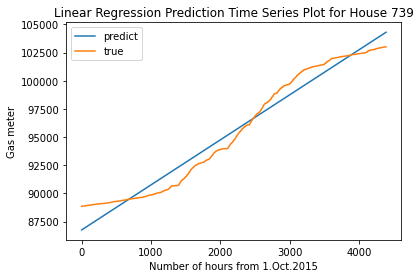

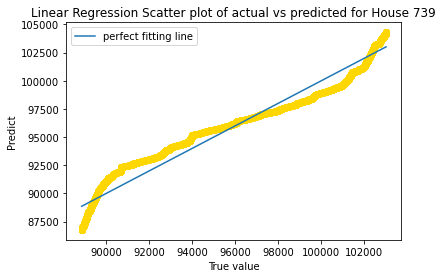

Training score for house 8890 is 0.9555563852390512
Testing score for house 8890 is 0.9561413953619788


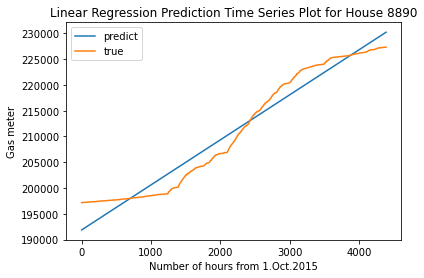

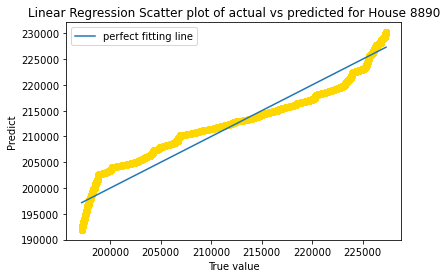

Training score for house 6910 is 0.9647867707942493
Testing score for house 6910 is 0.9629750660100796


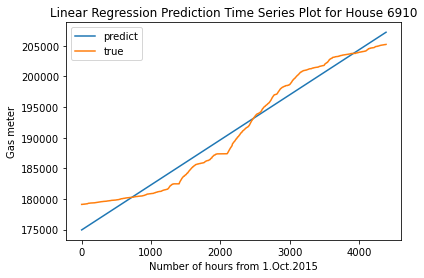

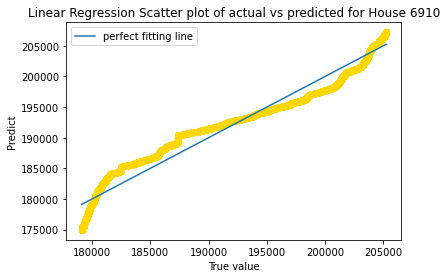

Training score for house 3635 is 0.9592058520973672
Testing score for house 3635 is 0.9608683843353367


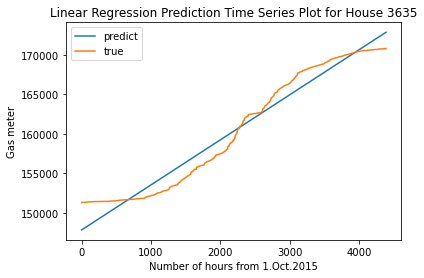

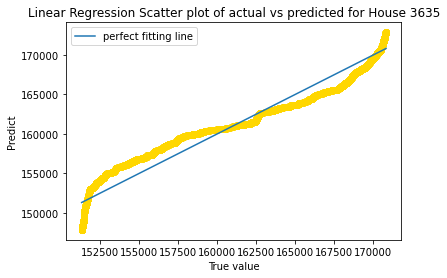

Training score for house 1507 is 0.964441343166777
Testing score for house 1507 is 0.9650093413547907


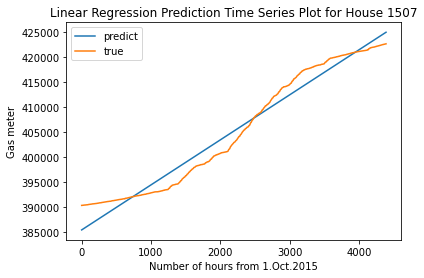

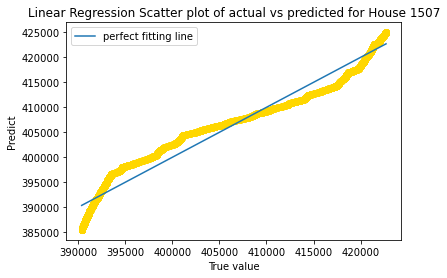

Training score for house 5810 is 0.9786046913829682
Testing score for house 5810 is 0.9772147826199776


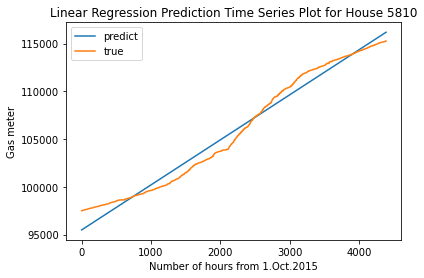

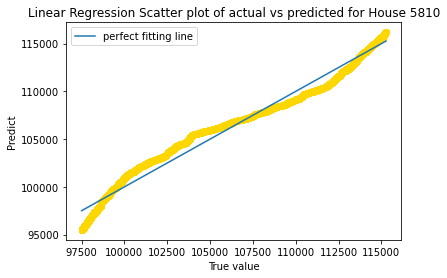

Training score for house 484 is 0.9773363899868873
Testing score for house 484 is 0.9784211907324467


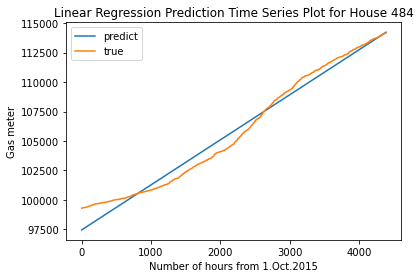

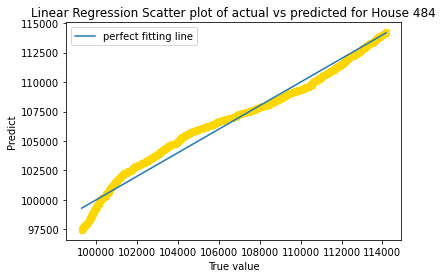

Training score for house 4352 is 0.8516153237751848
Testing score for house 4352 is 0.856667647813827


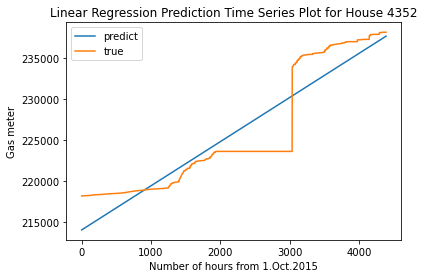

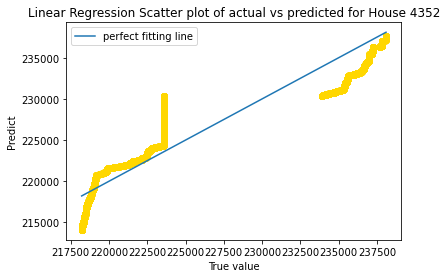

Training score for house 1718 is 0.965847137324165
Testing score for house 1718 is 0.9672999324626762


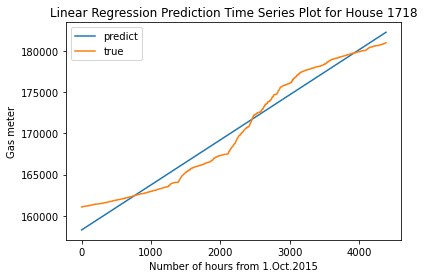

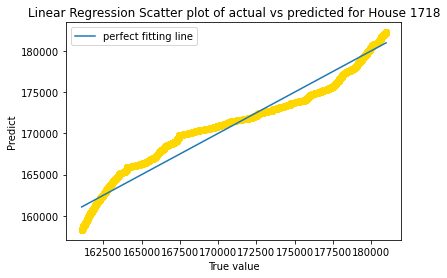

Training score for house 1714 is 0.9417364185065649
Testing score for house 1714 is 0.9429104937405671


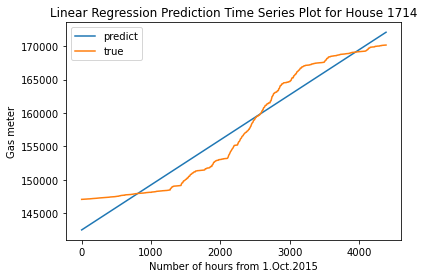

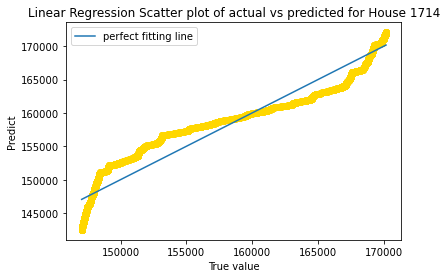

Training score for house 9849 is 0.9953017821344828
Testing score for house 9849 is 0.9951327948497052


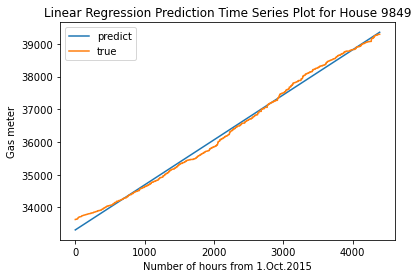

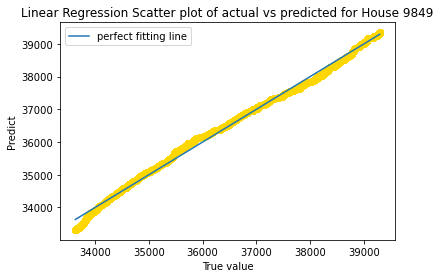

Training score for house 5131 is 0.9525537496983623
Testing score for house 5131 is 0.9557277798853738


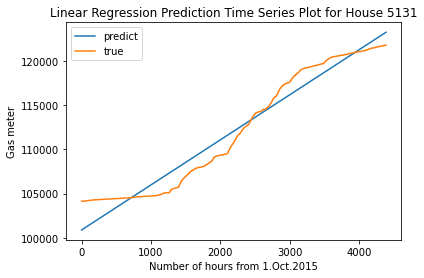

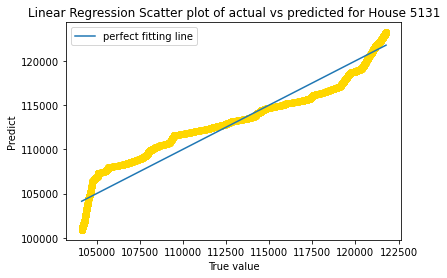

Training score for house 6412 is 0.9519147252204953
Testing score for house 6412 is 0.9503053166087293


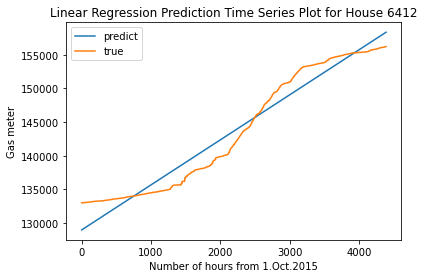

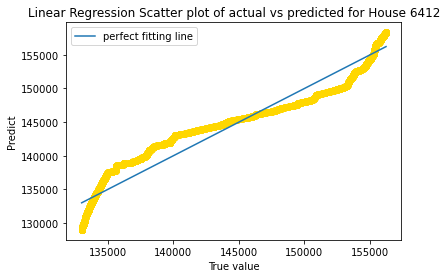

Training score for house 7429 is 0.9567160639010246
Testing score for house 7429 is 0.9568831386767579


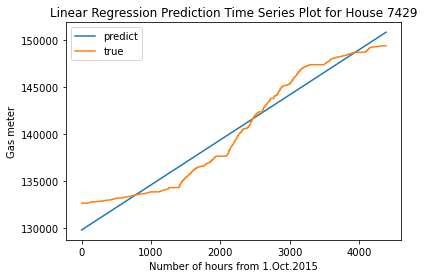

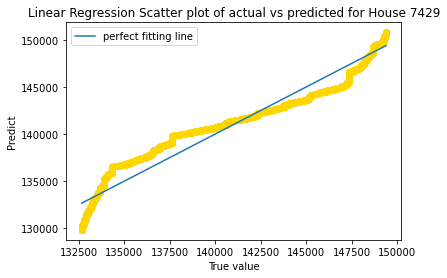

Training score for house 871 is 0.9465010776069946
Testing score for house 871 is 0.94712523294068


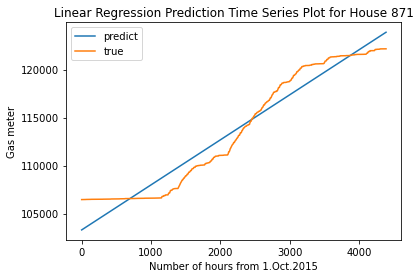

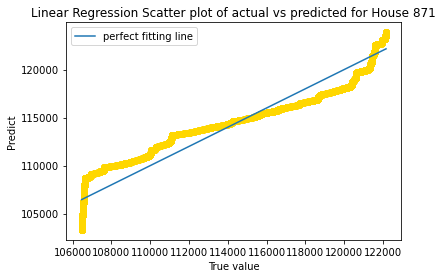

Training score for house 1086 is 0.9699830223874679
Testing score for house 1086 is 0.9696531354651318


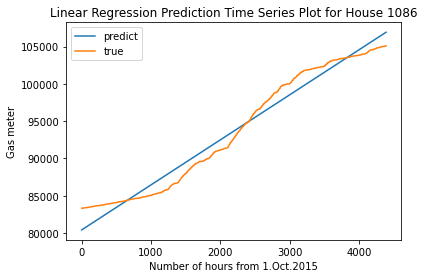

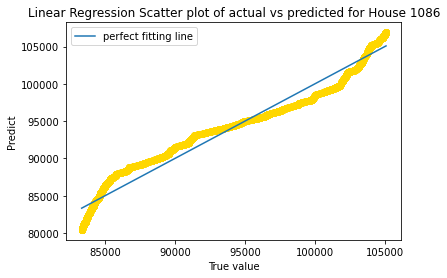

Training score for house 1589 is 0.9461390454676515
Testing score for house 1589 is 0.9441600948912995


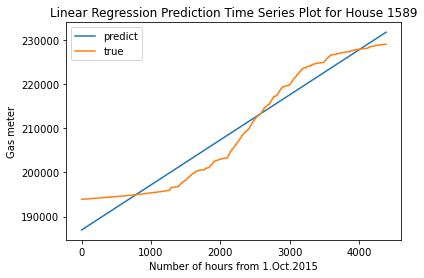

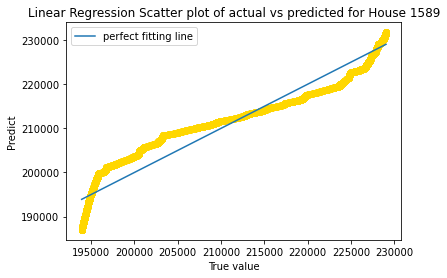

Training score for house 8156 is 0.9595804437870424
Testing score for house 8156 is 0.9579830593362573


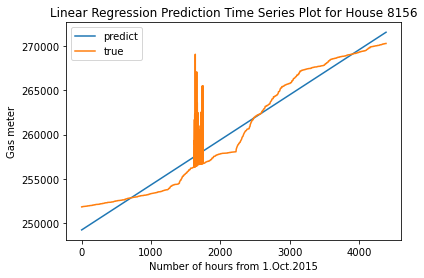

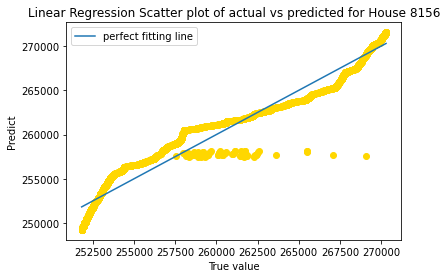

Training score for house 9631 is 0.9385307863622778
Testing score for house 9631 is 0.9366765798466206


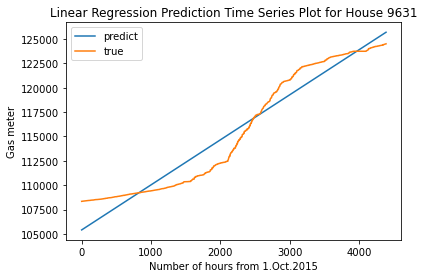

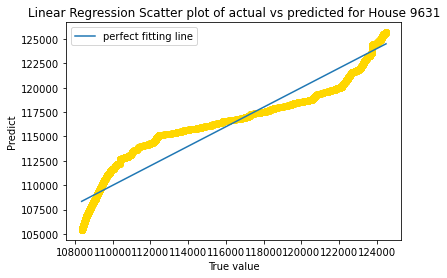

Training score for house 5403 is 0.9648031980230374
Testing score for house 5403 is 0.9622018839250642


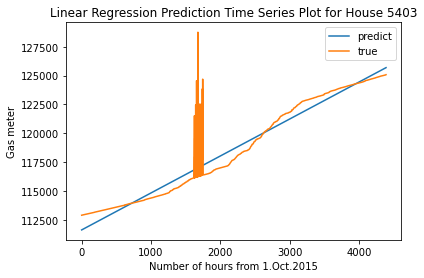

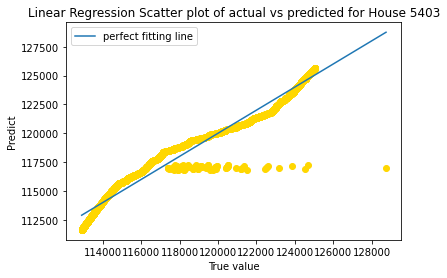

Training score for house 4447 is 0.9632947255018246
Testing score for house 4447 is 0.9657954072692114


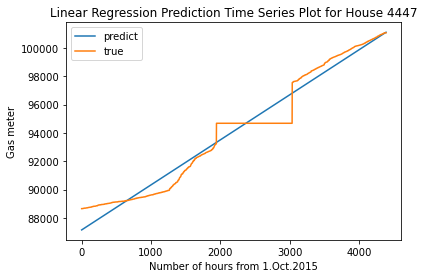

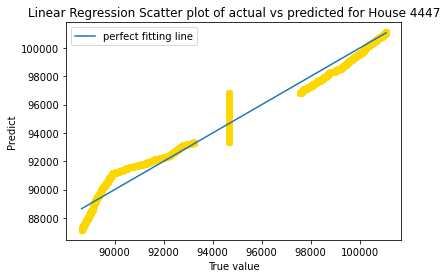

Training score for house 2034 is 0.9554490197474665
Testing score for house 2034 is 0.9578321579419032


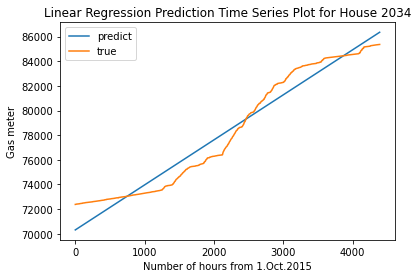

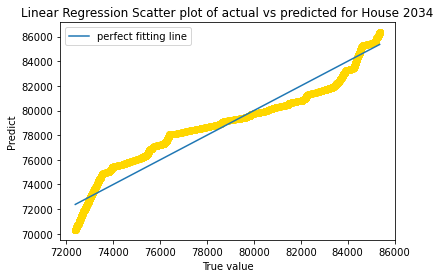

Training score for house 5275 is 0.9416753089808418
Testing score for house 5275 is 0.9426248422507278


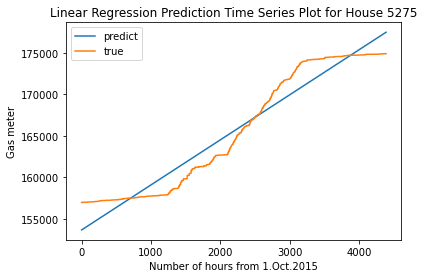

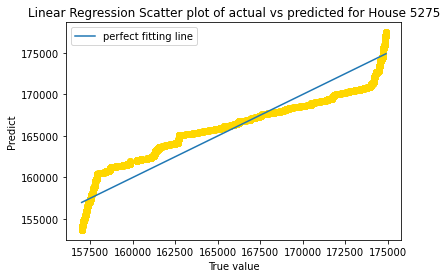

Training score for house 7794 is 0.9603353989293845
Testing score for house 7794 is 0.961136232049741


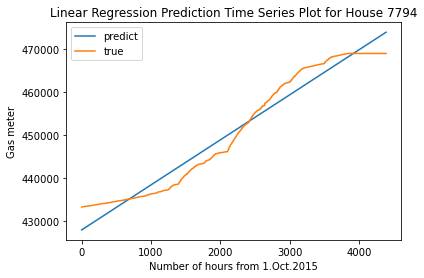

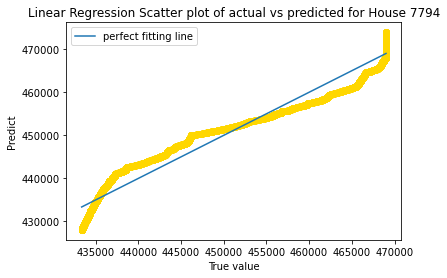

Training score for house 7287 is 0.9783988280710141
Testing score for house 7287 is 0.9778417270444861


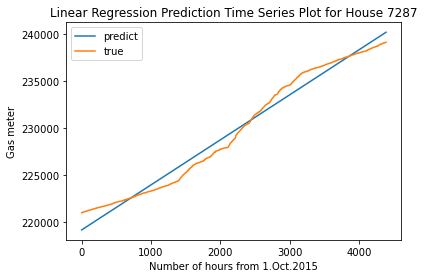

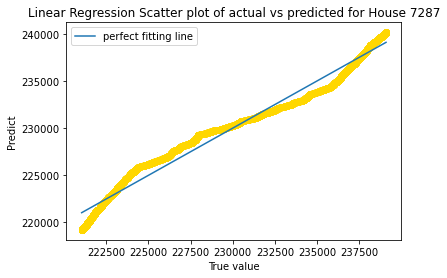

Training score for house 4296 is 0.9666302381970506
Testing score for house 4296 is 0.9687821172566796


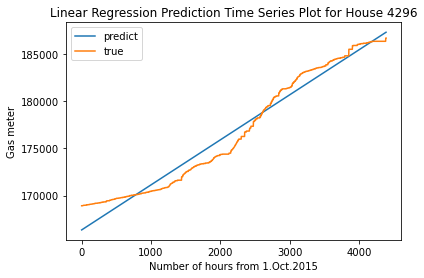

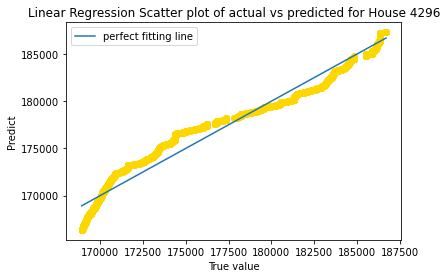

Training score for house 9639 is 0.970065470807972
Testing score for house 9639 is 0.9714184820708007


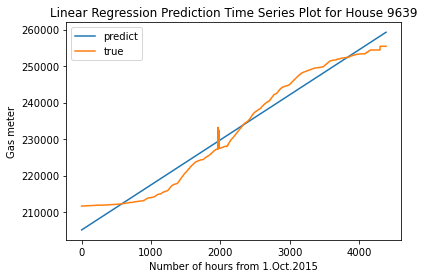

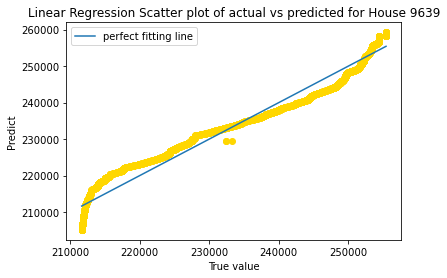

Training score for house 7017 is 0.9499967981045317
Testing score for house 7017 is 0.952224336120252


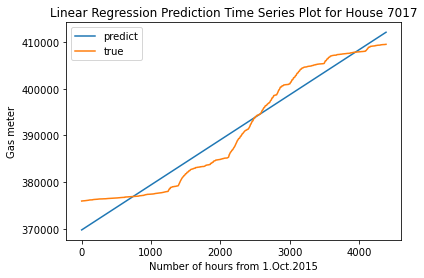

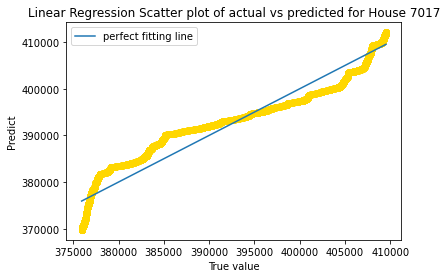

Training score for house 252 is 0.9617845302383343
Testing score for house 252 is 0.9625585841910227


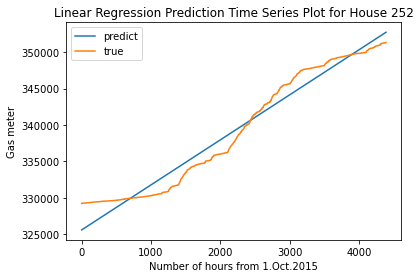

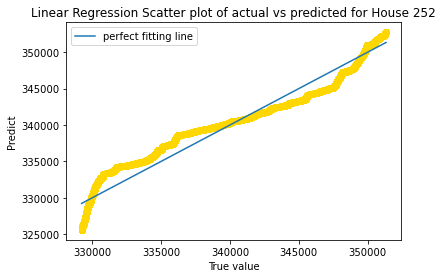

Training score for house 8829 is 0.9533930008125163
Testing score for house 8829 is 0.9574806068755927


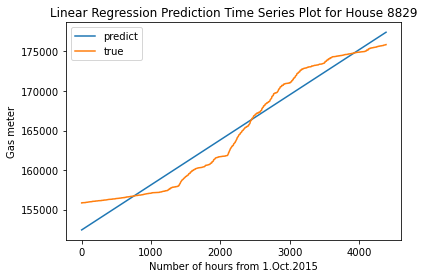

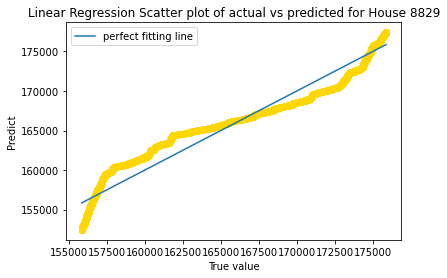

Training score for house 94 is 0.9683375418247677
Testing score for house 94 is 0.9677587072980562


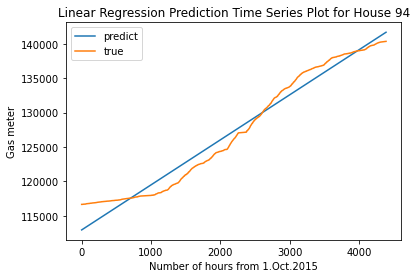

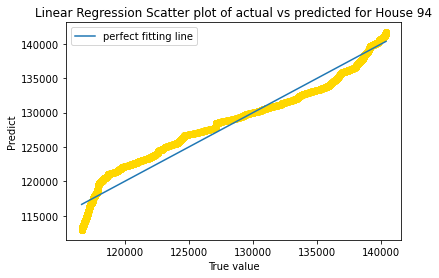

Training score for house 3039 is 0.9249988454662157
Testing score for house 3039 is 0.920928038930477


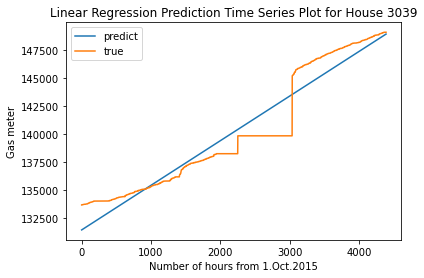

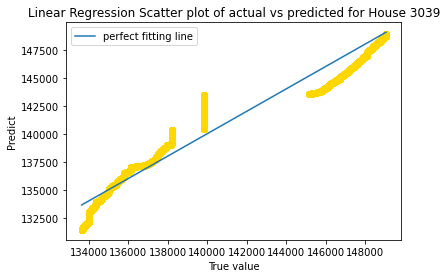

Training score for house 9121 is 0.9715940952604156
Testing score for house 9121 is 0.972324061002133


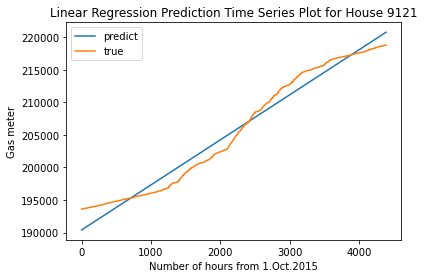

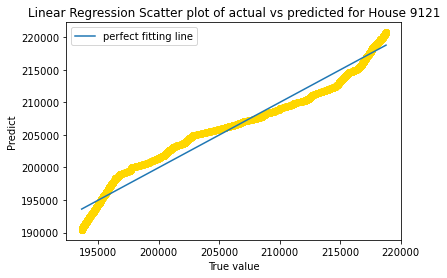

Training score for house 7741 is 0.9594296887319849
Testing score for house 7741 is 0.9593596962584929


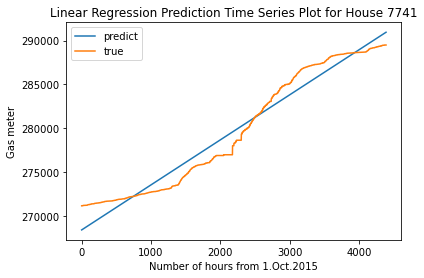

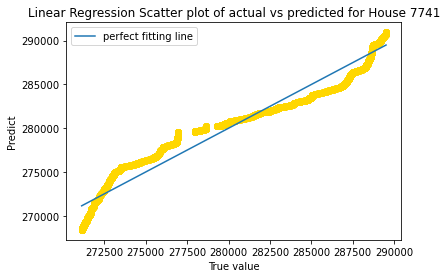

Training score for house 7919 is 0.8944434119160765
Testing score for house 7919 is 0.8898712443414388


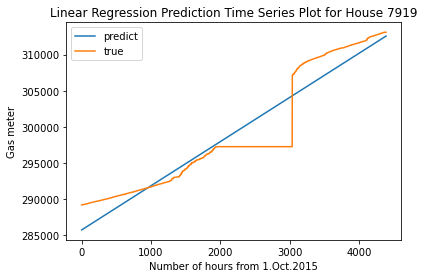

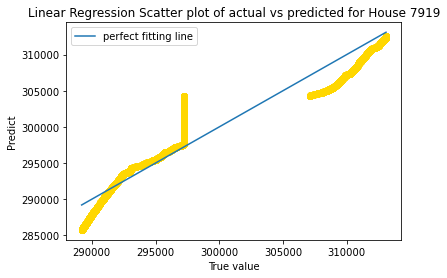

Training score for house 7674 is 0.961114413575609
Testing score for house 7674 is 0.9599523283389786


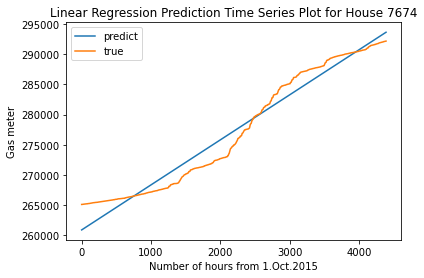

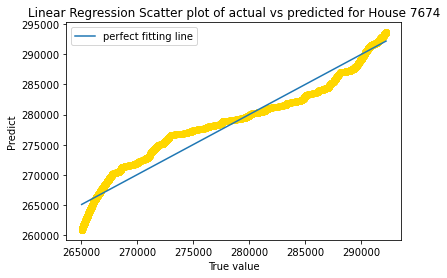

Training score for house 7030 is 0.9523461920699036
Testing score for house 7030 is 0.9596414657557786


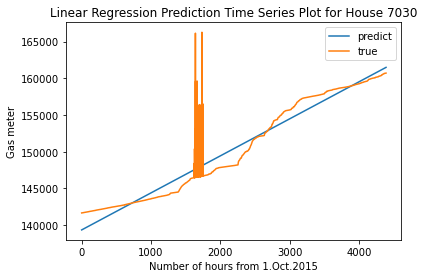

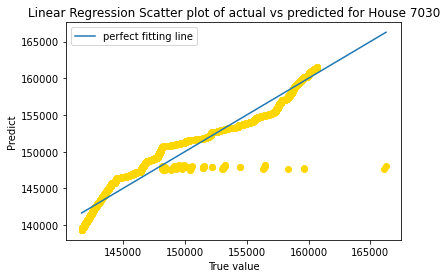

Training score for house 4732 is 0.9604128478150967
Testing score for house 4732 is 0.9597458651205464


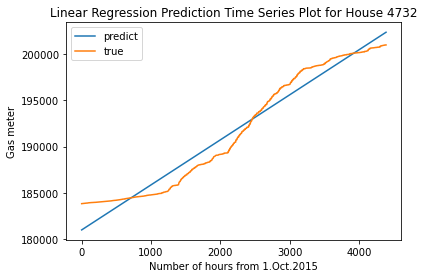

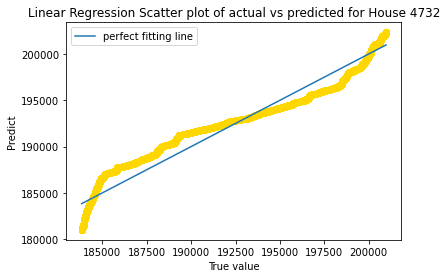

Training score for house 370 is 0.9466389651819127
Testing score for house 370 is 0.9471004604280422


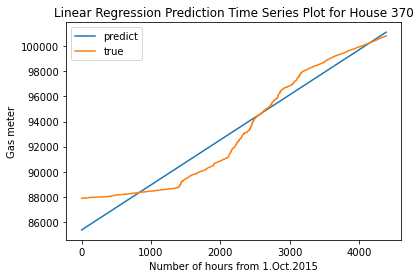

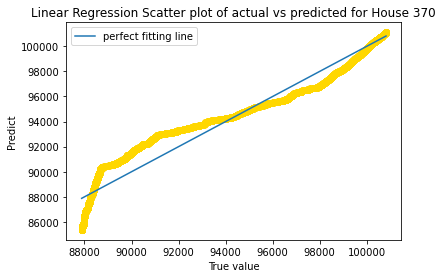

Training score for house 9295 is 0.9720574635007254
Testing score for house 9295 is 0.9725808186680114


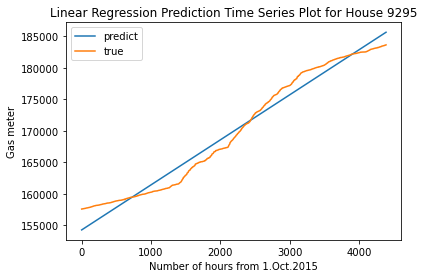

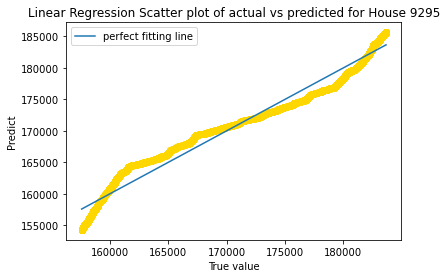

Training score for house 3577 is 0.9557875679217012
Testing score for house 3577 is 0.9571131367763036


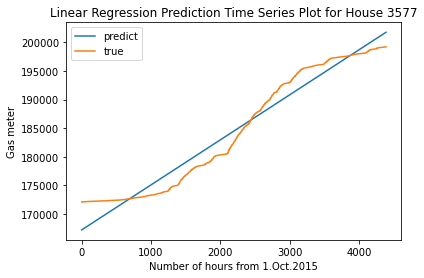

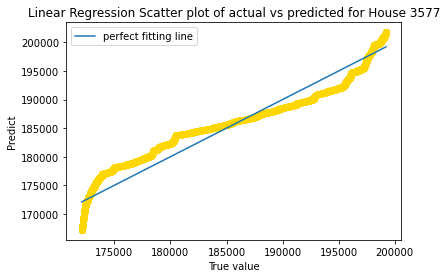

Training score for house 222 is 0.976288773060853
Testing score for house 222 is 0.9757049006778103


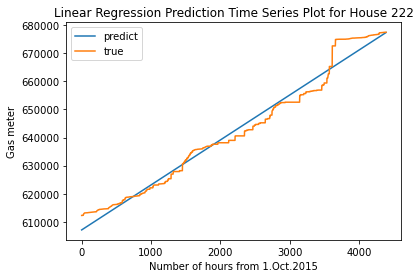

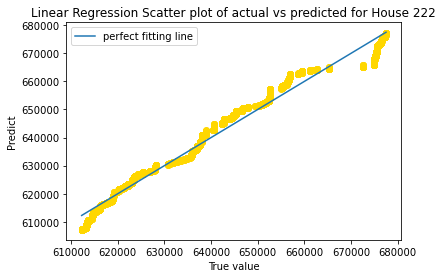

Training score for house 2449 is 0.9257922994233454
Testing score for house 2449 is 0.9193833105104916


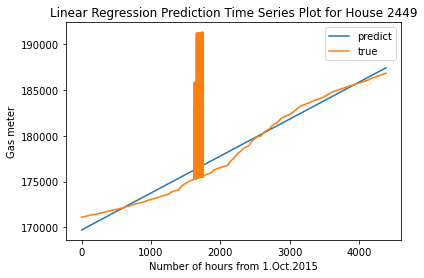

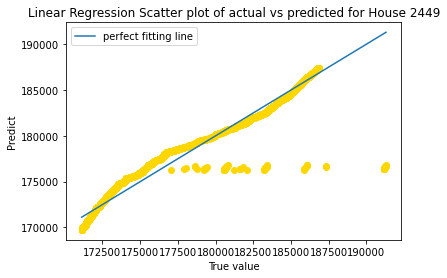

Training score for house 35 is 0.9842370309776282
Testing score for house 35 is 0.984824315450384


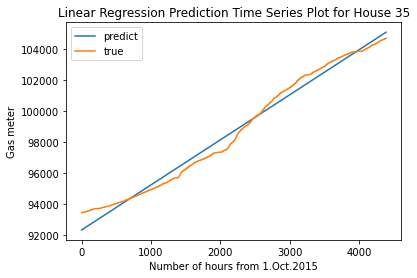

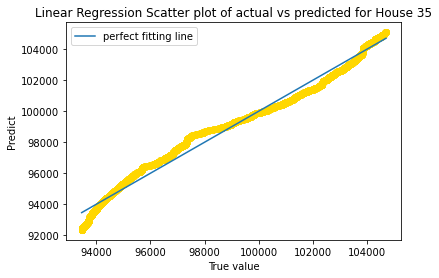

Training score for house 1697 is 0.98494616075299
Testing score for house 1697 is 0.9851829097341591


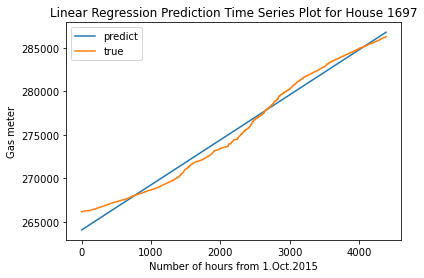

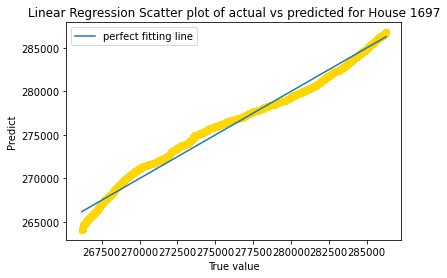

Training score for house 9134 is 0.9383092778652431
Testing score for house 9134 is 0.9477296713514226


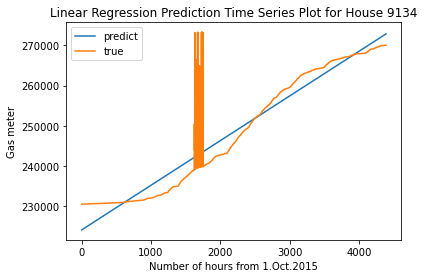

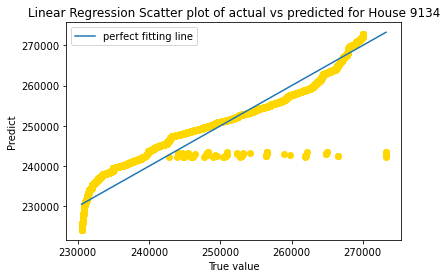

Training score for house 4767 is 0.9468217480674476
Testing score for house 4767 is 0.9463425276035311


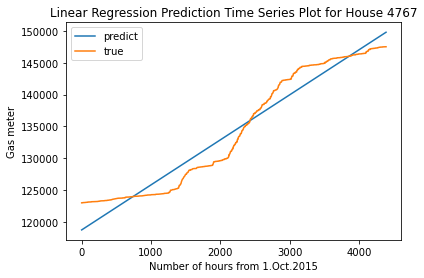

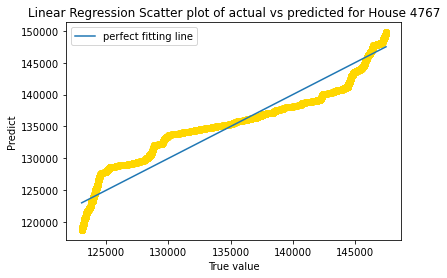

Training score for house 5785 is 0.9631726213315053
Testing score for house 5785 is 0.9616336001841345


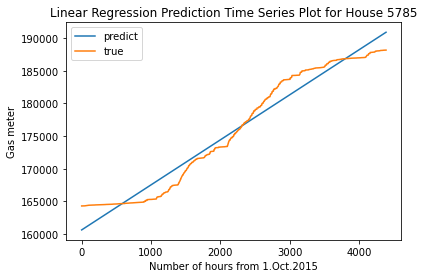

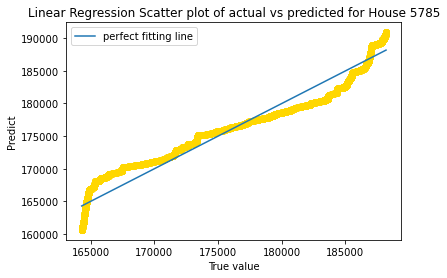

Training score for house 7739 is 0.9064701335495118
Testing score for house 7739 is 0.9037132534208252


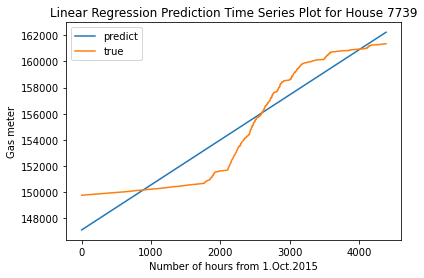

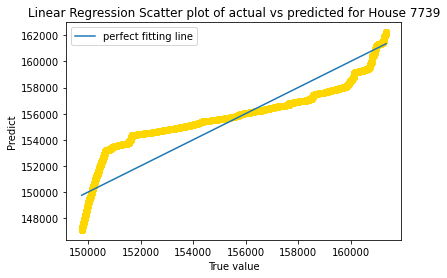

Training score for house 7117 is 0.9327123372607093
Testing score for house 7117 is 0.9354318401540433


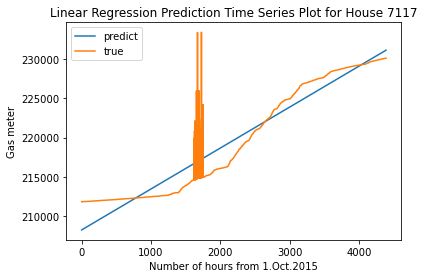

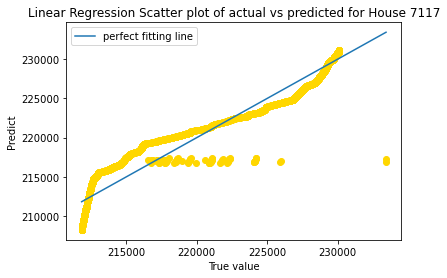

Training score for house 5193 is 0.9501813268264093
Testing score for house 5193 is 0.9497808260919423


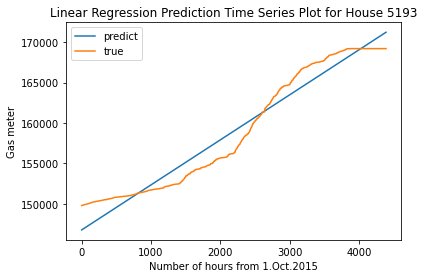

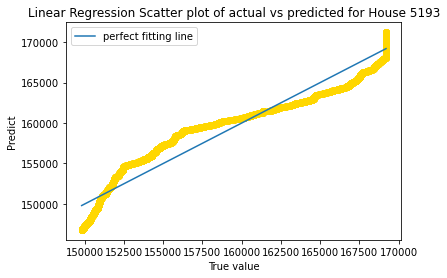

Training score for house 3367 is 0.9483284055523973
Testing score for house 3367 is 0.9476259297560726


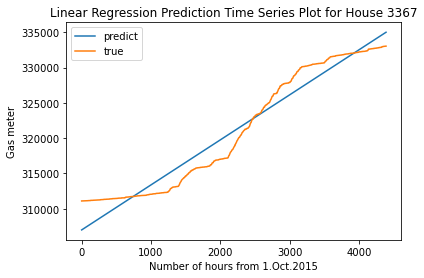

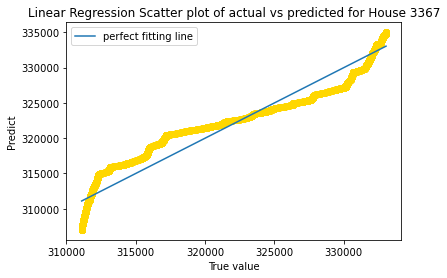

Training score for house 8467 is 0.9618424361527237
Testing score for house 8467 is 0.9607893291385169


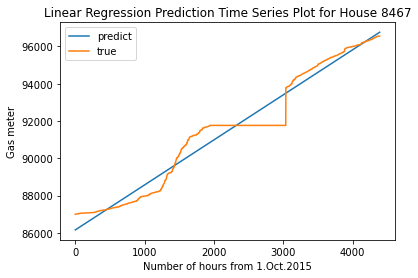

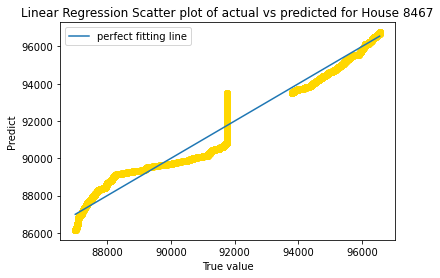

Training score for house 5972 is 0.965907903760139
Testing score for house 5972 is 0.9669934852796465


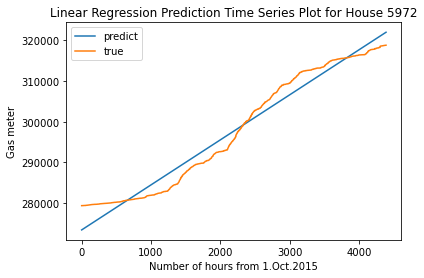

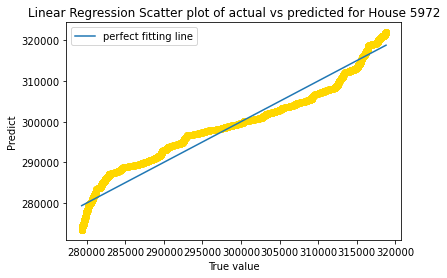

Training score for house 5439 is 0.9420550402407
Testing score for house 5439 is 0.944510626696778


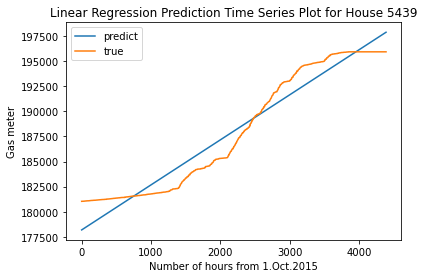

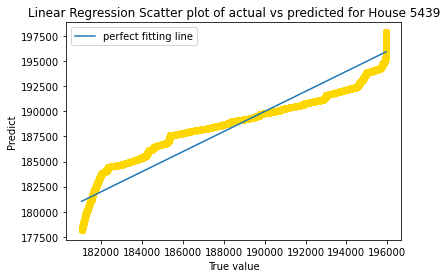

Training score for house 114 is 0.9637545676211833
Testing score for house 114 is 0.9607252807269435


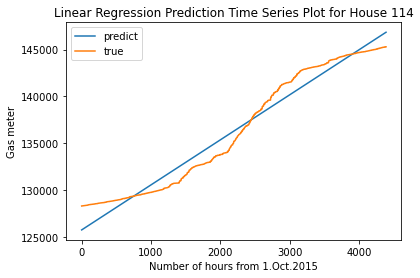

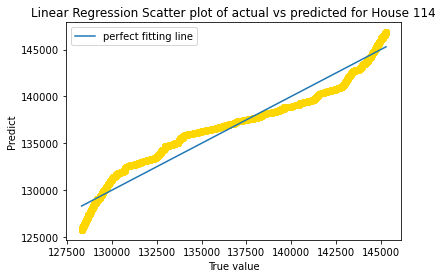

Training score for house 9474 is 0.8596160104458397
Testing score for house 9474 is 0.8622378682598548


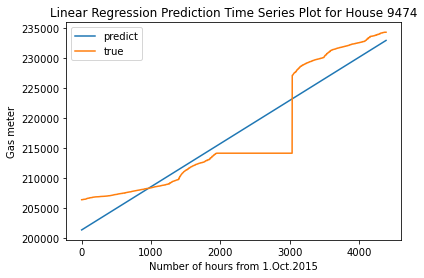

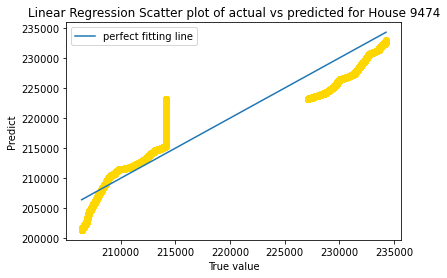

Training score for house 2335 is 0.9612442740136034
Testing score for house 2335 is 0.9609751640371099


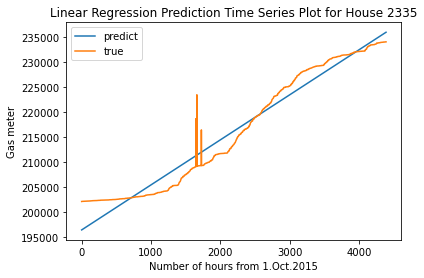

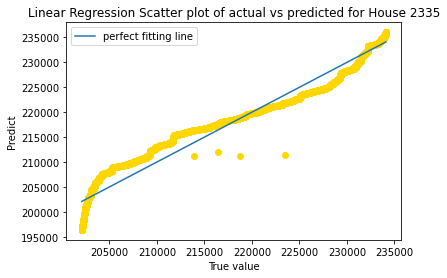

Training score for house 7460 is 0.8888123481922114
Testing score for house 7460 is 0.8799678310335262


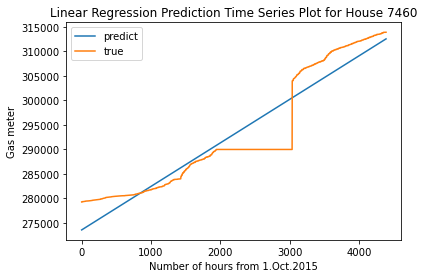

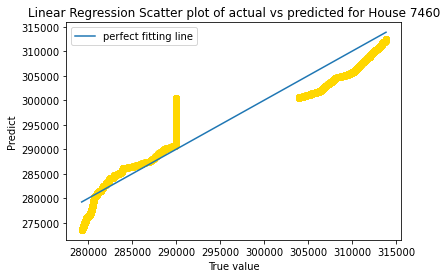

Training score for house 4998 is 0.9490846839482822
Testing score for house 4998 is 0.947389598893553


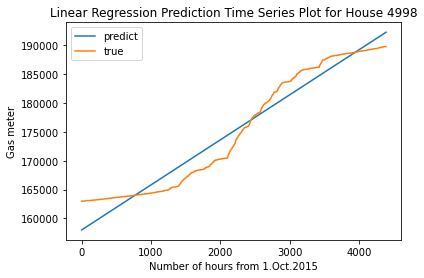

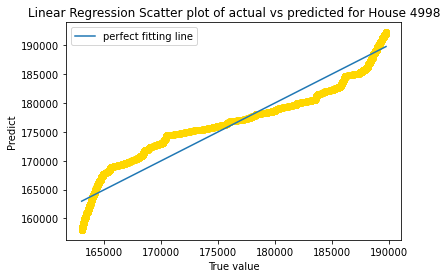

Training score for house 9278 is 0.960510997428961
Testing score for house 9278 is 0.9608700115063032


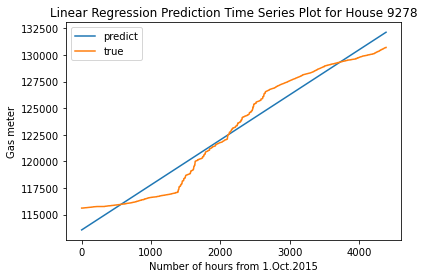

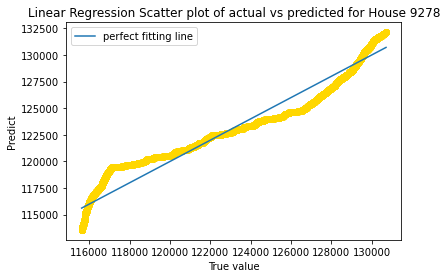

Training score for house 5129 is 0.9063549164546087
Testing score for house 5129 is 0.9038494899307719


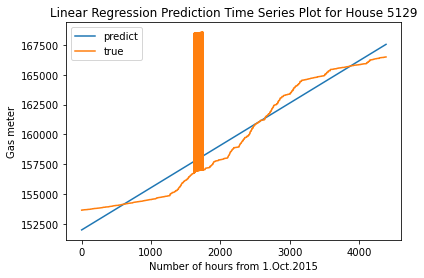

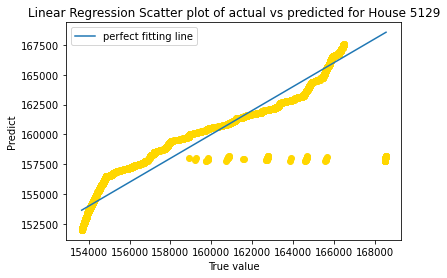

Training score for house 2018 is 0.9617522902244955
Testing score for house 2018 is 0.9612439226814814


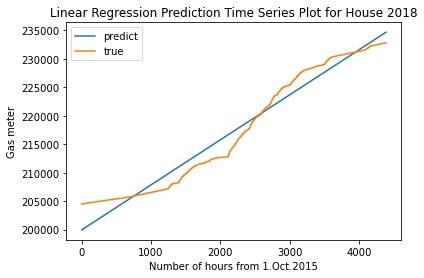

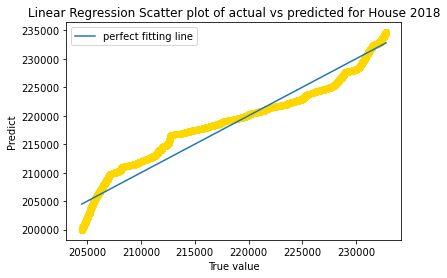

Training score for house 9052 is 0.9520192567241029
Testing score for house 9052 is 0.953701474079437


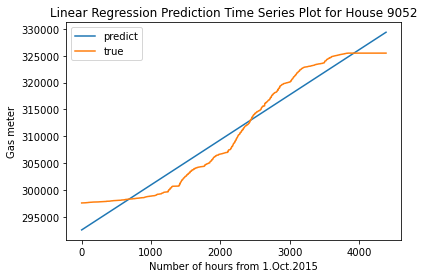

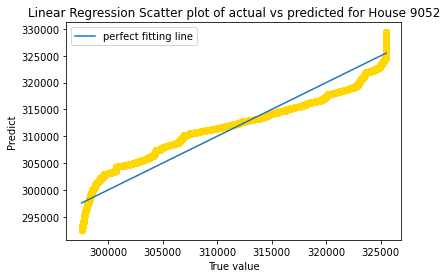

Training score for house 9956 is 0.933437686914897
Testing score for house 9956 is 0.9312400815142192


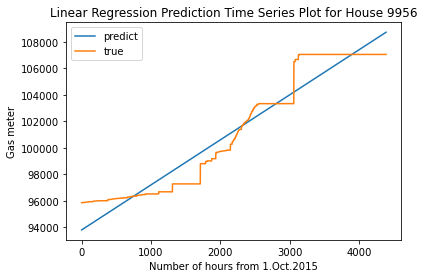

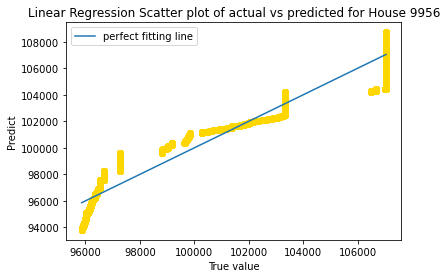

Training score for house 8155 is 0.9490451008525441
Testing score for house 8155 is 0.9507022674930319


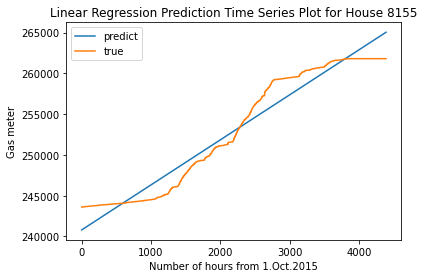

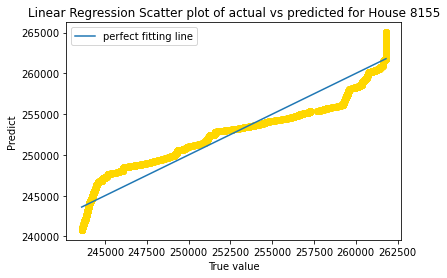

Training score for house 483 is 0.9468023757889756
Testing score for house 483 is 0.9419185744870582


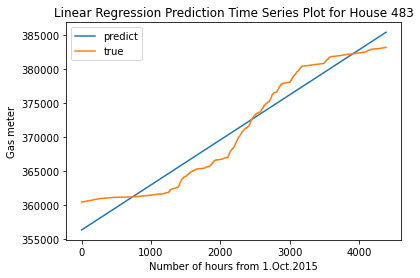

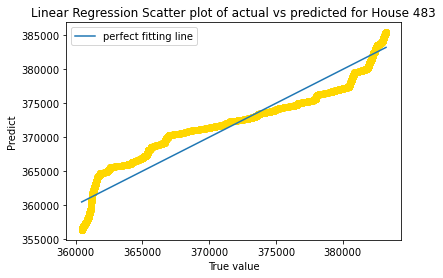

Training score for house 1556 is 0.9521369046431241
Testing score for house 1556 is 0.9497652386741648


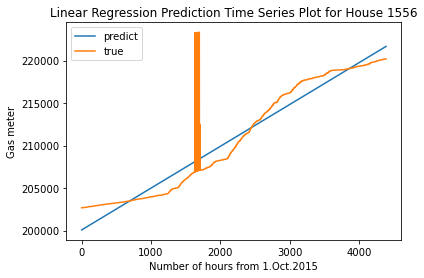

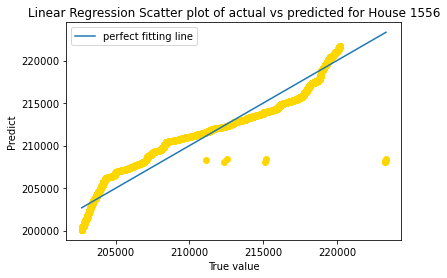

Training score for house 5636 is 0.9588963478871633
Testing score for house 5636 is 0.9587958714649494


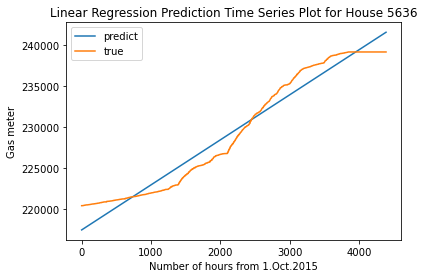

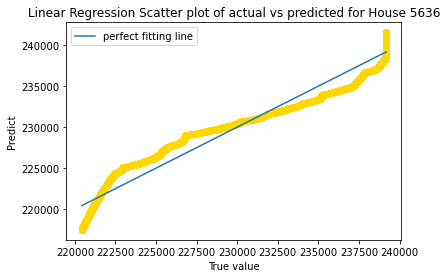

Training score for house 4029 is 0.9548255436377797
Testing score for house 4029 is 0.9509835343199216


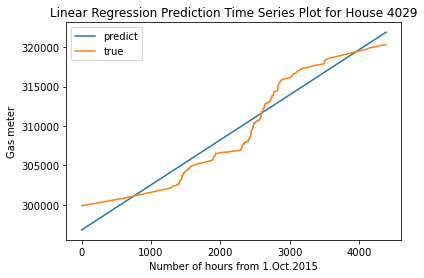

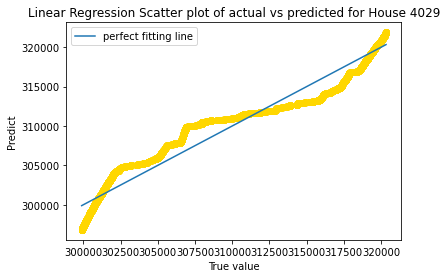

Training score for house 3544 is 0.8930029315275927
Testing score for house 3544 is 0.9014794360442552


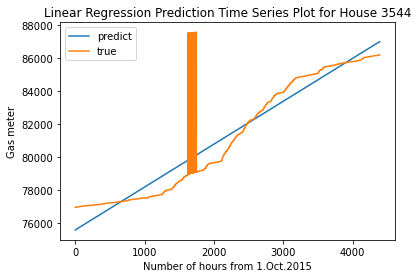

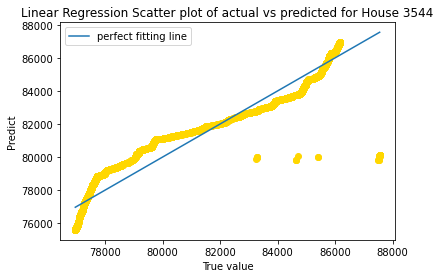

Training score for house 1791 is 0.9662997223922831
Testing score for house 1791 is 0.9656398763614632


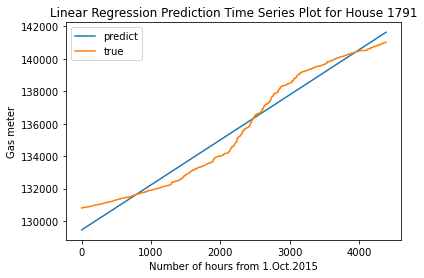

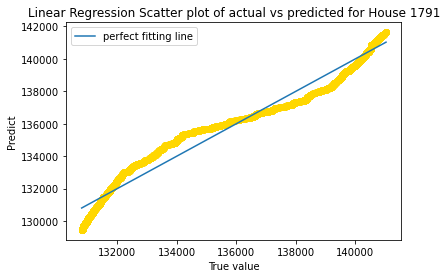

Training score for house 1801 is 0.9639230195011977
Testing score for house 1801 is 0.960239624443677


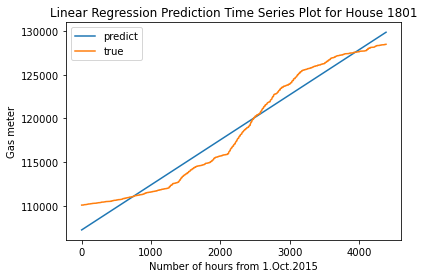

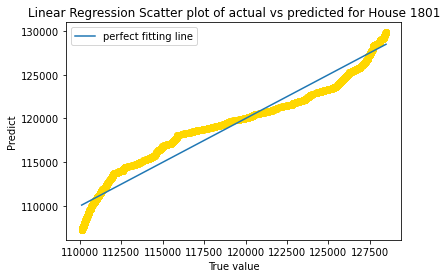

Training score for house 9729 is 0.9575463965097294
Testing score for house 9729 is 0.9606625977197946


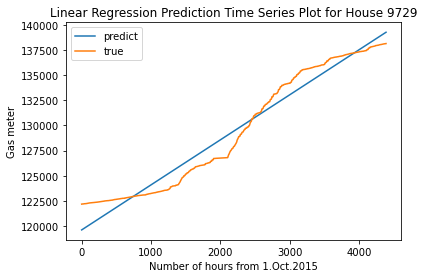

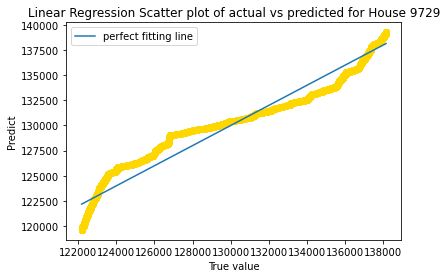

Training score for house 1283 is 0.9821780113284868
Testing score for house 1283 is 0.981501317749226


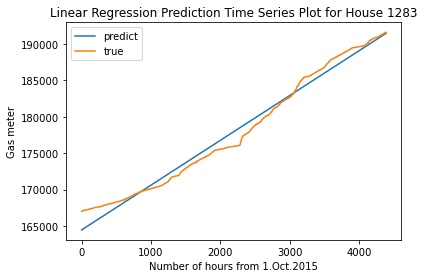

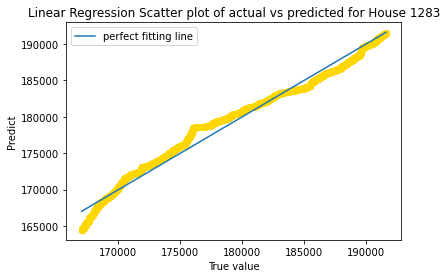

Training score for house 1792 is 0.9563259184987839
Testing score for house 1792 is 0.9578865382909498


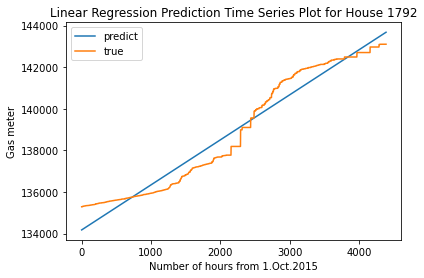

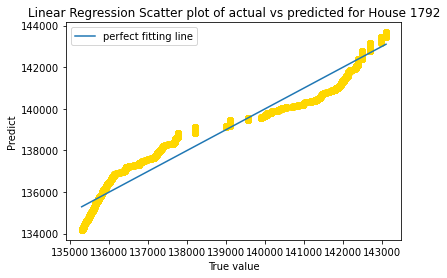

Training score for house 4031 is 0.9579095872412926
Testing score for house 4031 is 0.9524920035700919


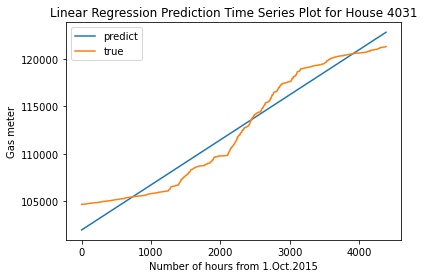

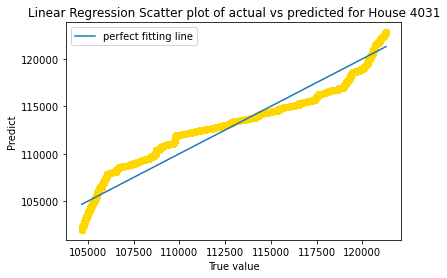

Training score for house 3893 is 0.9656342614942086
Testing score for house 3893 is 0.9657589745152304


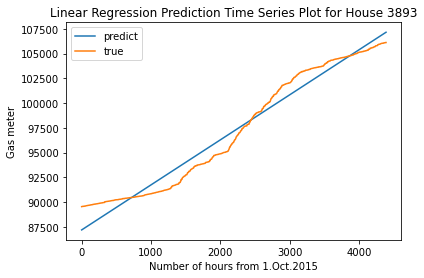

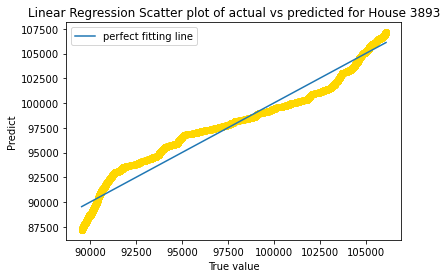

Training score for house 1185 is 0.9430534407645815
Testing score for house 1185 is 0.9462524918691501


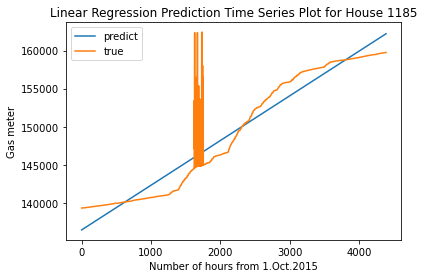

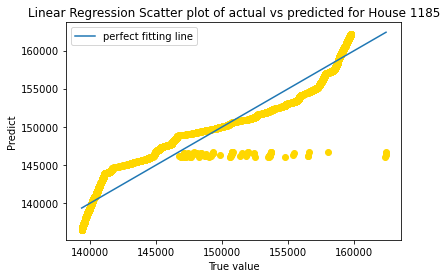

Training score for house 7682 is 0.9782211324794361
Testing score for house 7682 is 0.9781685333631244


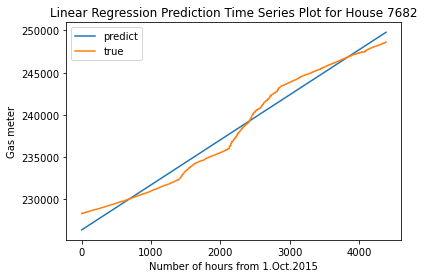

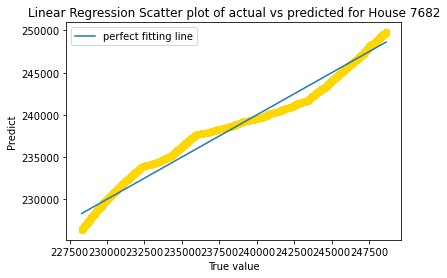

Training score for house 2638 is 0.8597618210629817
Testing score for house 2638 is 0.8666921927560465


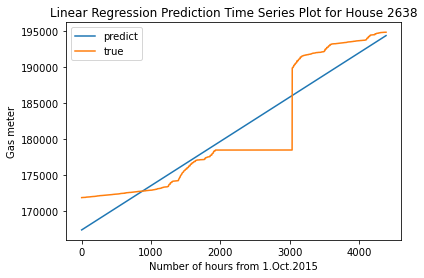

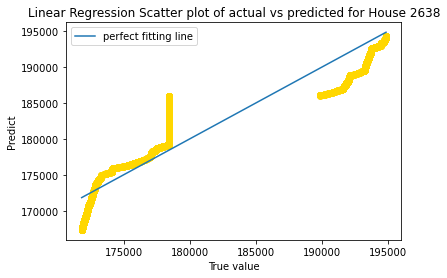

Training score for house 187 is 0.9610026921629036
Testing score for house 187 is 0.9617859501402495


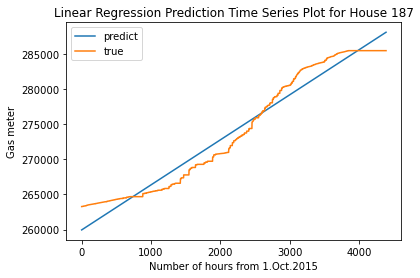

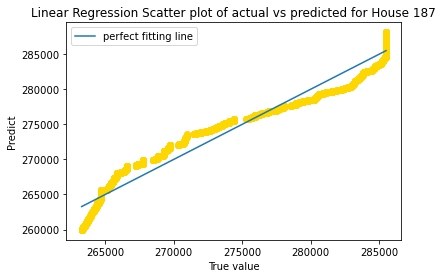

Training score for house 3723 is 0.9648759521232946
Testing score for house 3723 is 0.9640550757604163


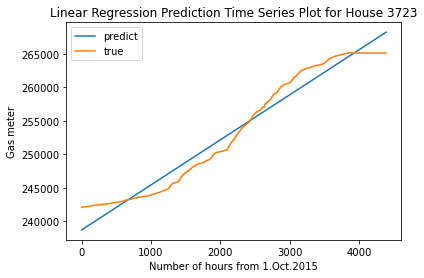

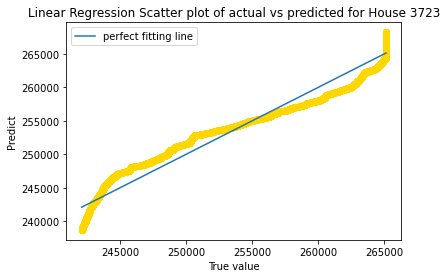

Training score for house 4514 is 0.9605786651642884
Testing score for house 4514 is 0.95683379539485


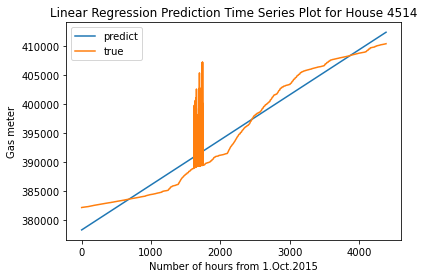

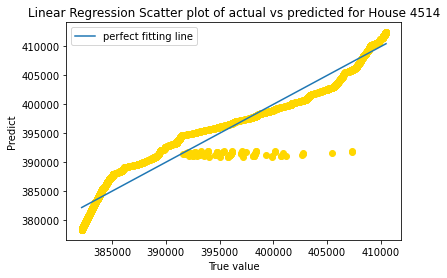

Training score for house 5814 is 0.9645940963749996
Testing score for house 5814 is 0.9644157173862018


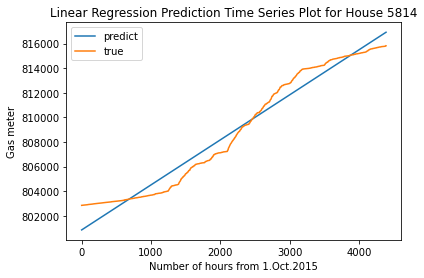

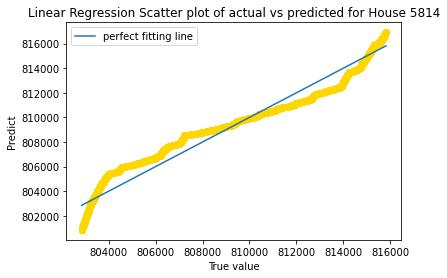

Training score for house 77 is 0.9966214742415551
Testing score for house 77 is 0.996309530127493


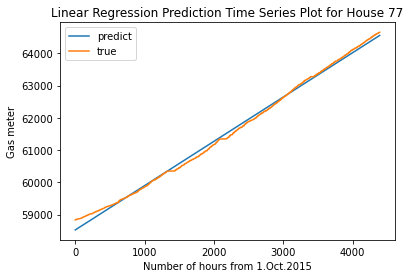

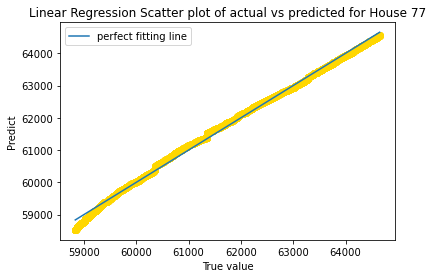

Training score for house 1619 is 0.9522489934272339
Testing score for house 1619 is 0.9536592615731306


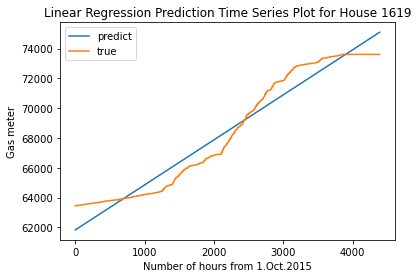

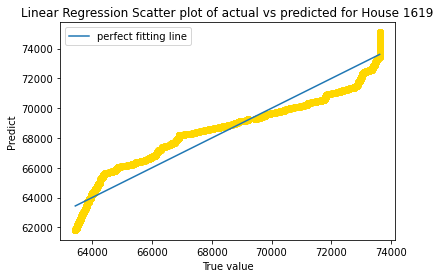

Training score for house 4421 is 0.8884216372583286
Testing score for house 4421 is 0.874607927899405


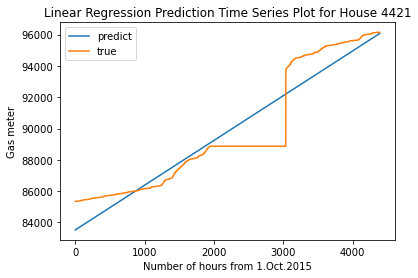

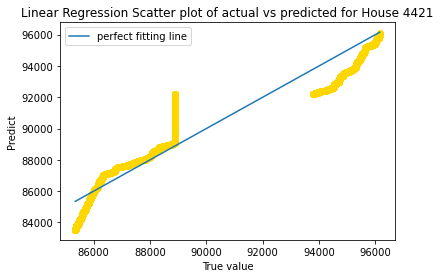

Training score for house 661 is 0.9661436919950318
Testing score for house 661 is 0.9658014805967297


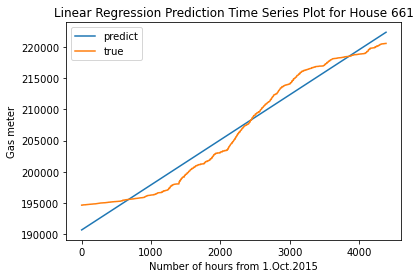

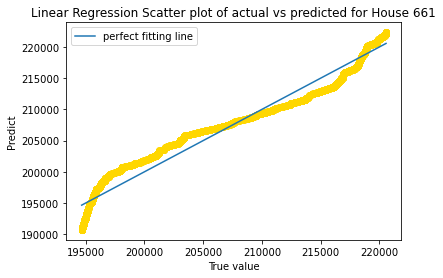

Training score for house 3134 is 0.955866190822807
Testing score for house 3134 is 0.9604142732317696


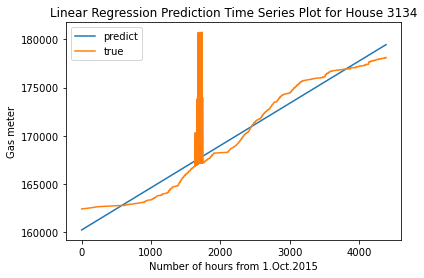

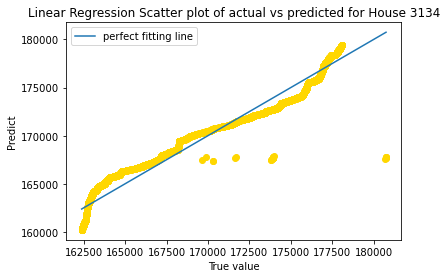

Training score for house 6836 is 0.8710099635888394
Testing score for house 6836 is 0.8532592585714149


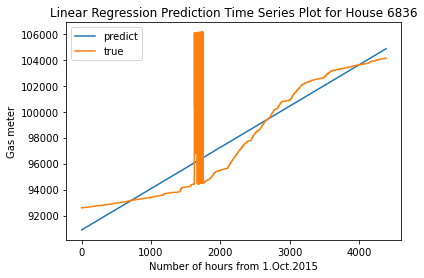

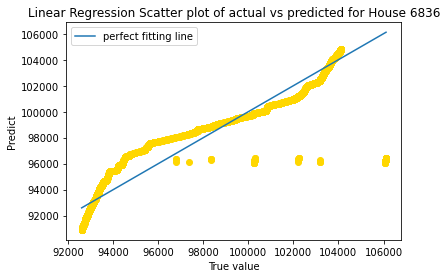

Training score for house 1042 is 0.9668696282587884
Testing score for house 1042 is 0.9647568162124878


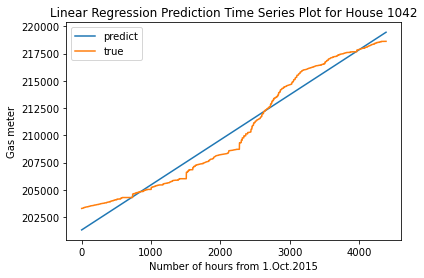

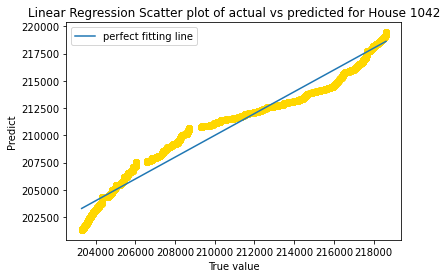

Training score for house 4373 is 0.956697386754527
Testing score for house 4373 is 0.9595003871648419


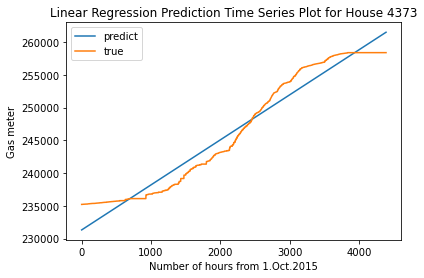

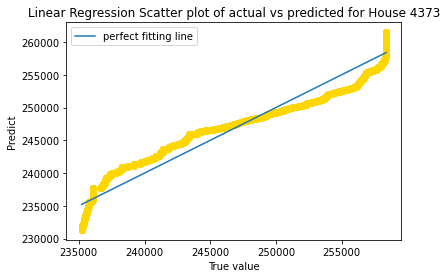

Training score for house 5484 is 0.9753235467413556
Testing score for house 5484 is 0.9769355406560115


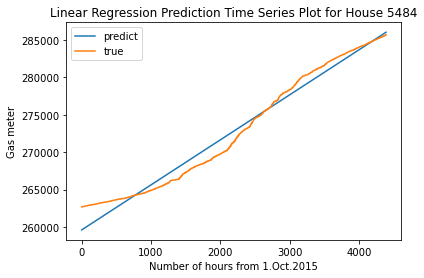

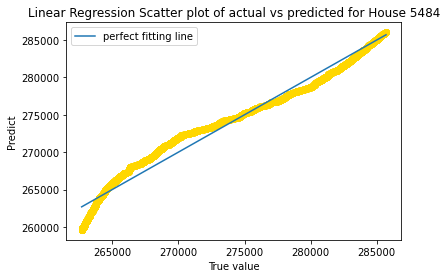

Training score for house 2072 is 0.9538627082034976
Testing score for house 2072 is 0.9542993145513833


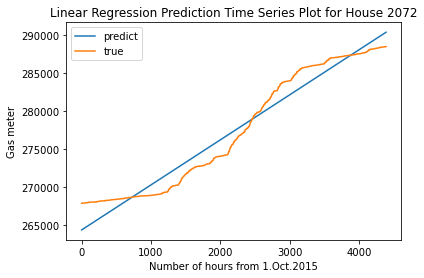

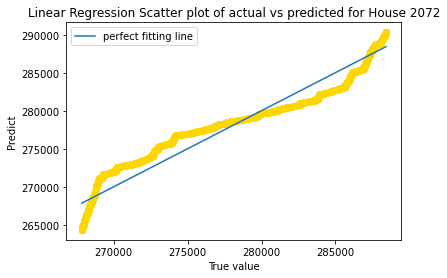

Training score for house 2461 is 0.9376676107351161
Testing score for house 2461 is 0.9352936062941092


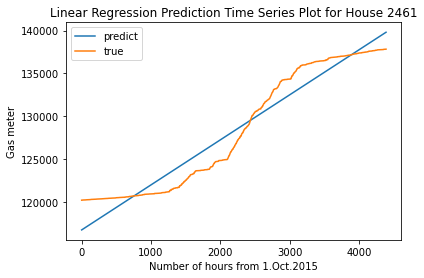

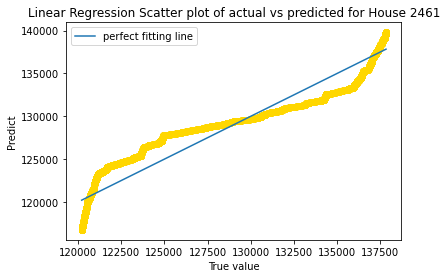

Training score for house 744 is 0.9580277576386508
Testing score for house 744 is 0.9578029138600709


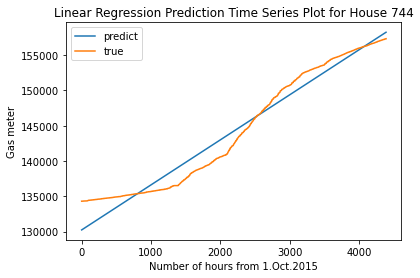

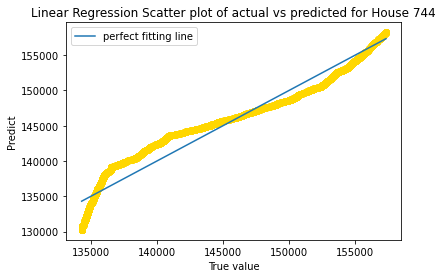

Training score for house 9982 is 0.9659779045537785
Testing score for house 9982 is 0.9546977227678801


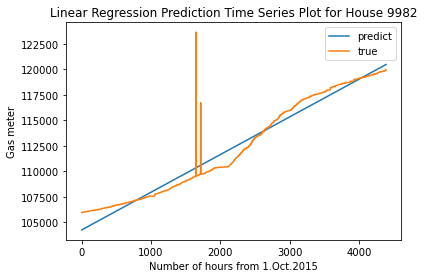

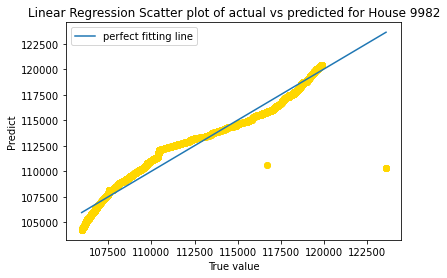

Training score for house 1790 is 0.9628775760347678
Testing score for house 1790 is 0.9623065070320965


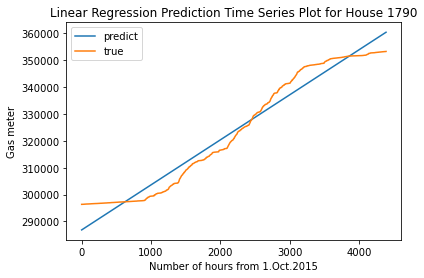

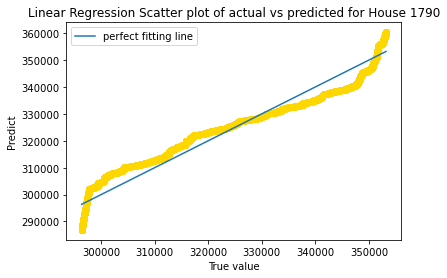

Training score for house 1800 is 0.9524365712149965
Testing score for house 1800 is 0.9506886717950304


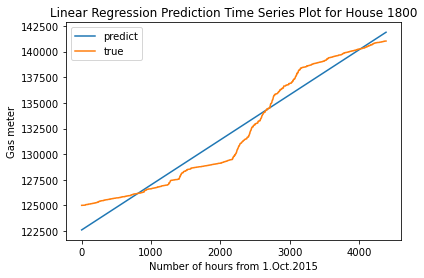

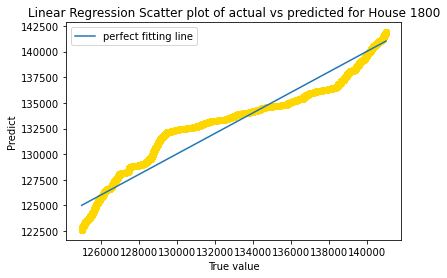

Training score for house 2980 is 0.9476813023781783
Testing score for house 2980 is 0.9476215096504269


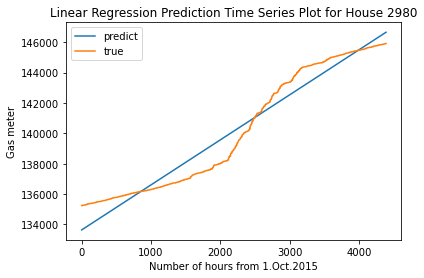

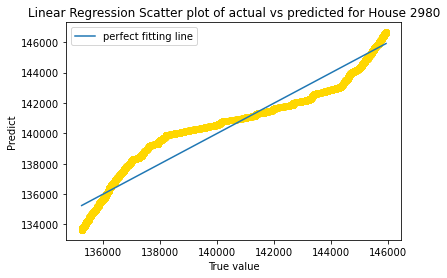

Training score for house 2094 is 0.9646045041117357
Testing score for house 2094 is 0.9647700582432276


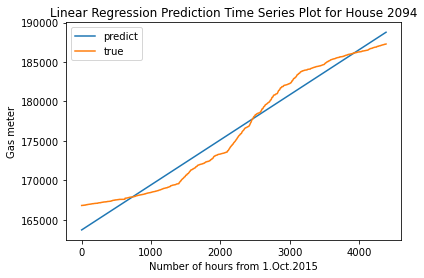

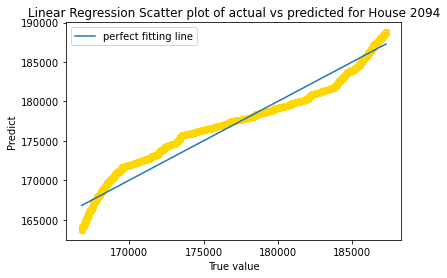

Training score for house 5892 is 0.9687726453716785
Testing score for house 5892 is 0.9697288878570698


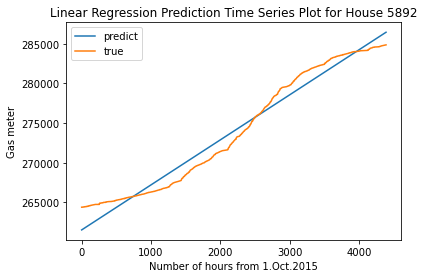

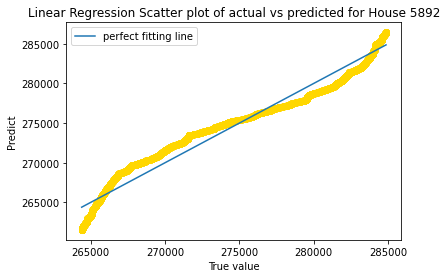

Training score for house 7900 is 0.952531837486443
Testing score for house 7900 is 0.9495688548894319


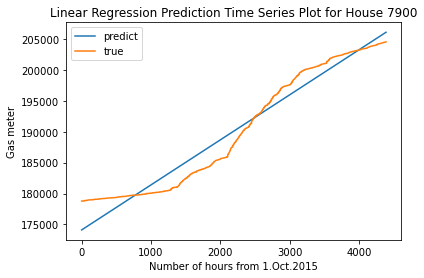

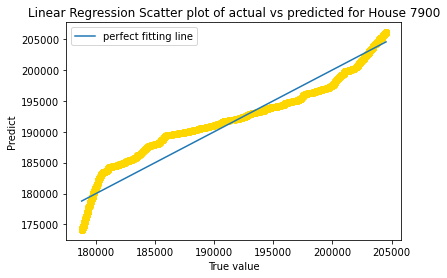

Training score for house 8084 is 0.9615030796883565
Testing score for house 8084 is 0.9601259324567134


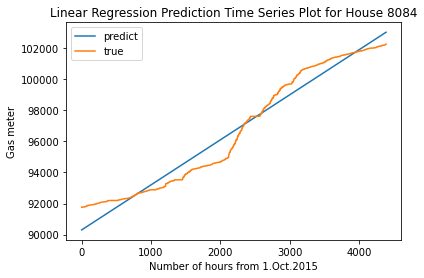

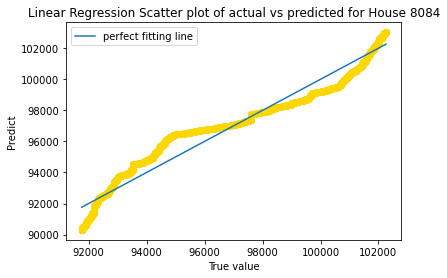

Training score for house 3527 is 0.9493403486439722
Testing score for house 3527 is 0.9505257518868984


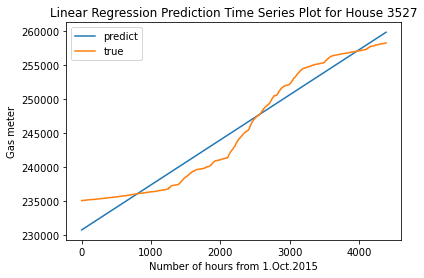

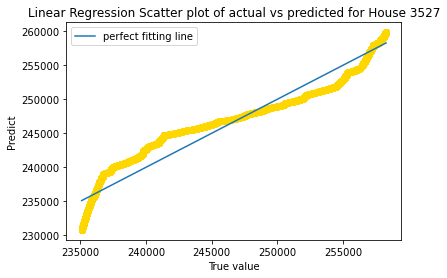

Training score for house 3849 is 0.9491324254751207
Testing score for house 3849 is 0.9514857218299875


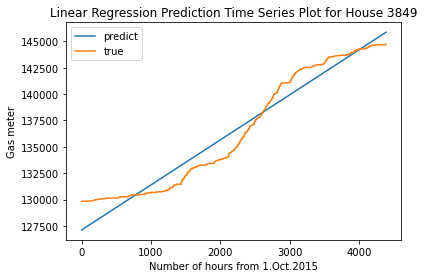

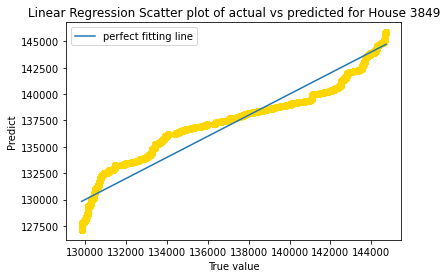

Training score for house 4356 is 0.9681295366916493
Testing score for house 4356 is 0.968103865374415


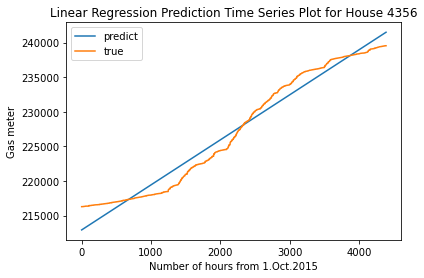

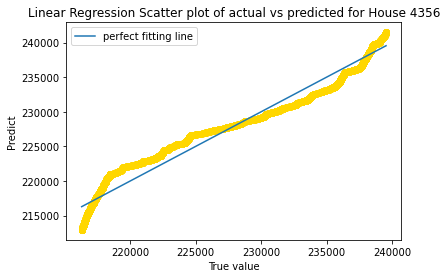

Training score for house 2129 is 0.9695485500926868
Testing score for house 2129 is 0.9676957737089554


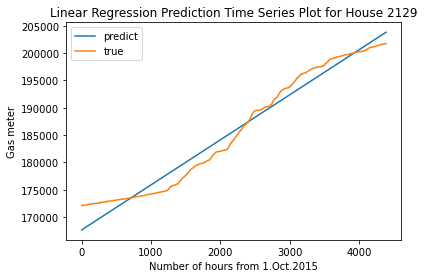

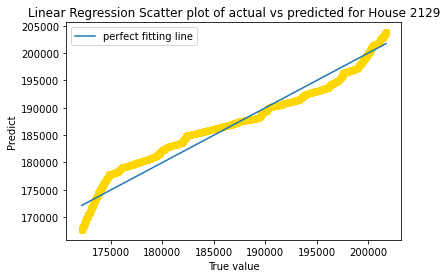

Training score for house 2965 is 0.9628942937267627
Testing score for house 2965 is 0.9620103622129708


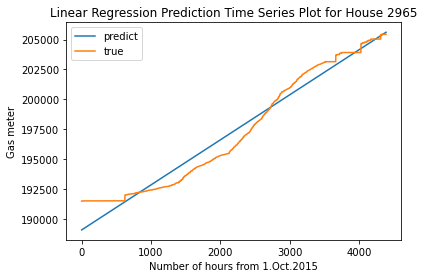

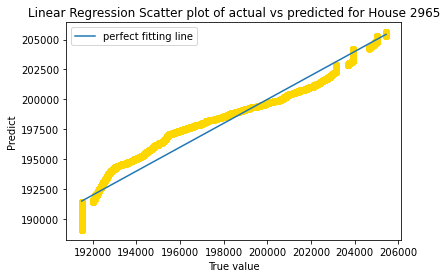

Training score for house 2575 is 0.9686363640065593
Testing score for house 2575 is 0.9709622545818506


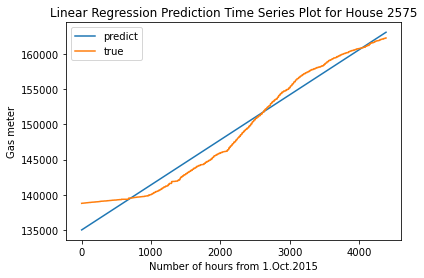

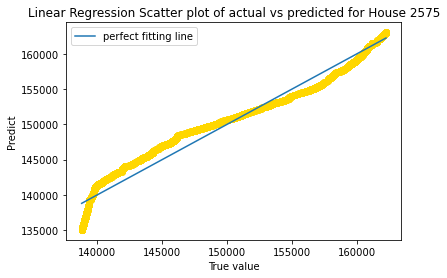

Training score for house 8086 is 0.9613915468528559
Testing score for house 8086 is 0.9618150837705434


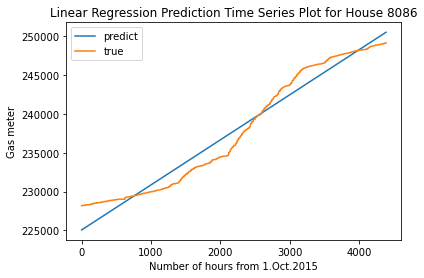

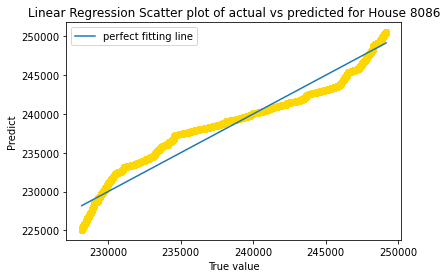

Training score for house 1415 is 0.9581595663753673
Testing score for house 1415 is 0.9570867867745568


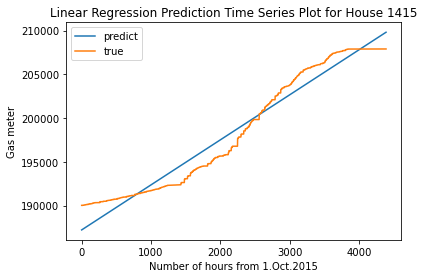

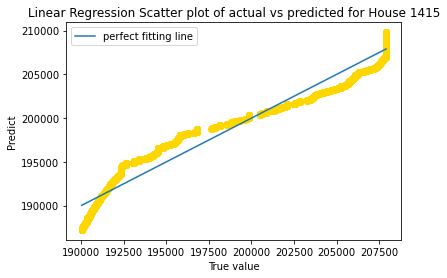

Training score for house 2233 is 0.936431666352855
Testing score for house 2233 is 0.9370815736902243


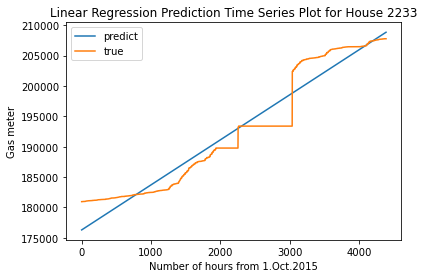

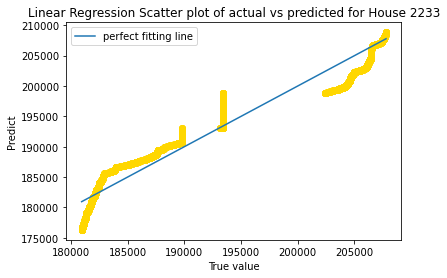

Training score for house 6863 is 0.87248425579197
Testing score for house 6863 is 0.8597718516106434


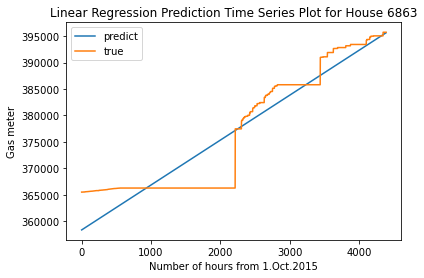

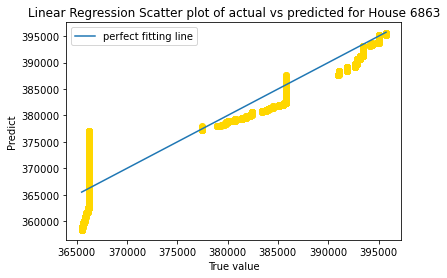

Training score for house 2470 is 0.9493213773386443
Testing score for house 2470 is 0.9477293142242893


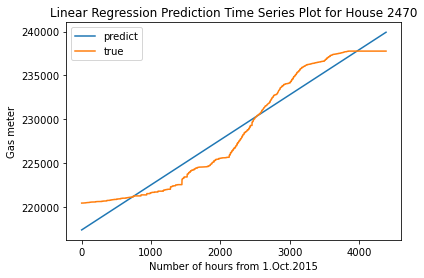

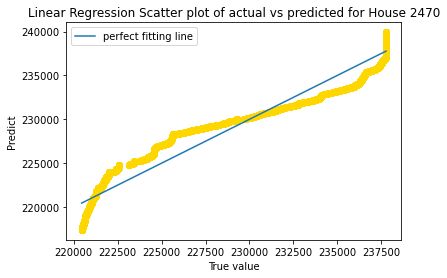

Training score for house 3778 is 0.9676729972672315
Testing score for house 3778 is 0.9700383765279936


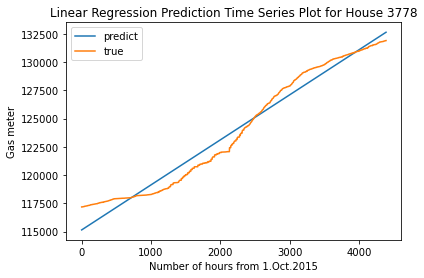

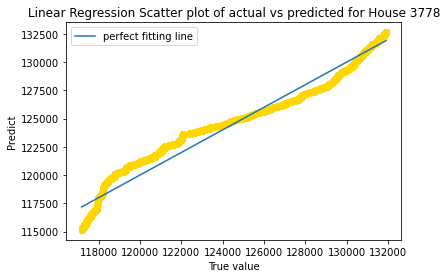

Training score for house 2378 is 0.9483491955277888
Testing score for house 2378 is 0.9467094853932723


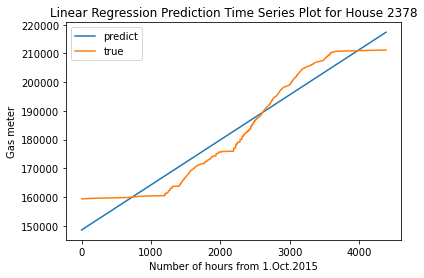

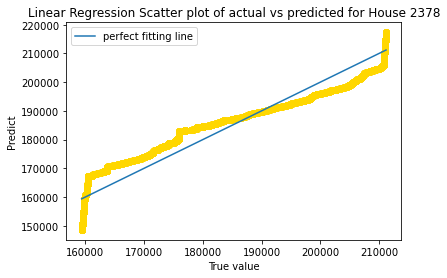

Training score for house 6830 is 0.9315725330956144
Testing score for house 6830 is 0.9307443513907457


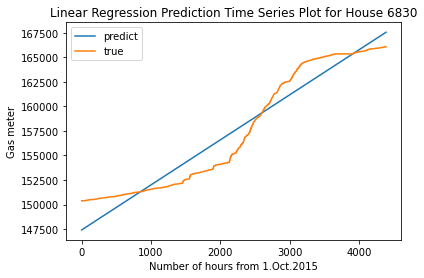

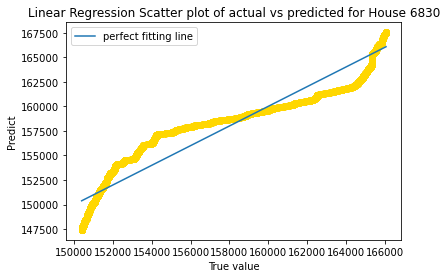

Training score for house 9766 is 0.9658659352767227
Testing score for house 9766 is 0.9671641924740858


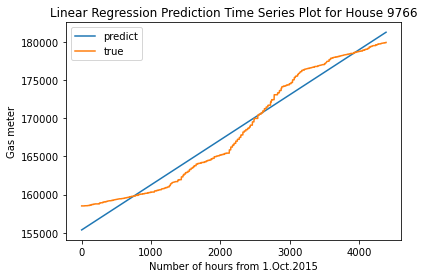

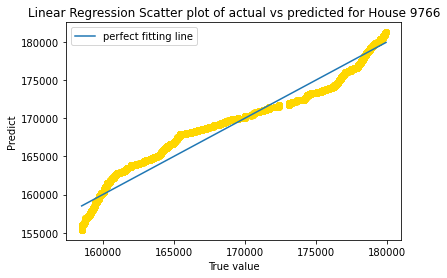

Training score for house 4193 is 0.9440404755156253
Testing score for house 4193 is 0.9441000348984916


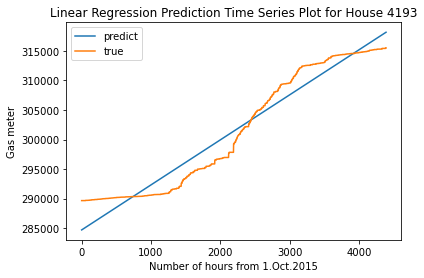

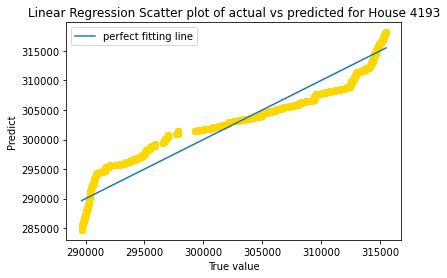

Training score for house 8703 is 0.9092180606365865
Testing score for house 8703 is 0.9139574636807237


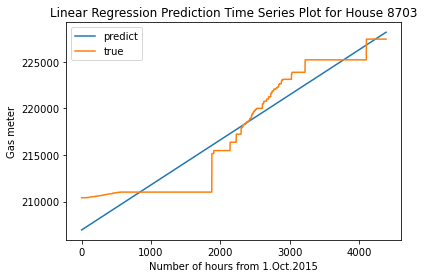

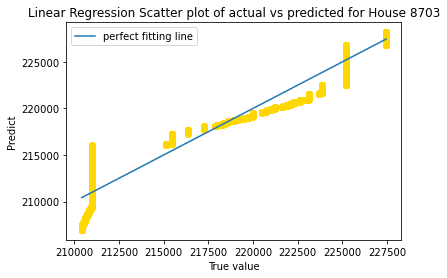

Training score for house 6578 is 0.922335138746285
Testing score for house 6578 is 0.9159068492802915


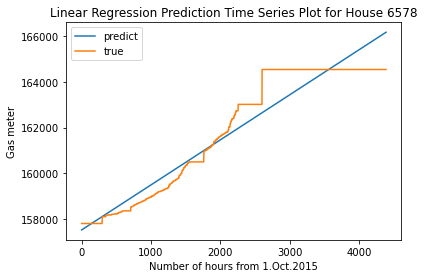

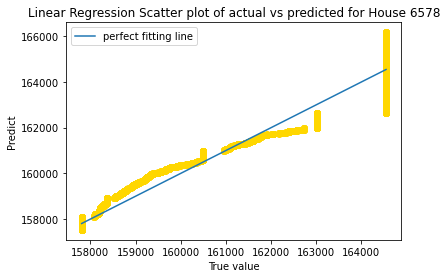

Training score for house 4228 is 0.9657578432852196
Testing score for house 4228 is 0.9663702129477216


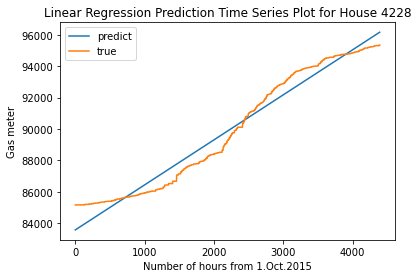

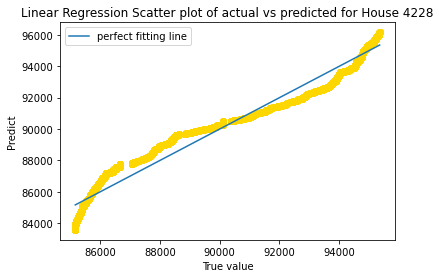

Training score for house 2645 is 0.905262552994503
Testing score for house 2645 is 0.905307889109519


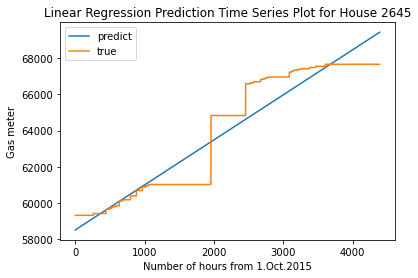

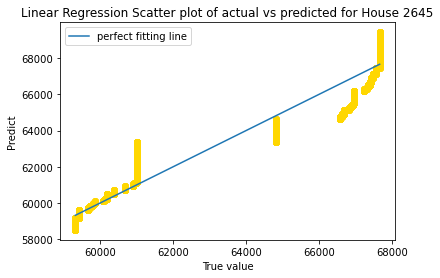

Training score for house 6505 is 0.9500515702276049
Testing score for house 6505 is 0.9498156699342925


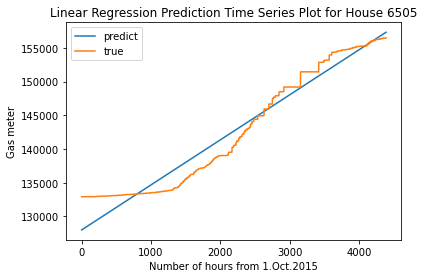

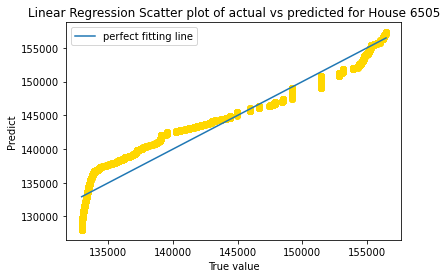

Training score for house 5395 is 0.9610115919905446
Testing score for house 5395 is 0.9609091544728839


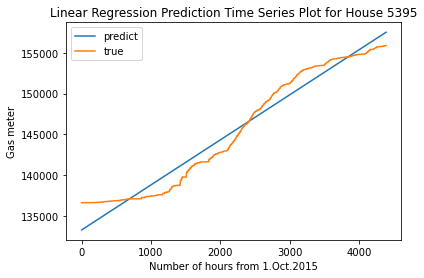

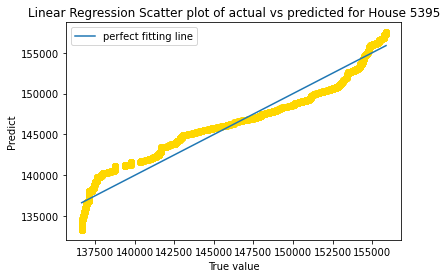

Training score for house 8059 is 0.9468499042955403
Testing score for house 8059 is 0.9494046531723309


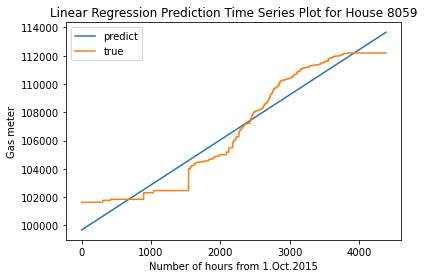

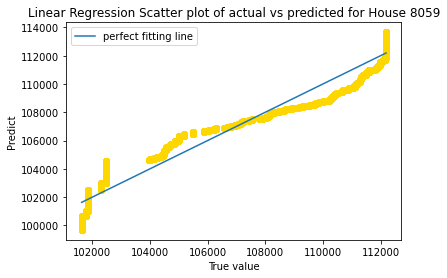

Training score for house 7965 is 0.9798187033063779
Testing score for house 7965 is 0.9794924911448656


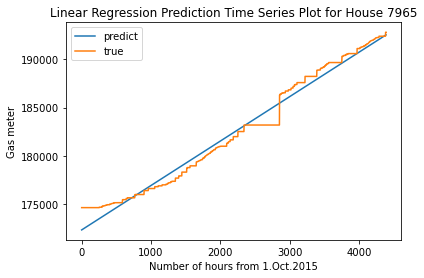

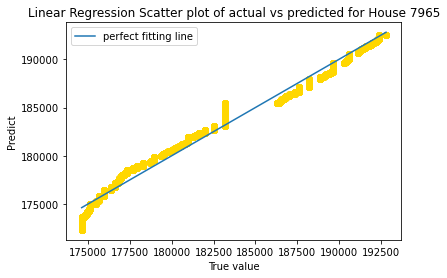

Training score for house 44 is 0.9812159971419866
Testing score for house 44 is 0.981349508652632


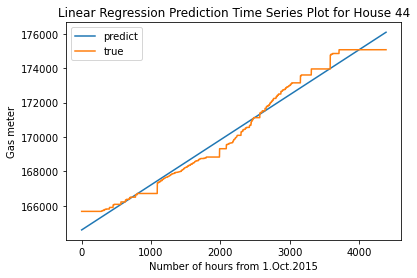

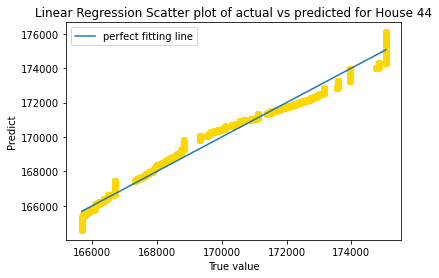

Training score for house 4671 is 0.84996923623361
Testing score for house 4671 is 0.8439146302767034


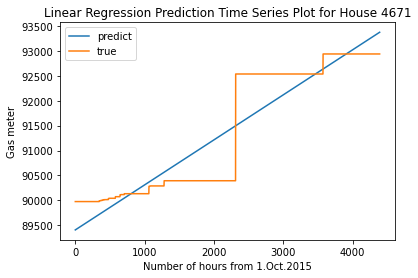

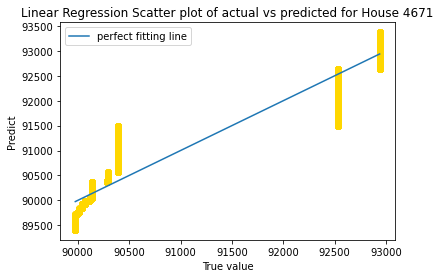

Training score for house 6685 is 0.9258268714244111
Testing score for house 6685 is 0.9249679516257262


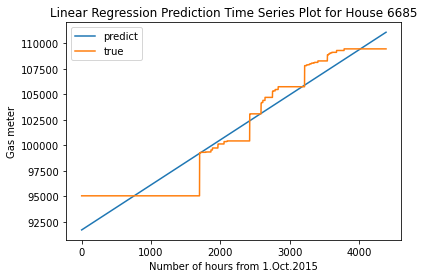

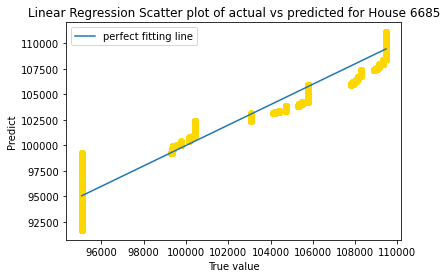

Training score for house 7989 is 0.9632445555170592
Testing score for house 7989 is 0.9627453751940155


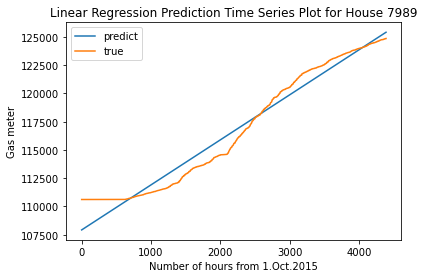

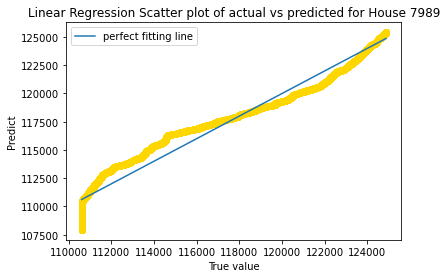

Training score for house 2945 is 0.9589946908986533
Testing score for house 2945 is 0.9585987330790761


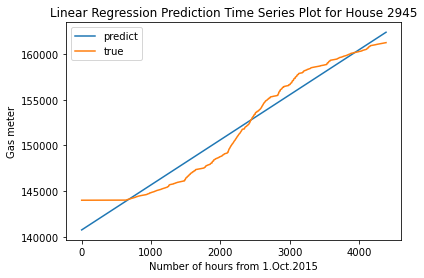

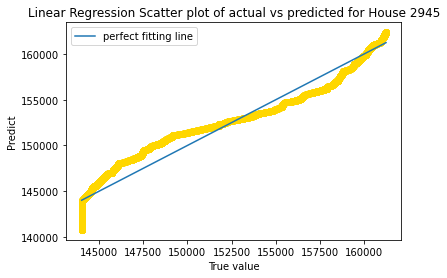

Training score for house 2818 is 0.9518471437627618
Testing score for house 2818 is 0.9511636081270807


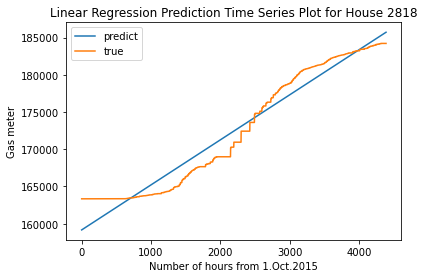

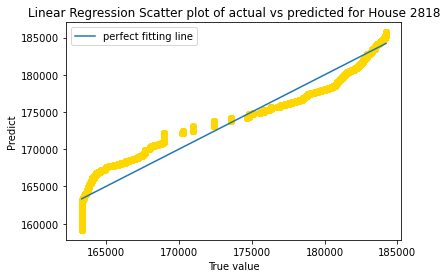

Training score for house 7016 is 0.9318835114691723
Testing score for house 7016 is 0.933000467084922


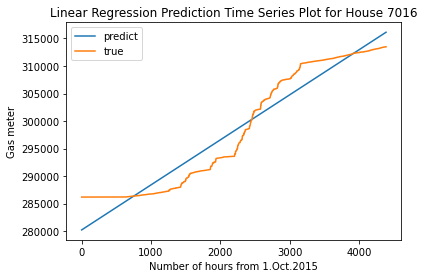

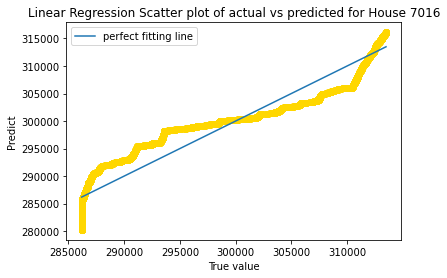

Training score for house 8967 is 0.8729762762757253
Testing score for house 8967 is 0.8719829212693193


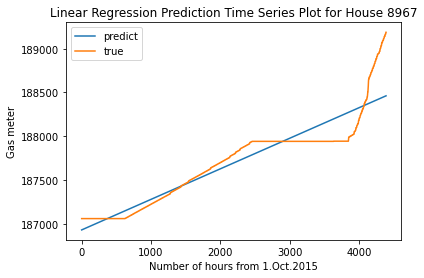

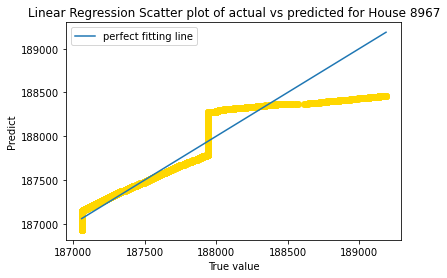

Training score for house 3310 is 0.9247612873426179
Testing score for house 3310 is 0.9221255762164547


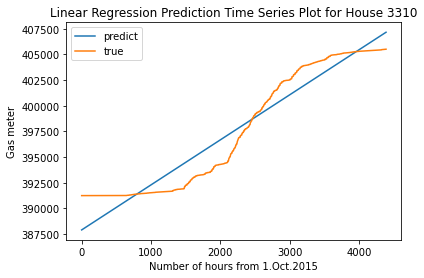

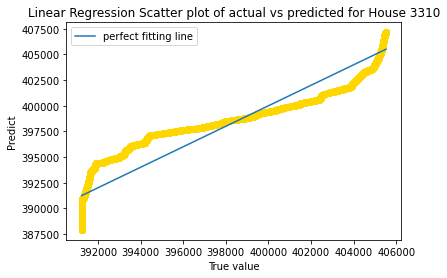

Training score for house 3918 is 0.9552390899948519
Testing score for house 3918 is 0.9565643999011453


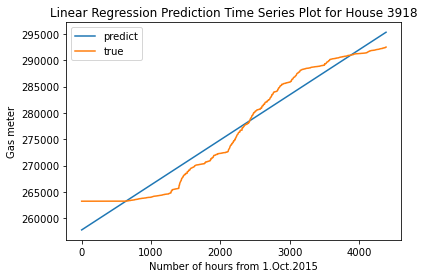

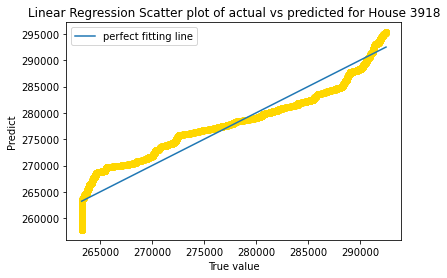

Training score for house 8386 is 0.9313592202039019
Testing score for house 8386 is 0.9321025818908584


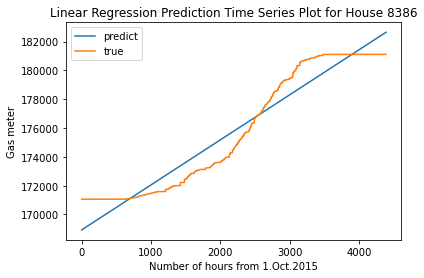

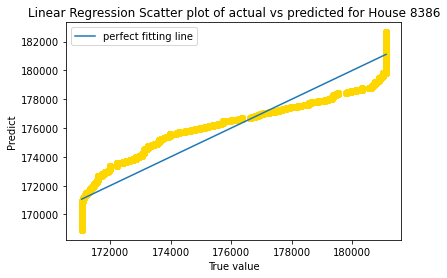

Training score for house 1103 is 0.9105776853849927
Testing score for house 1103 is 0.9114644050905427


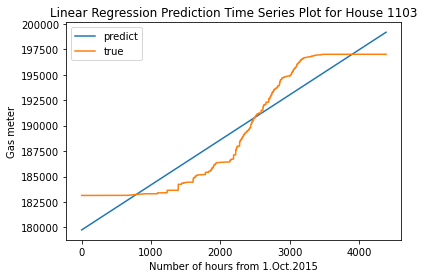

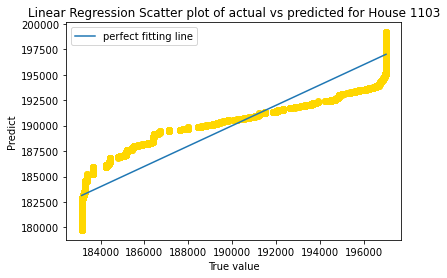

Training score for house 9620 is 0.861161126231371
Testing score for house 9620 is 0.8612750985605722


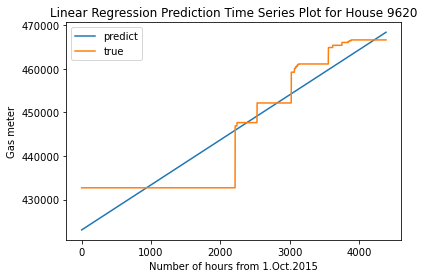

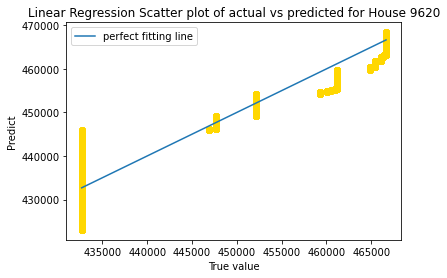

Training score for house 5658 is 0.9505641243530112
Testing score for house 5658 is 0.9537699903895929


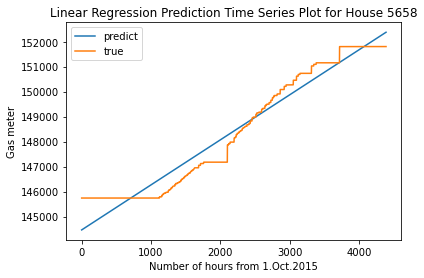

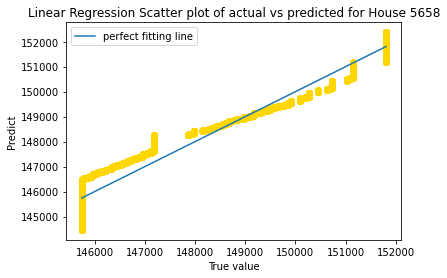

Training score for house 5545 is 0.8350687385302544
Testing score for house 5545 is 0.8454705719594656


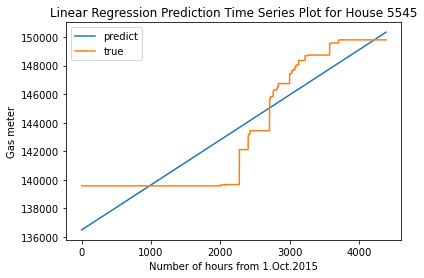

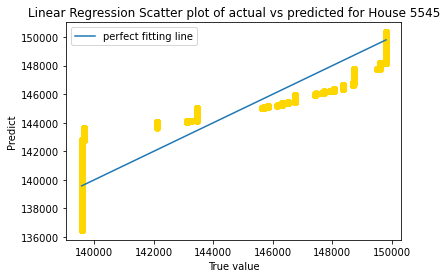

Training score for house 5317 is 0.7606590969090055
Testing score for house 5317 is 0.7701175533221202


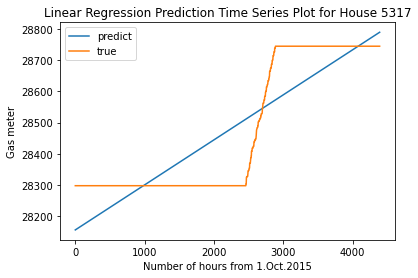

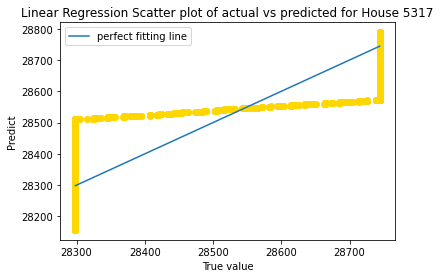

Training score for house 3036 is 0.7611351087731332
Testing score for house 3036 is 0.7588369886629933


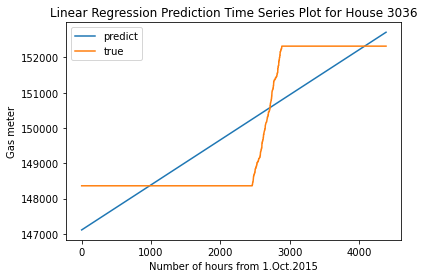

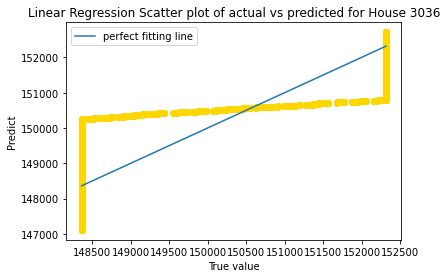

Training score for house 9160 is 0.7580377464221906
Testing score for house 9160 is 0.7604678358684314


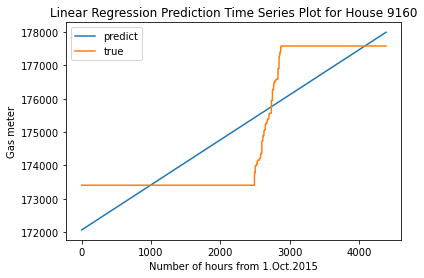

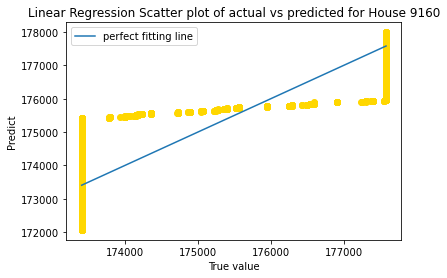

Training score for house 8244 is 0.7622221995660479
Testing score for house 8244 is 0.7500612211962301


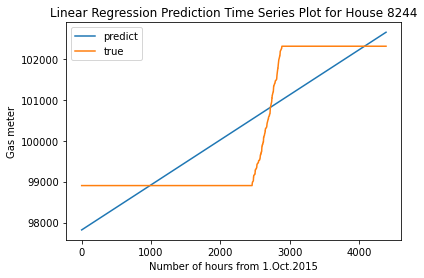

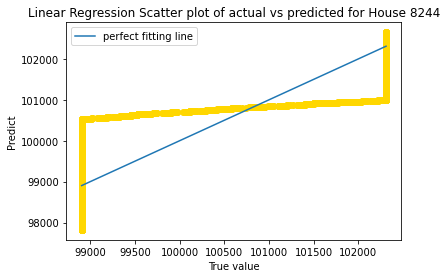

Training score for house 2755 is 0.7585404989373733
Testing score for house 2755 is 0.7682901070485725


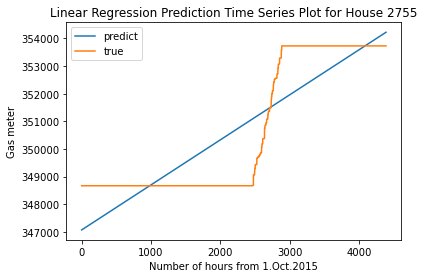

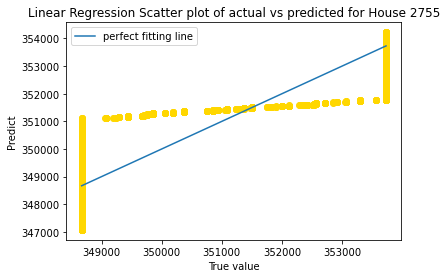

Training score for house 9600 is 0.7569647315274716
Testing score for house 9600 is 0.7709000857299522


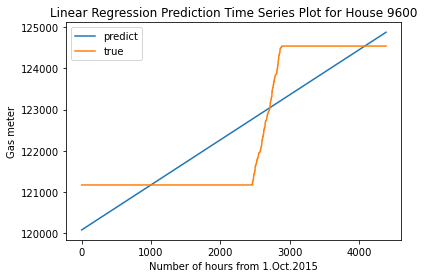

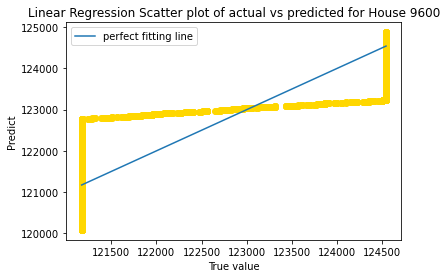

Training score for house 2946 is 0.7544902989373677
Testing score for house 2946 is 0.7593280188546765


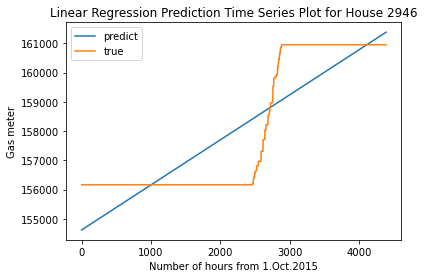

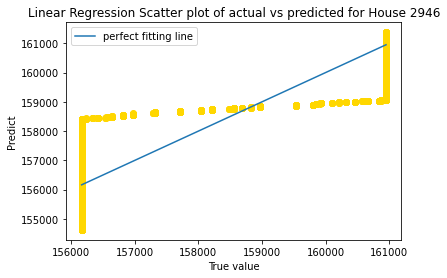

Training score for house 1403 is 0.7573436608244655
Testing score for house 1403 is 0.7554972668164169


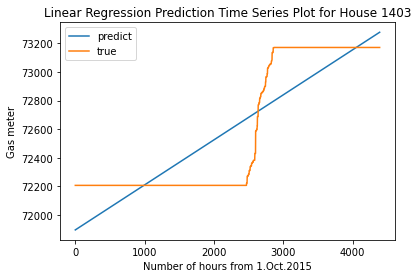

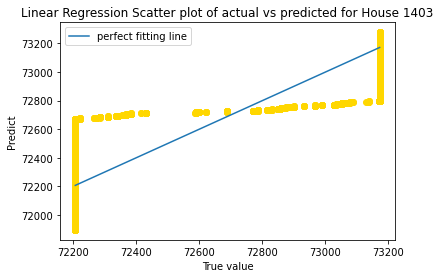

Training score for house 7566 is 0.7555960161966139
Testing score for house 7566 is 0.7567941518794654


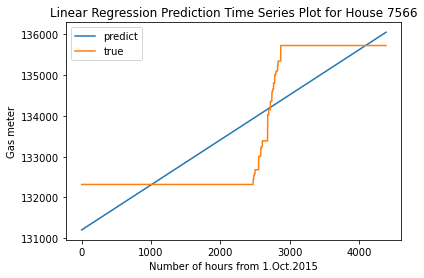

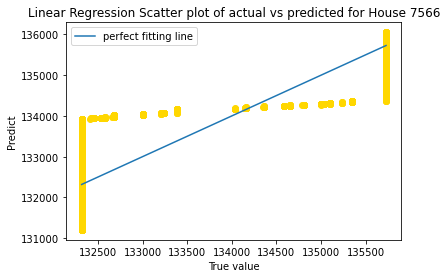

Training score for house 6673 is 0.7536138208095984
Testing score for house 6673 is 0.7562081009479619


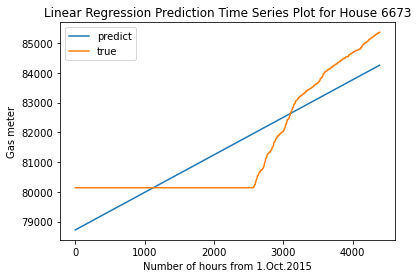

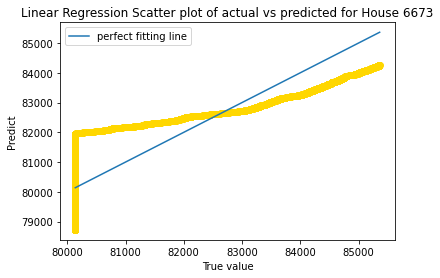

Training score for house 2814 is 0.7258536269159237
Testing score for house 2814 is 0.7471884555583898


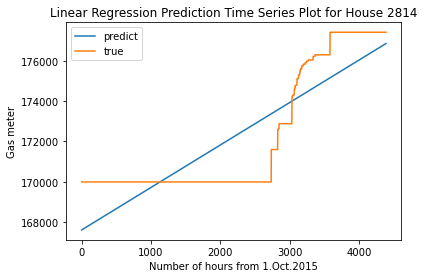

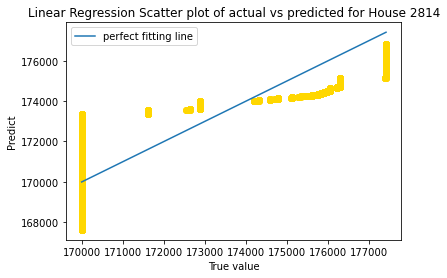

Training score for house 6101 is 0.690134878629375
Testing score for house 6101 is 0.6919656656360698


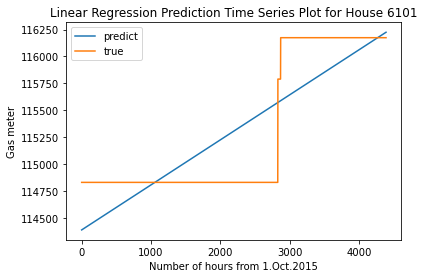

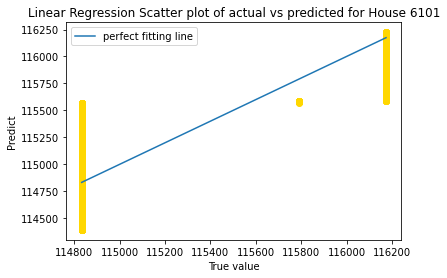

Training score for house 4874 is 0.33392640521834505
Testing score for house 4874 is 0.3425336137441827


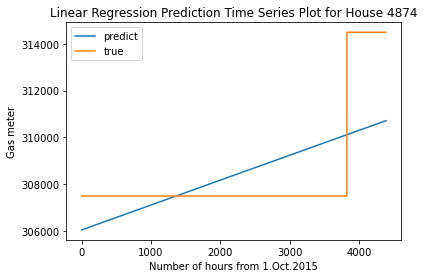

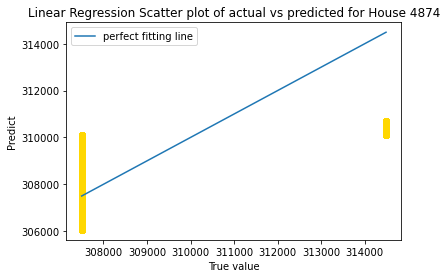

In [13]:
file_name = 'dataport-export_gas_oct2015-mar2016.csv'
file = pd.read_csv(file_name)
ID_list = file['dataid'].unique()
for ID in ID_list:
    linear_pre(file_name,ID)

# Question 2.3 SVR Model to Forecast

In [3]:
from sklearn.svm import SVR

In [10]:
def SVR_pre(file,Id):
    #generate hour number for 6 months
    hour_num = 4*31*24 + 29*24 + 30*24
    #set feature as number of hours
    X = np.arange(hour_num).reshape(-1,1)
    Y = pre_hour_data(file,Id).ravel()
    
    # Random spliting by 70%/30%
    (X_train,X_test,Y_train,Y_test)=train_test_split(X,Y,test_size=0.3)  
    
    S = SVR(C=1000, gamma='scale', kernel='rbf').fit(X_train,Y_train)
    
    Y_pred_train = S.predict(X_train)
    Y_pred_test = S.predict(X_test)
    
    #get R^2 score
    score_train = S.score(X_train,Y_train)
    score_test = S.score(X_test,Y_test)
    print('Training score for house '+str(Id)+' is '+str(score_train))
    print('Testing score for house '+str(Id)+' is '+str(score_test))
    
    
    #plot Time series plot of the actual and predicted hourly meter readings
    Y_all =  S.predict(X)
    plt.plot(X, Y_all,label = 'predict')
    plt.plot(X, Y,label = 'true')
    plt.legend(loc='best')
    plt.xlabel('Number of hours from 1.Oct.2015')
    plt.ylabel('Gas meter')
    plt.title('SVR Time Series Plot for House '+ str(Id))
    plt.show()
    
    #plot Scatter plot of actual vs predicted meter readings
    plt.scatter(Y,Y_all,color = 'gold')
    plt.xlabel('True value')
    plt.ylabel('Predict')
    plt.title('SVR plot of actual vs predicted for House '+ str(Id))
    #plot perfect fitting line
    plt.plot([min(Y),max(Y)],[min(Y),max(Y)],label='perfect fitting line')
    plt.legend(loc='best')
    plt.show()

Show plots for all house

Training score for house 739 is 0.9993999996301108
Testing score for house 739 is 0.9994052212100833


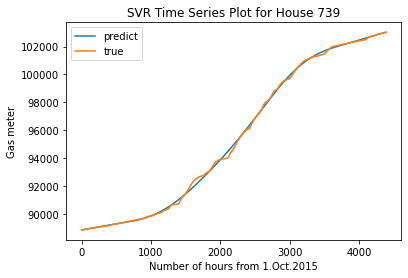

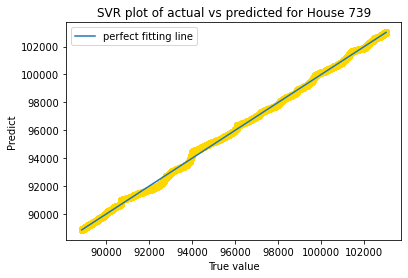

Training score for house 8890 is 0.9990572841647691
Testing score for house 8890 is 0.9991328383910065


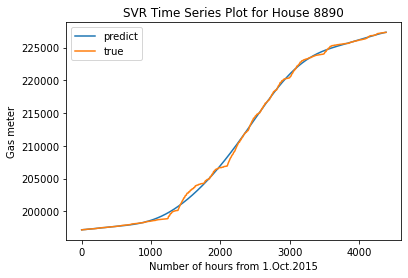

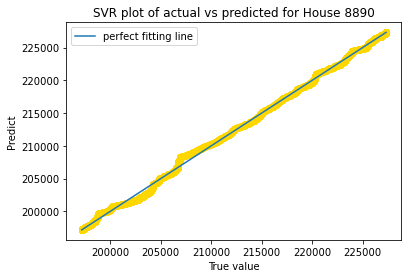

Training score for house 6910 is 0.9989530905967429
Testing score for house 6910 is 0.99882334358617


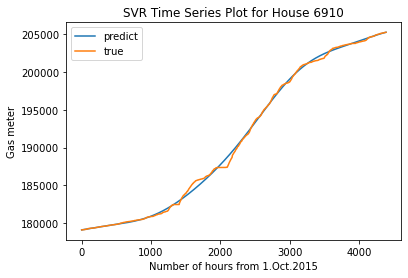

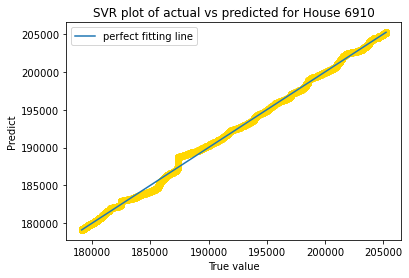

Training score for house 3635 is 0.9990318192071544
Testing score for house 3635 is 0.9989748196742229


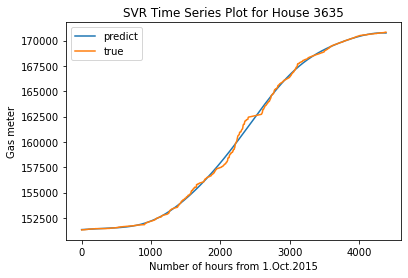

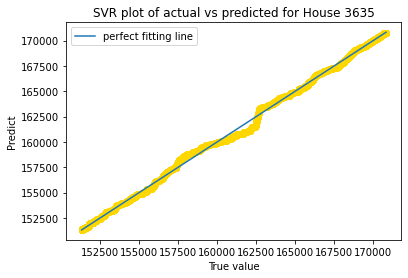

Training score for house 1507 is 0.9993646406534844
Testing score for house 1507 is 0.9993477497520603


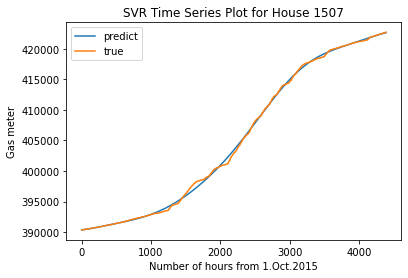

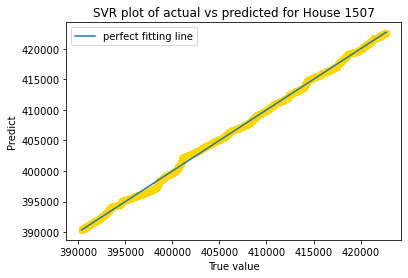

Training score for house 5810 is 0.9996577430562119
Testing score for house 5810 is 0.9996515817012138


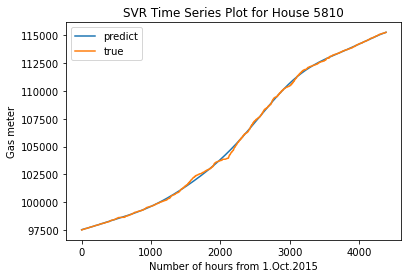

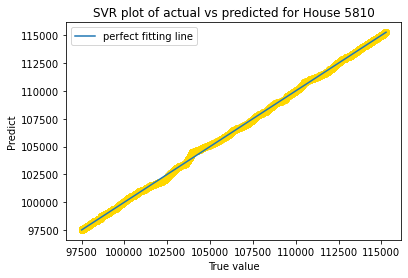

Training score for house 484 is 0.9998109702707526
Testing score for house 484 is 0.9998051931468033


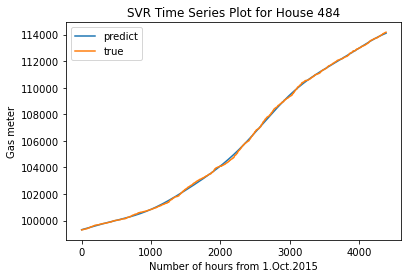

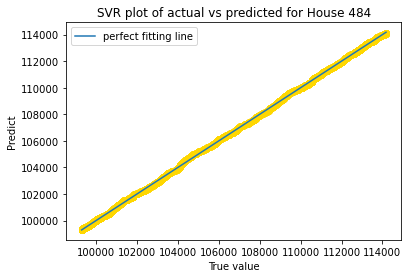

Training score for house 4352 is 0.9635688457466673
Testing score for house 4352 is 0.9577601166817056


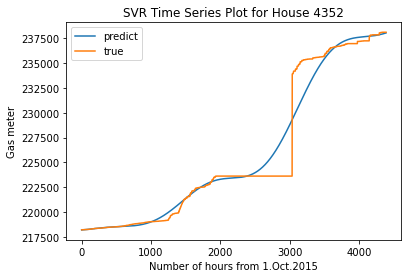

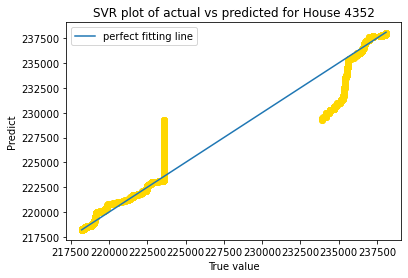

Training score for house 1718 is 0.9991073145479051
Testing score for house 1718 is 0.9990779781606639


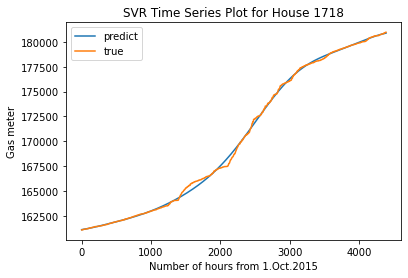

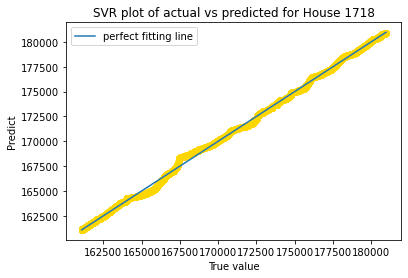

Training score for house 1714 is 0.9992298272697419
Testing score for house 1714 is 0.9992485752464226


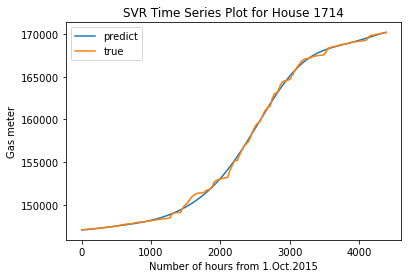

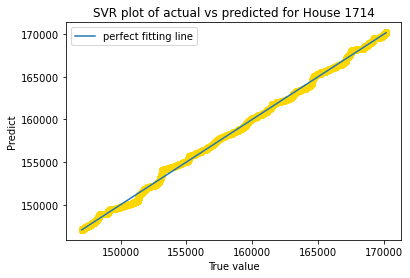

Training score for house 9849 is 0.9997447155753822
Testing score for house 9849 is 0.9997364256957695


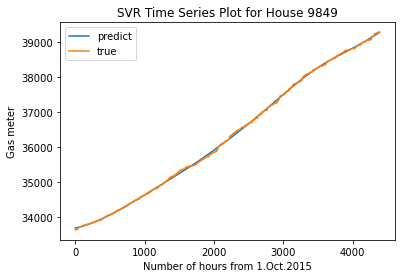

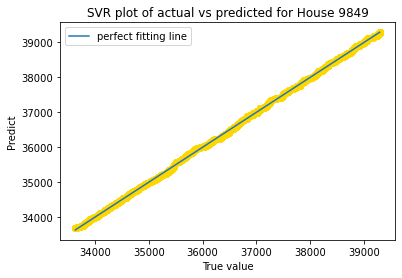

Training score for house 5131 is 0.998887436972695
Testing score for house 5131 is 0.998778556997292


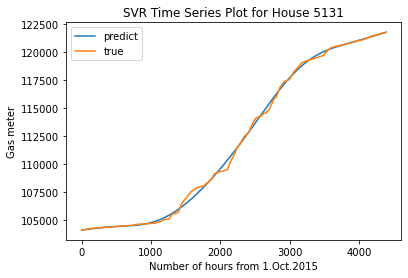

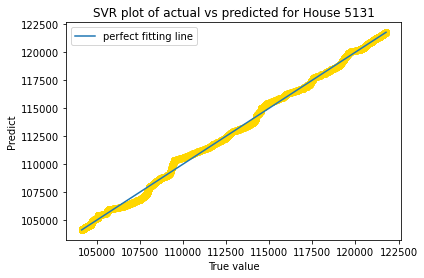

Training score for house 6412 is 0.9992798456009014
Testing score for house 6412 is 0.9993026766996355


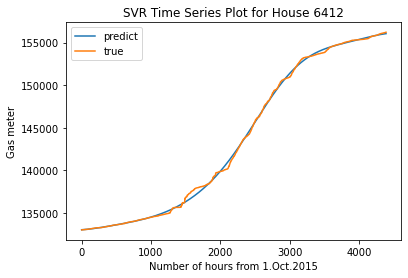

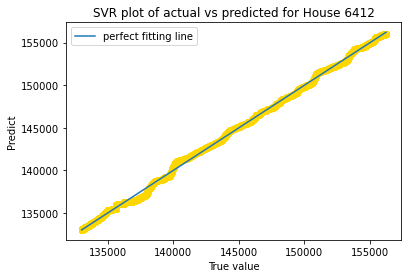

Training score for house 7429 is 0.9989042976858966
Testing score for house 7429 is 0.9989421881364989


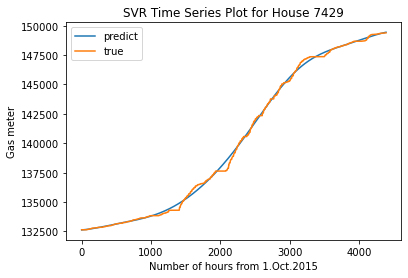

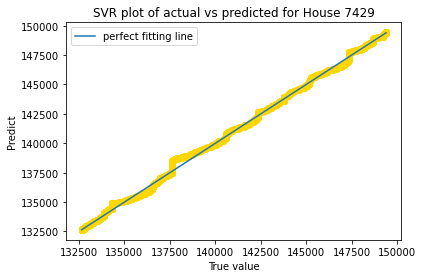

Training score for house 871 is 0.9983990289320678
Testing score for house 871 is 0.9982537626963762


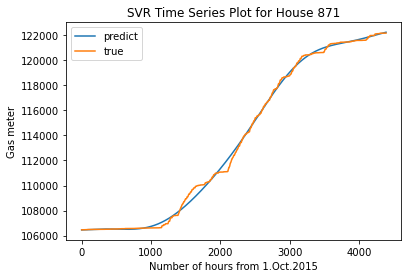

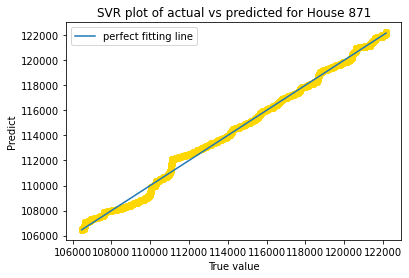

Training score for house 1086 is 0.9992221819823852
Testing score for house 1086 is 0.9992079187657307


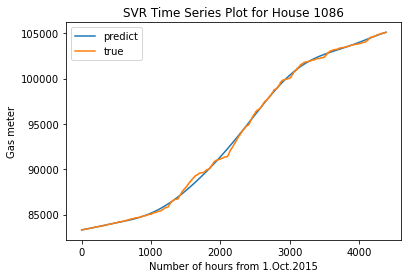

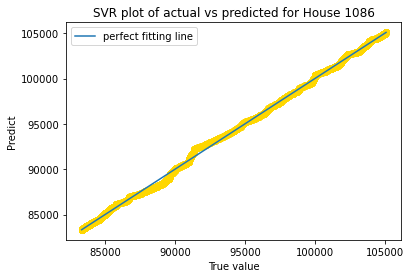

Training score for house 1589 is 0.9993258410746415
Testing score for house 1589 is 0.9993102905260155


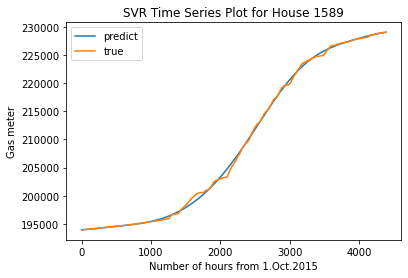

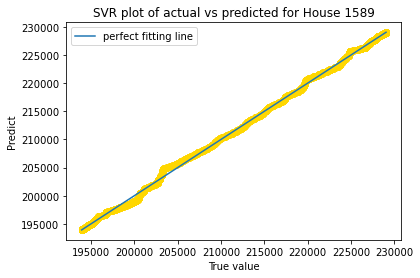

Training score for house 8156 is 0.9881726987939965
Testing score for house 8156 is 0.9874493852009818


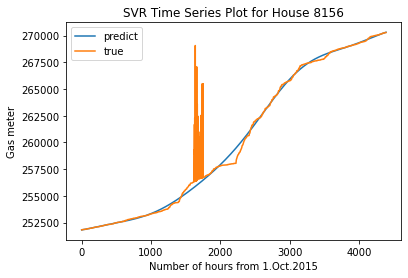

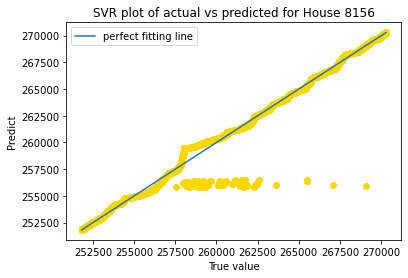

Training score for house 9631 is 0.9995098303753832
Testing score for house 9631 is 0.9995646598291208


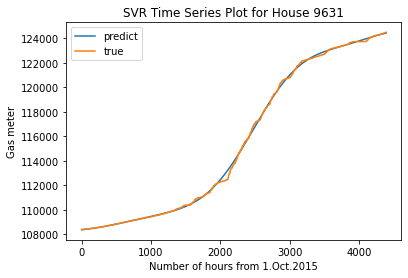

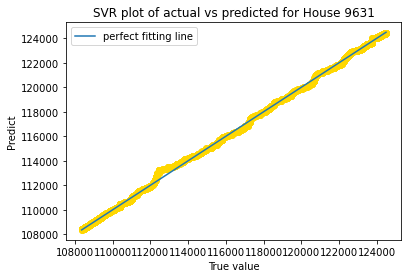

Training score for house 5403 is 0.9806468609679762
Testing score for house 5403 is 0.9826056326121267


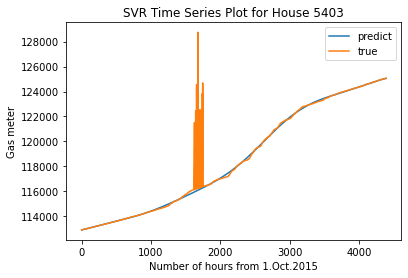

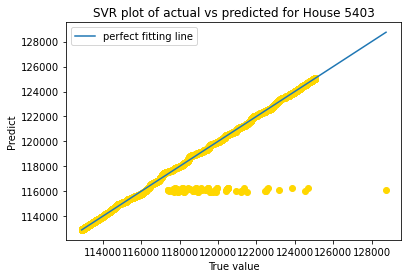

Training score for house 4447 is 0.9891147535593822
Testing score for house 4447 is 0.9892052249773701


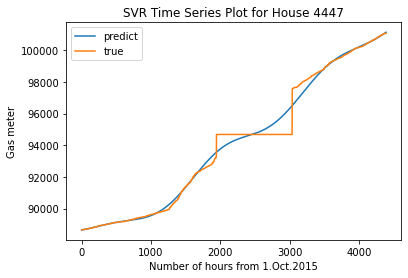

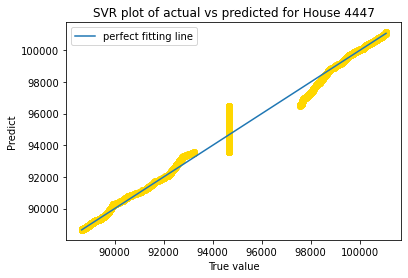

Training score for house 2034 is 0.9988823257967795
Testing score for house 2034 is 0.9989306145120952


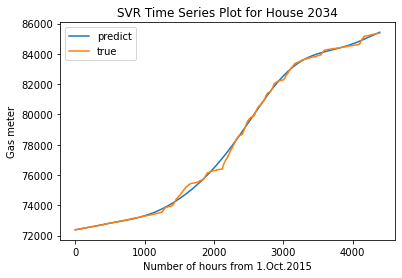

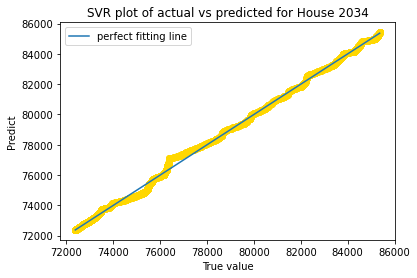

Training score for house 5275 is 0.9988545209378374
Testing score for house 5275 is 0.9987222669605214


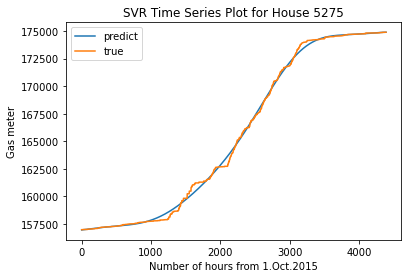

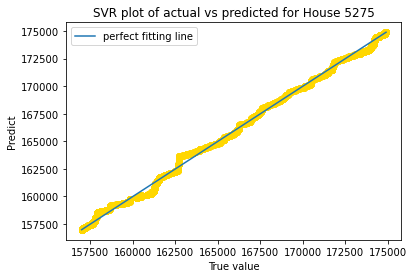

Training score for house 7794 is 0.9990407585982612
Testing score for house 7794 is 0.9990376292640946


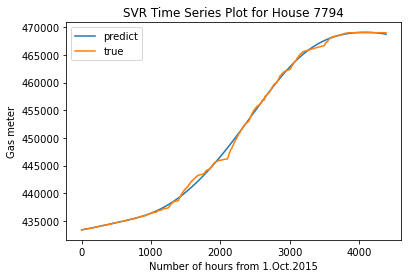

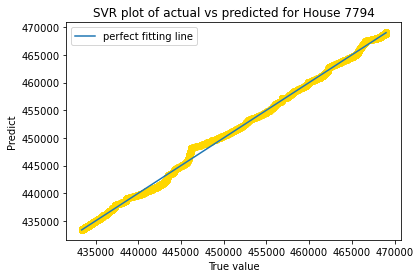

Training score for house 7287 is 0.9995592682649684
Testing score for house 7287 is 0.9995850242252369


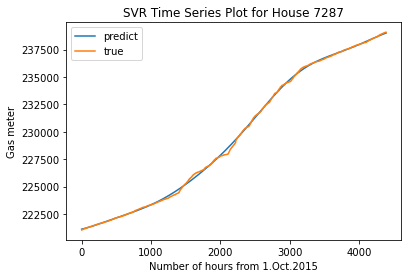

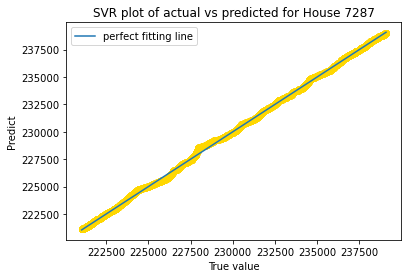

Training score for house 4296 is 0.9988190125804329
Testing score for house 4296 is 0.9987217159600252


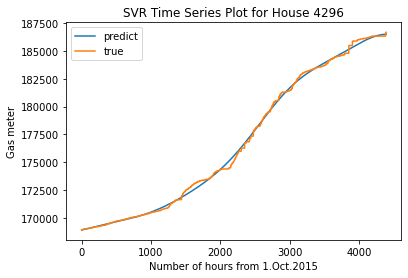

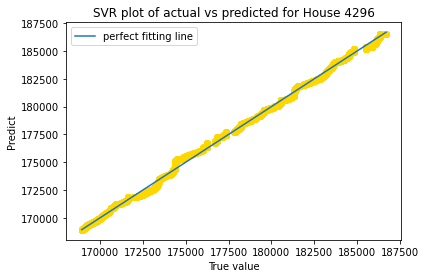

Training score for house 9639 is 0.9991064791660015
Testing score for house 9639 is 0.9991129651658528


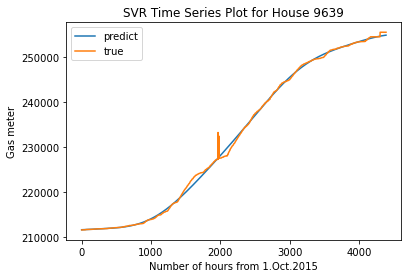

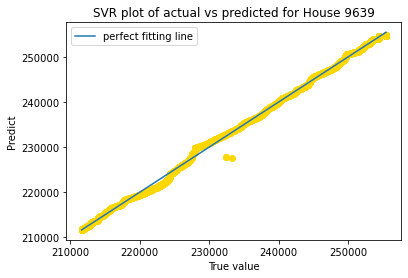

Training score for house 7017 is 0.9982122269857975
Testing score for house 7017 is 0.9982938167476705


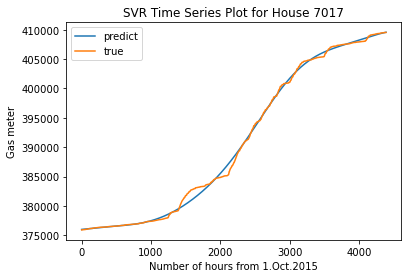

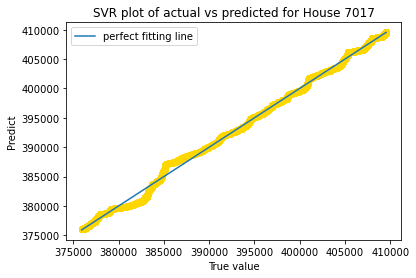

Training score for house 252 is 0.9985402216893947
Testing score for house 252 is 0.9985332360428313


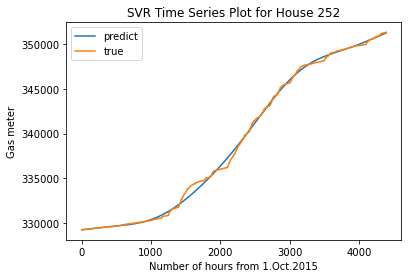

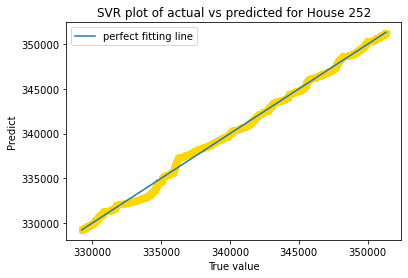

Training score for house 8829 is 0.9990572981013507
Testing score for house 8829 is 0.9988641873754023


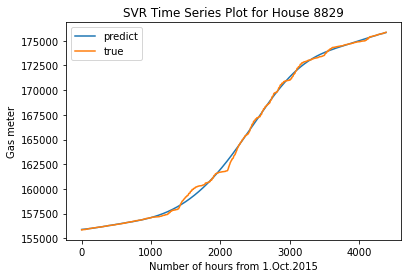

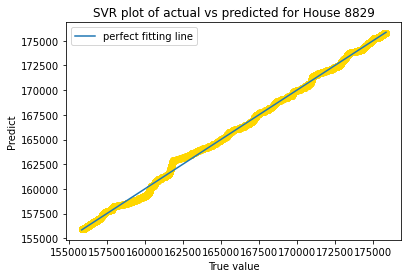

Training score for house 94 is 0.9995078539753595
Testing score for house 94 is 0.9994382629610213


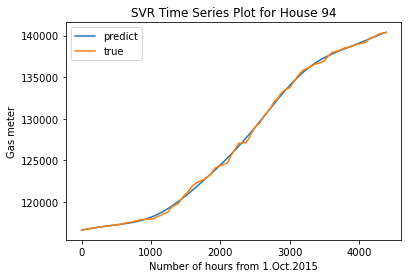

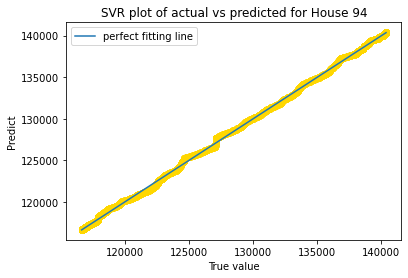

Training score for house 3039 is 0.9770144573984215
Testing score for house 3039 is 0.97816712346503


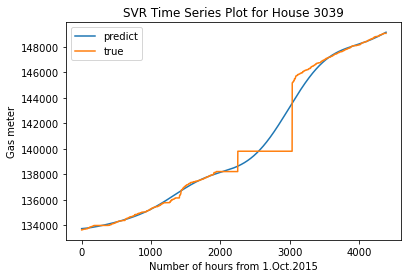

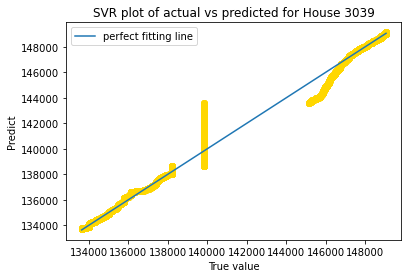

Training score for house 9121 is 0.999318118089288
Testing score for house 9121 is 0.9992899578232937


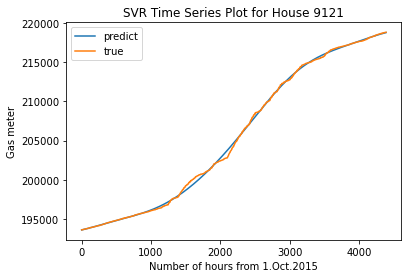

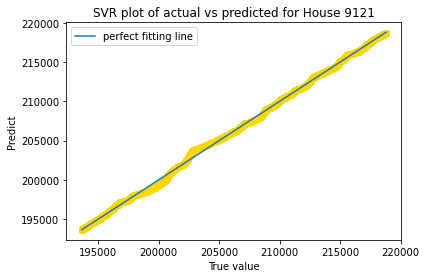

Training score for house 7741 is 0.9985729439392115
Testing score for house 7741 is 0.9986340010979728


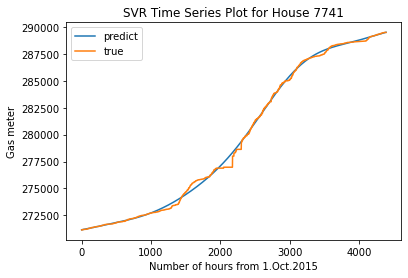

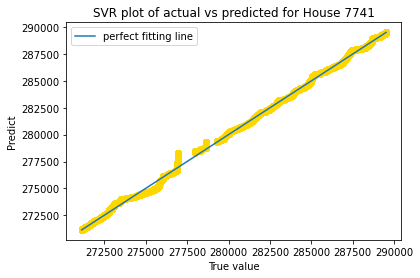

Training score for house 7919 is 0.9696031774082704
Testing score for house 7919 is 0.9699163393867775


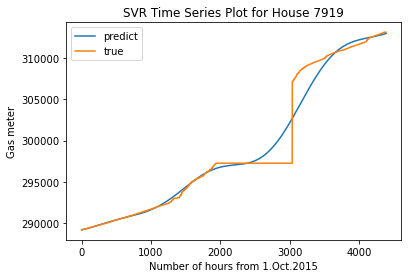

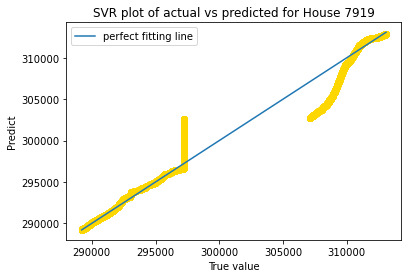

Training score for house 7674 is 0.998972292631114
Testing score for house 7674 is 0.9987829198900507


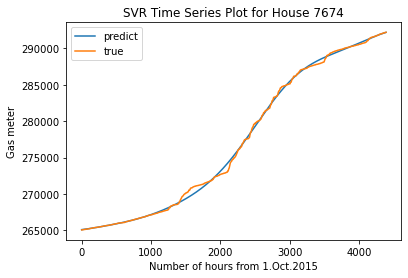

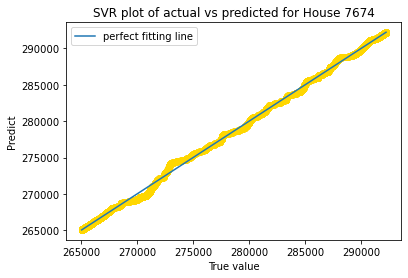

Training score for house 7030 is 0.9856655932350872
Testing score for house 7030 is 0.9701256570785752


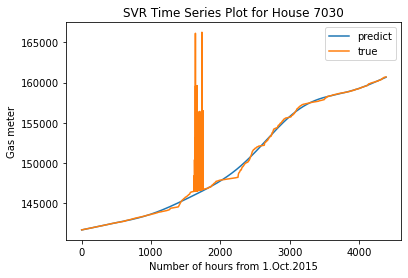

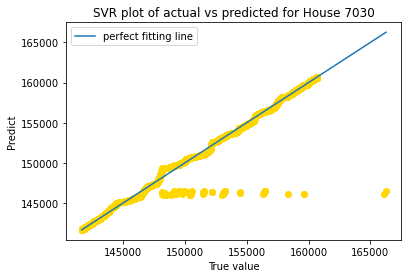

Training score for house 4732 is 0.9990332997726092
Testing score for house 4732 is 0.9990007765667138


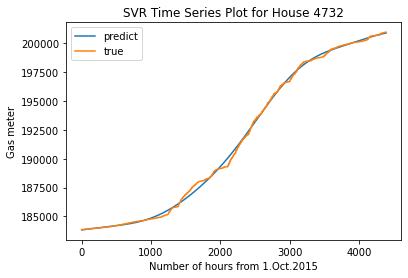

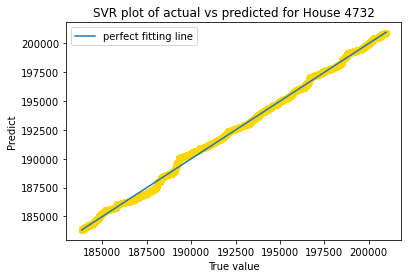

Training score for house 370 is 0.9994022395017921
Testing score for house 370 is 0.9993680966625996


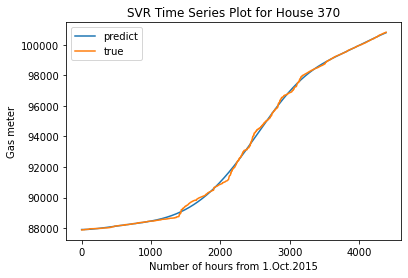

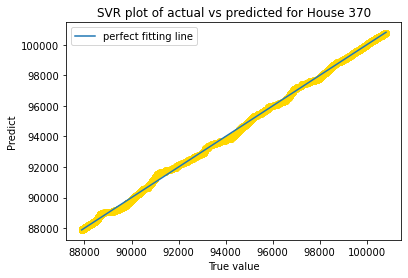

Training score for house 9295 is 0.9993534458567986
Testing score for house 9295 is 0.9993193504857457


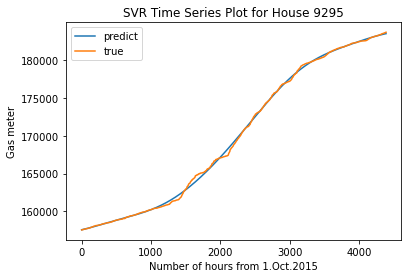

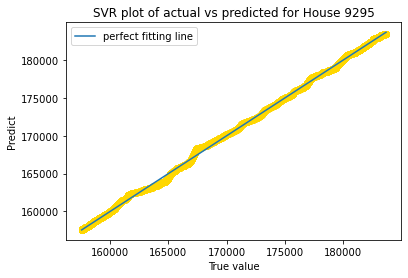

Training score for house 3577 is 0.9989661046991971
Testing score for house 3577 is 0.9990348171019855


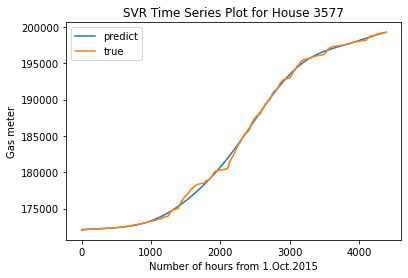

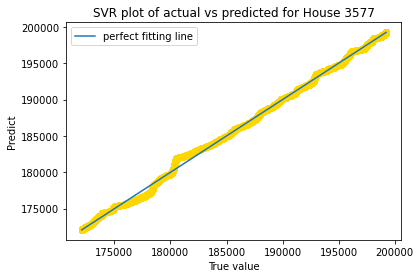

Training score for house 222 is 0.9917496292485619
Testing score for house 222 is 0.9906008484337978


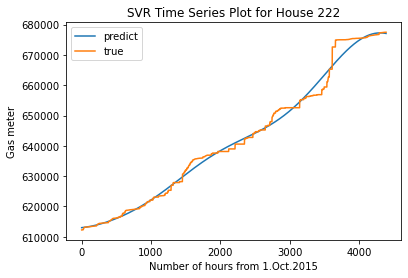

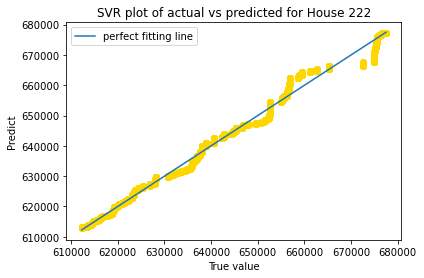

Training score for house 2449 is 0.9295901361306539
Testing score for house 2449 is 0.9197060375176472


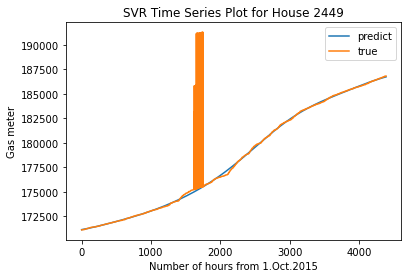

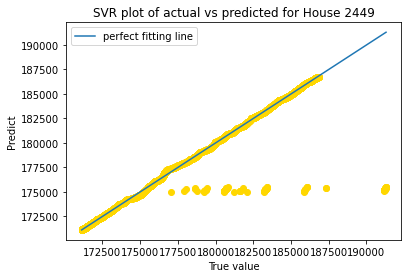

Training score for house 35 is 0.9993088924305678
Testing score for house 35 is 0.9992686404958891


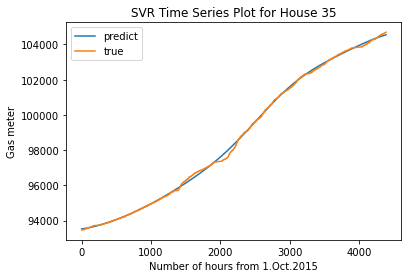

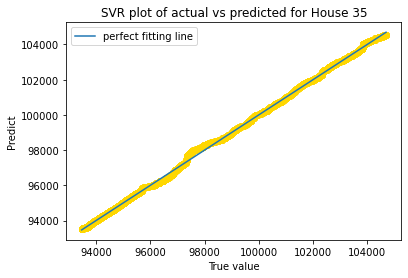

Training score for house 1697 is 0.9996863261001969
Testing score for house 1697 is 0.9996559270773484


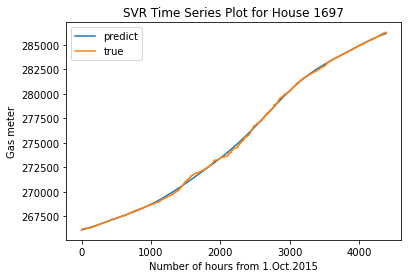

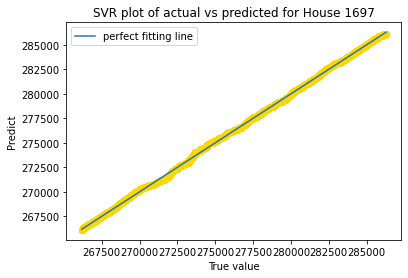

Training score for house 9134 is 0.9664658998737443
Testing score for house 9134 is 0.9578155602998606


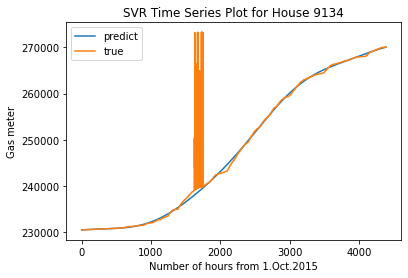

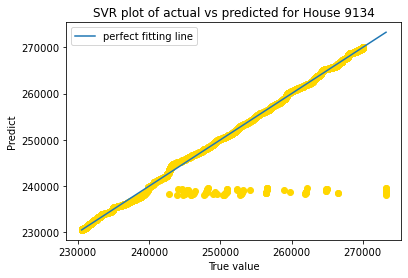

Training score for house 4767 is 0.9973830098012021
Testing score for house 4767 is 0.9973927013951437


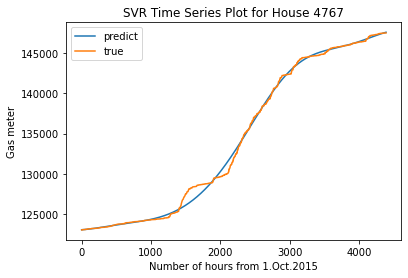

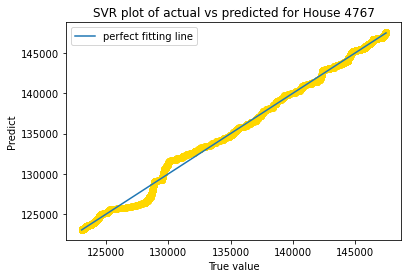

Training score for house 5785 is 0.9983272125922166
Testing score for house 5785 is 0.9982717141362459


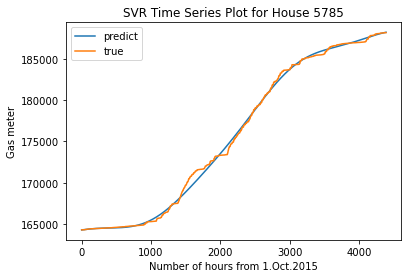

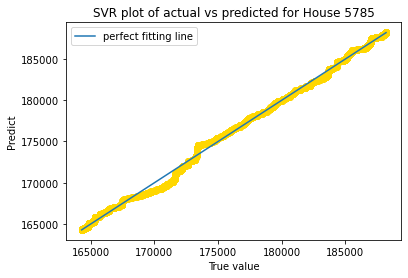

Training score for house 7739 is 0.9994467973201048
Testing score for house 7739 is 0.9993862035566554


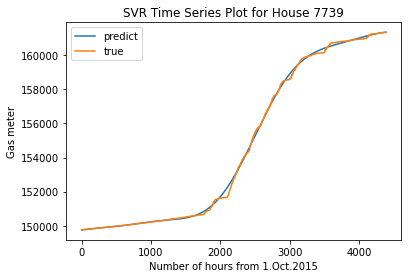

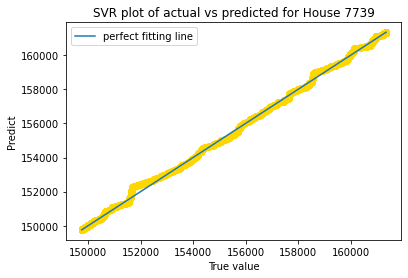

Training score for house 7117 is 0.9785225406370154
Testing score for house 7117 is 0.9818611060401606


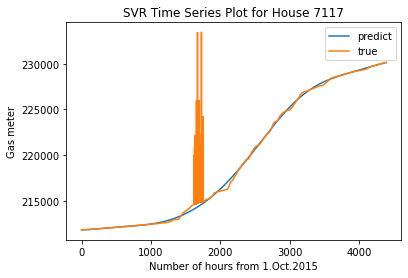

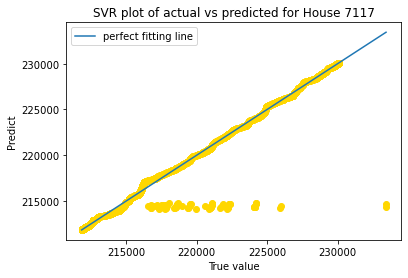

Training score for house 5193 is 0.9990016800074127
Testing score for house 5193 is 0.9989882856945289


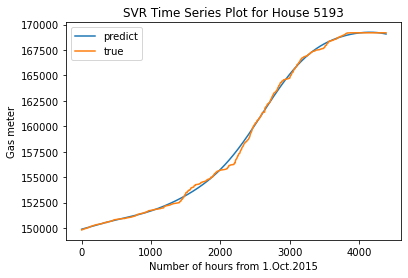

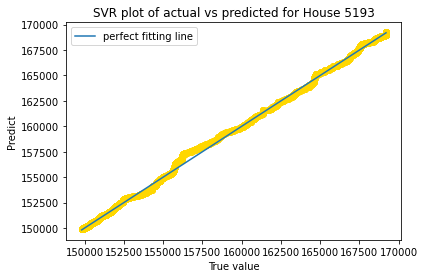

Training score for house 3367 is 0.9984047313587241
Testing score for house 3367 is 0.9984773235190203


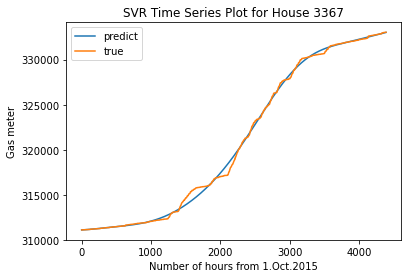

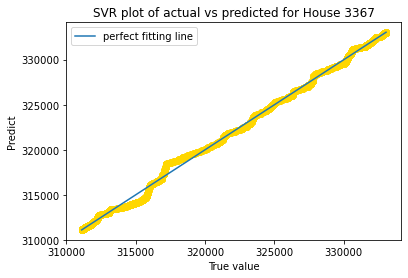

Training score for house 8467 is 0.991933586507286
Testing score for house 8467 is 0.9920284826614766


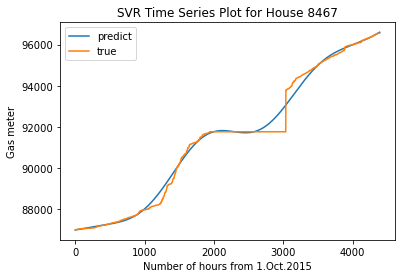

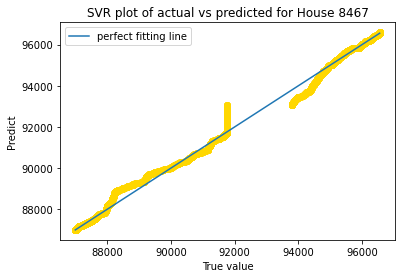

Training score for house 5972 is 0.9986975040055179
Testing score for house 5972 is 0.9988264874723166


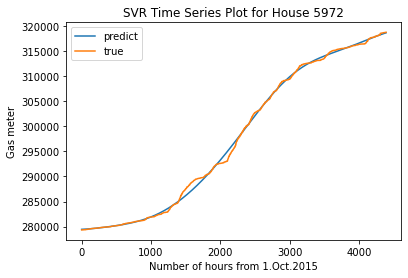

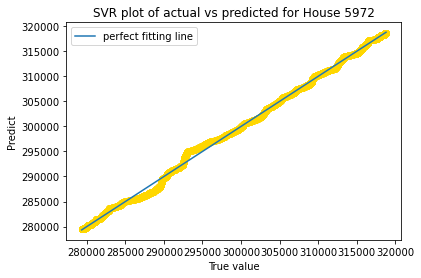

Training score for house 5439 is 0.9987712308278889
Testing score for house 5439 is 0.9989111648190361


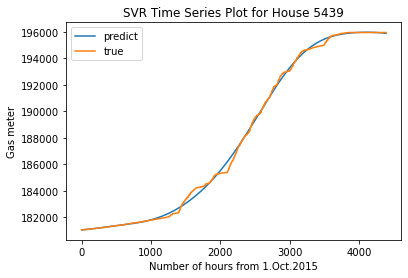

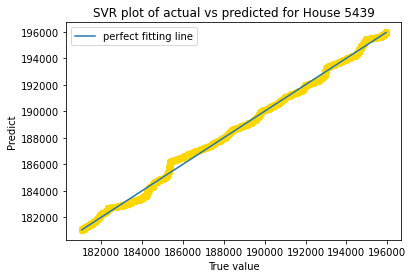

Training score for house 114 is 0.9991716916819376
Testing score for house 114 is 0.9991335965680057


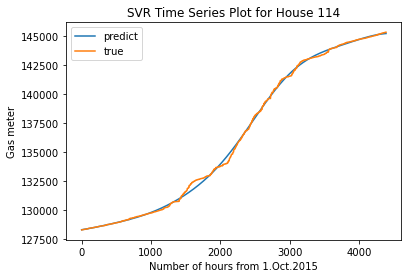

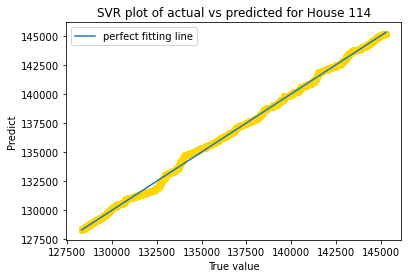

Training score for house 9474 is 0.9665107023819711
Testing score for house 9474 is 0.9653949224269689


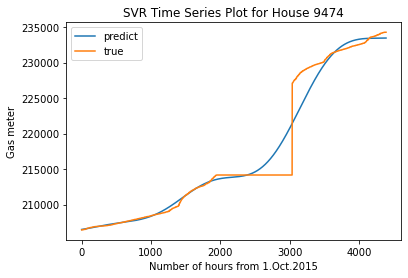

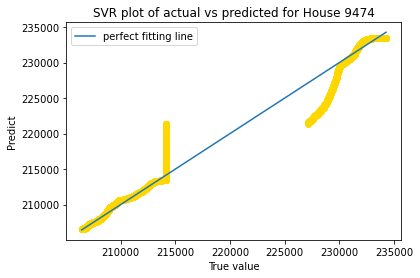

Training score for house 2335 is 0.9980566408842458
Testing score for house 2335 is 0.999043532599135


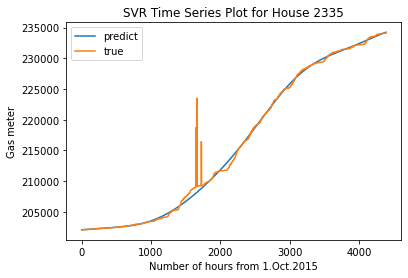

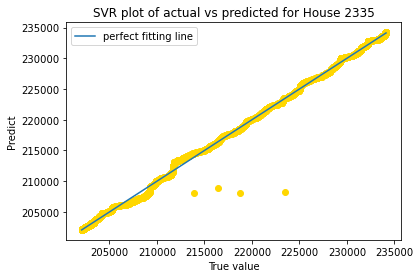

Training score for house 7460 is 0.9740499764498127
Testing score for house 7460 is 0.9722299507524691


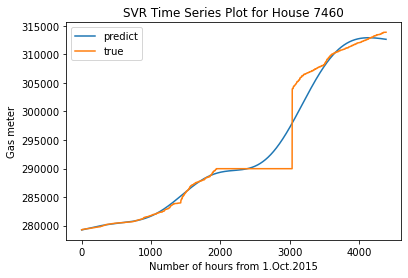

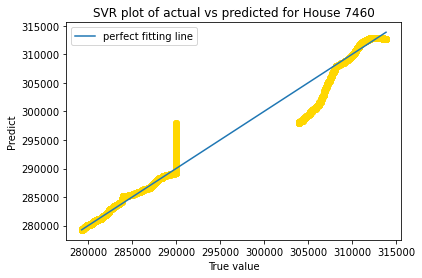

Training score for house 4998 is 0.9987160372270446
Testing score for house 4998 is 0.998708323562009


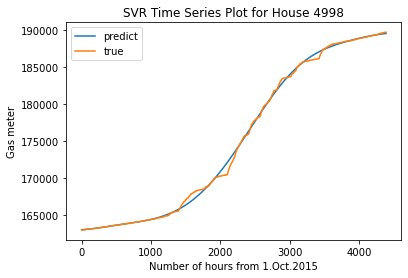

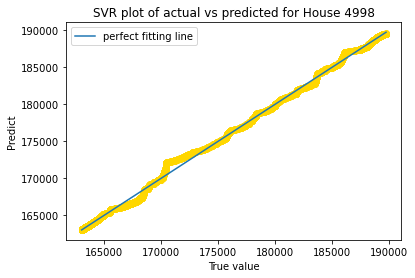

Training score for house 9278 is 0.9985476295914045
Testing score for house 9278 is 0.9986264360965463


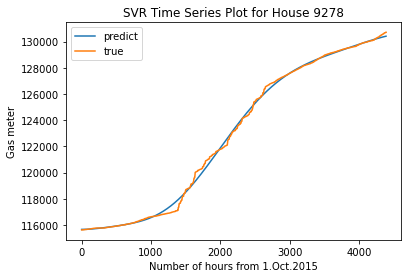

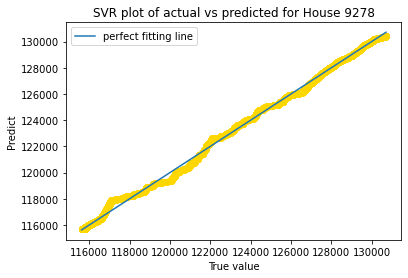

Training score for house 5129 is 0.9296805293279702
Testing score for house 5129 is 0.8964260627884166


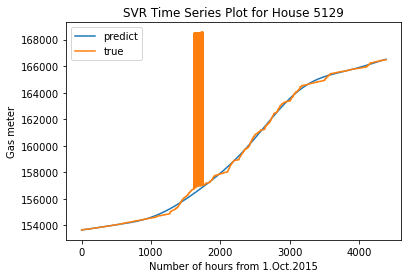

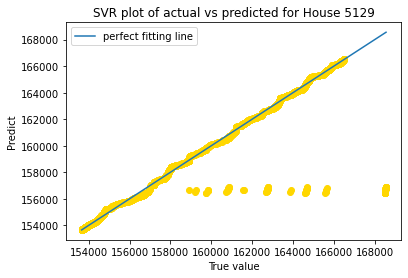

Training score for house 2018 is 0.9986945914875051
Testing score for house 2018 is 0.9987153964223701


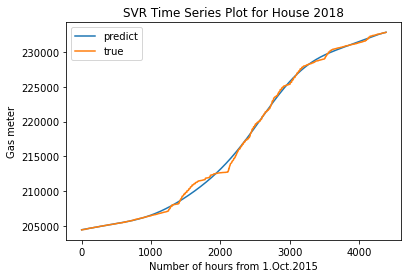

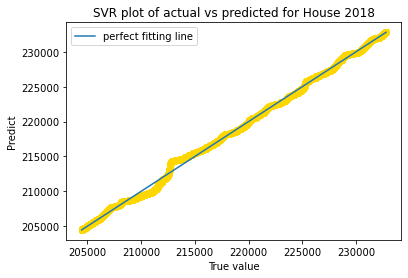

Training score for house 9052 is 0.99901975279951
Testing score for house 9052 is 0.9989422679651744


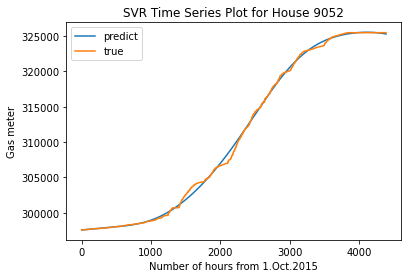

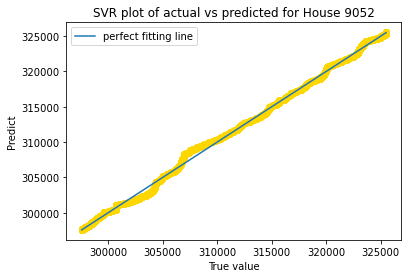

Training score for house 9956 is 0.9850569079437287
Testing score for house 9956 is 0.984382685585138


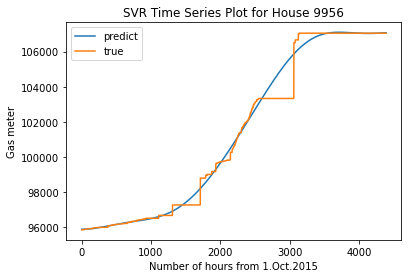

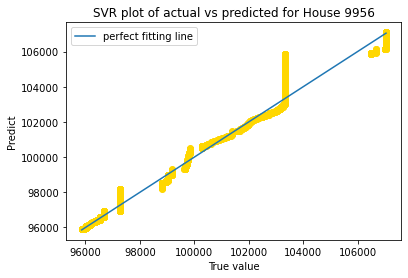

Training score for house 8155 is 0.9968679312510353
Testing score for house 8155 is 0.9972237409175179


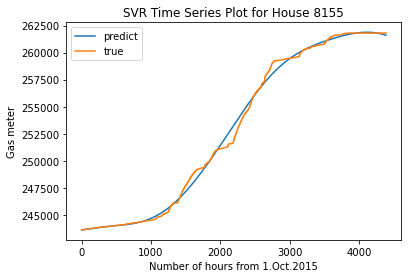

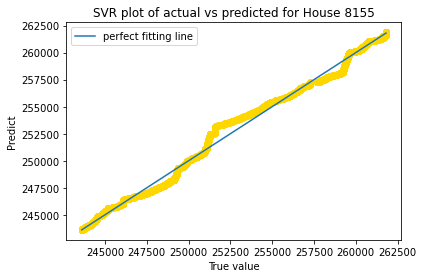

Training score for house 483 is 0.9983711399423912
Testing score for house 483 is 0.9983709722807746


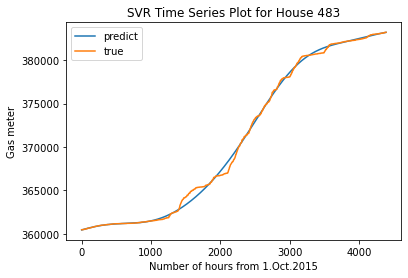

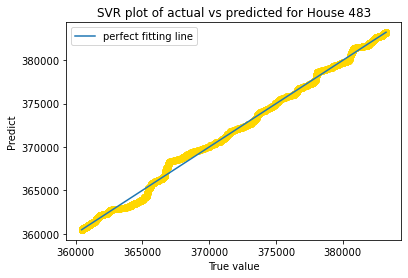

Training score for house 1556 is 0.9840051193308356
Testing score for house 1556 is 0.9931890394932849


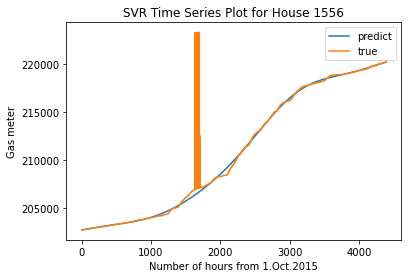

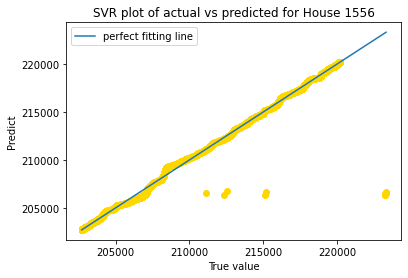

Training score for house 5636 is 0.9991215588058874
Testing score for house 5636 is 0.9990706321848075


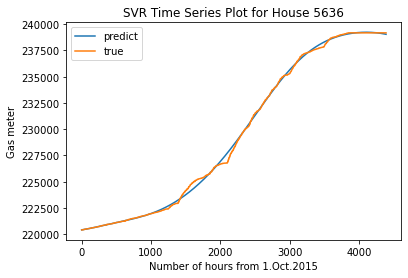

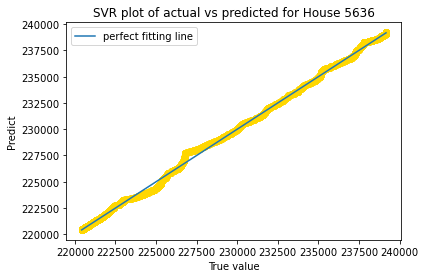

Training score for house 4029 is 0.9956278800376438
Testing score for house 4029 is 0.9956073573932746


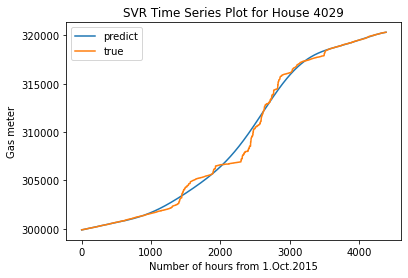

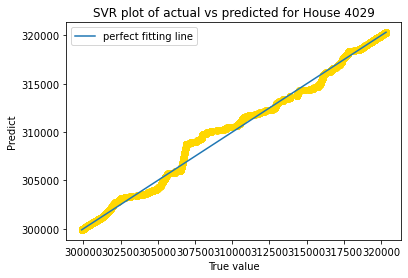

Training score for house 3544 is 0.9193524074638854
Testing score for house 3544 is 0.9046362531057056


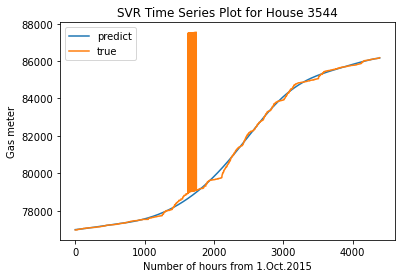

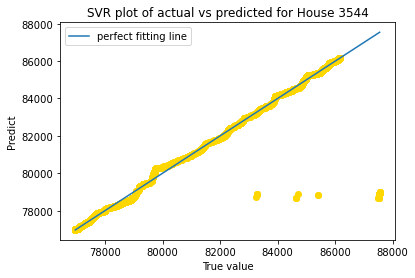

Training score for house 1791 is 0.9995267445756764
Testing score for house 1791 is 0.9995379005715004


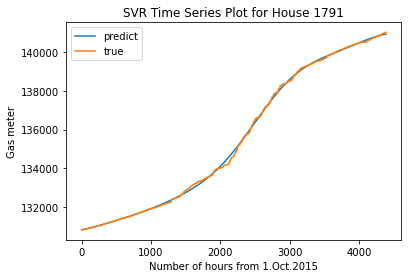

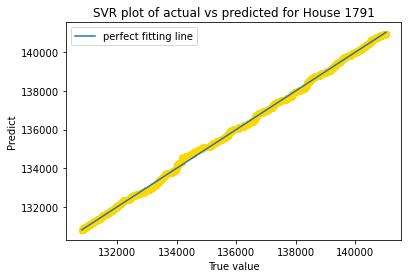

Training score for house 1801 is 0.9992000126899174
Testing score for house 1801 is 0.999057703158876


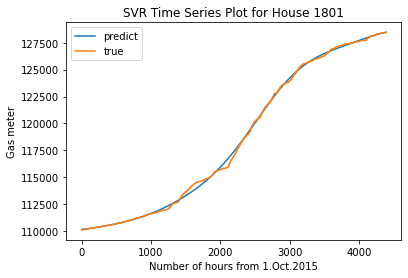

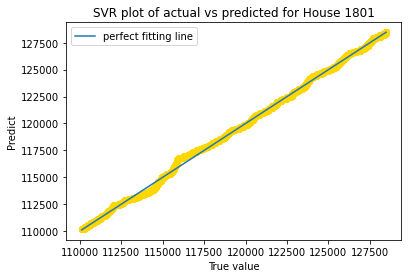

Training score for house 9729 is 0.9984344315458036
Testing score for house 9729 is 0.9983781235952165


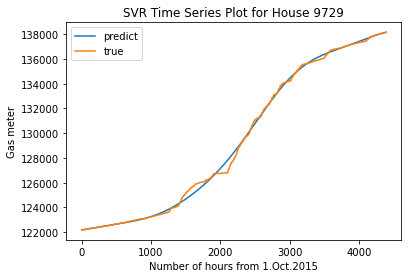

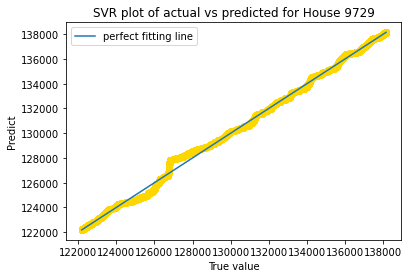

Training score for house 1283 is 0.9991226349728012
Testing score for house 1283 is 0.9991084213024573


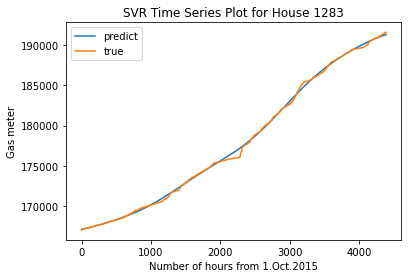

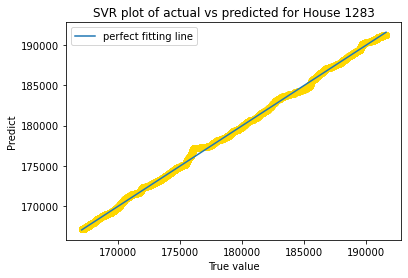

Training score for house 1792 is 0.9981275868492366
Testing score for house 1792 is 0.9980618427450889


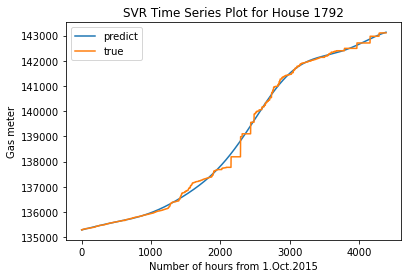

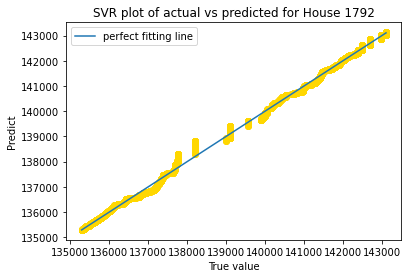

Training score for house 4031 is 0.9987140552045295
Testing score for house 4031 is 0.9986613434032293


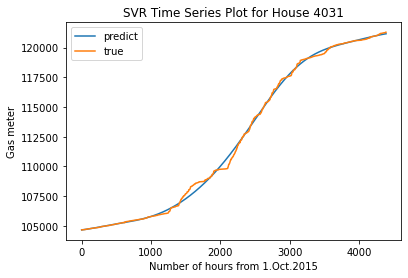

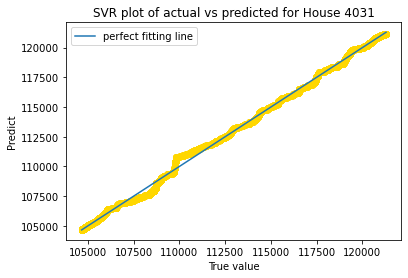

Training score for house 3893 is 0.9991622821938023
Testing score for house 3893 is 0.9991372338407907


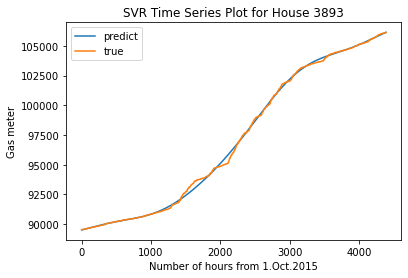

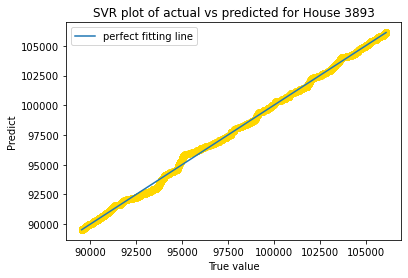

Training score for house 1185 is 0.9768848842127397
Testing score for house 1185 is 0.9757454436669412


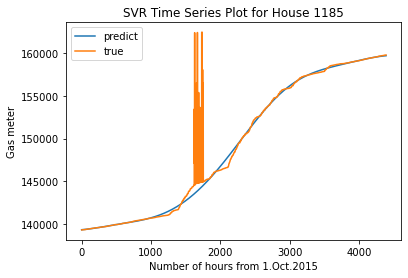

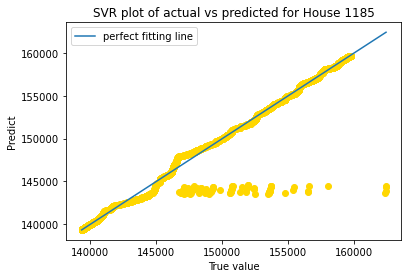

Training score for house 7682 is 0.9989406257090122
Testing score for house 7682 is 0.9989665230062575


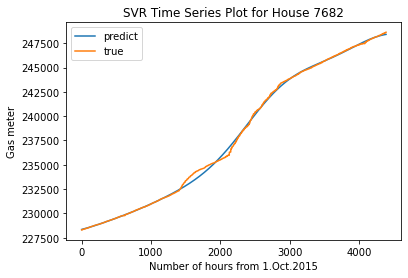

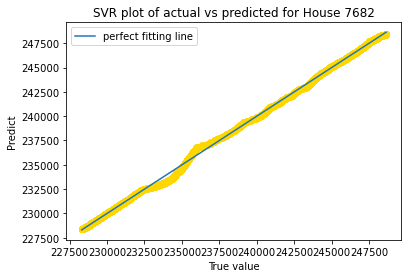

Training score for house 2638 is 0.9620542314679746
Testing score for house 2638 is 0.9639846964270347


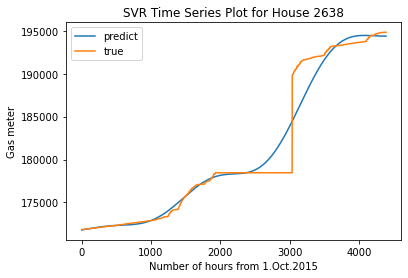

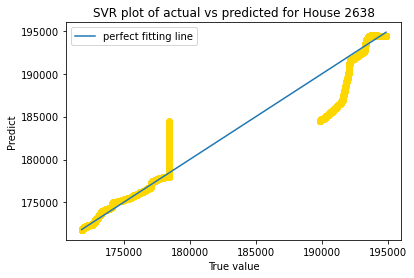

Training score for house 187 is 0.9991847069818587
Testing score for house 187 is 0.9991419333520606


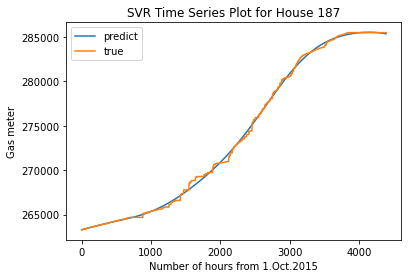

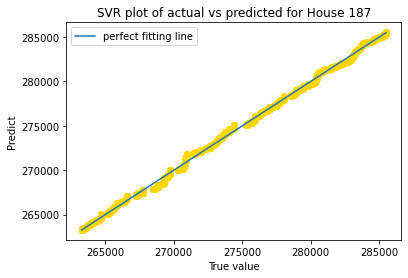

Training score for house 3723 is 0.9992352908129721
Testing score for house 3723 is 0.999174862446761


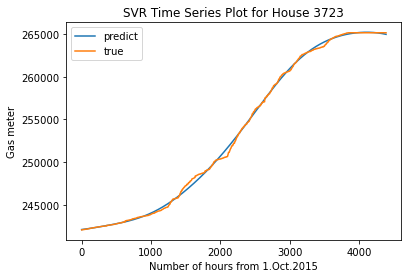

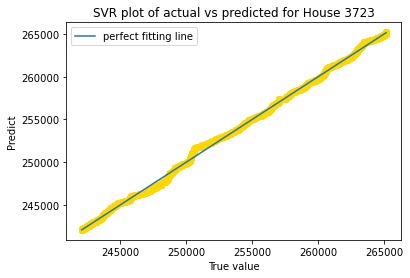

Training score for house 4514 is 0.984188354773626
Testing score for house 4514 is 0.9847267544148952


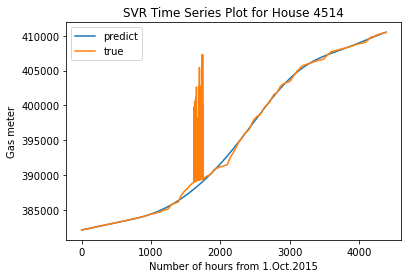

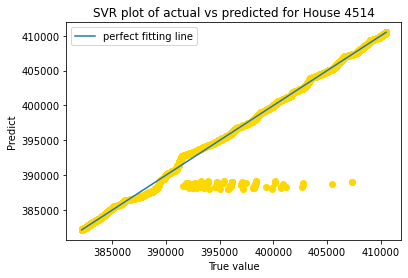

Training score for house 5814 is 0.9990362060674289
Testing score for house 5814 is 0.9990805961782391


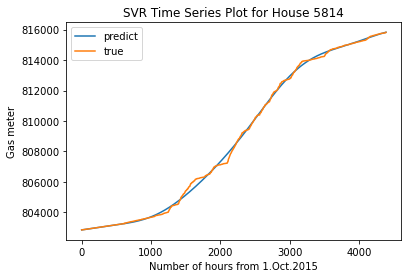

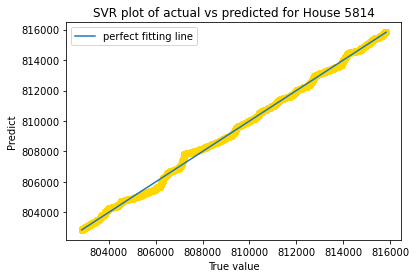

Training score for house 77 is 0.9997985377361633
Testing score for house 77 is 0.9998081413183759


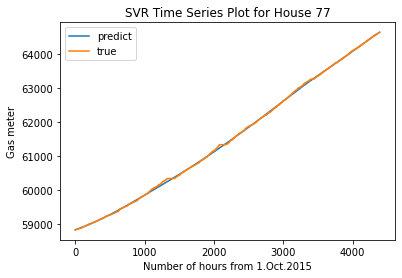

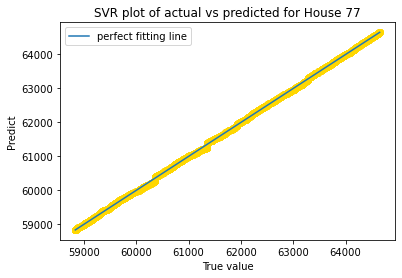

Training score for house 1619 is 0.9988716802596309
Testing score for house 1619 is 0.9986822596845989


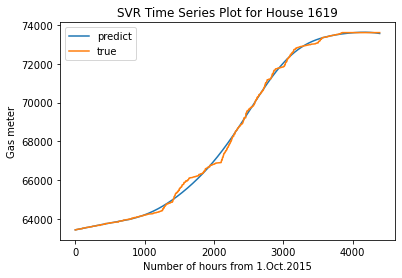

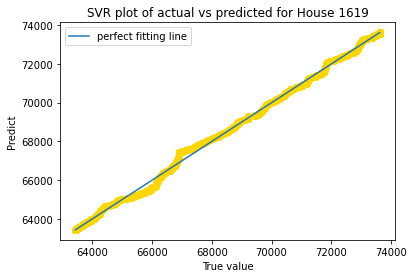

Training score for house 4421 is 0.9701293941589855
Testing score for house 4421 is 0.9709498538051774


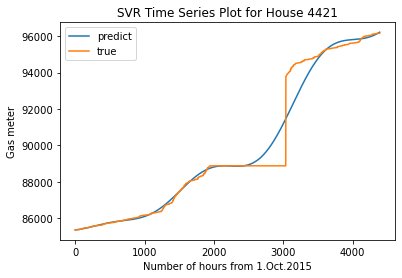

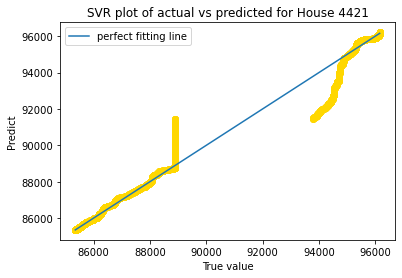

Training score for house 661 is 0.9993442221528288
Testing score for house 661 is 0.9994059698073066


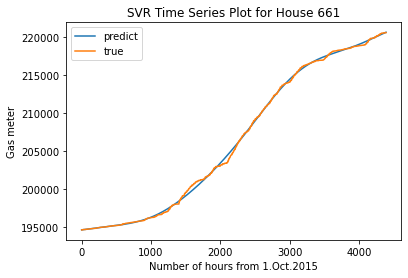

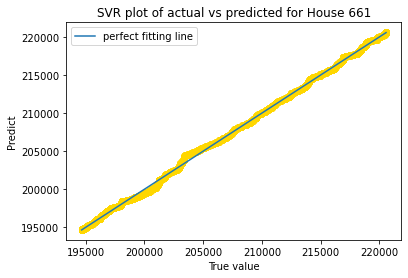

Training score for house 3134 is 0.9843751823610046
Testing score for house 3134 is 0.9779614026827431


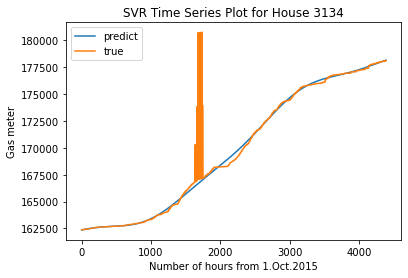

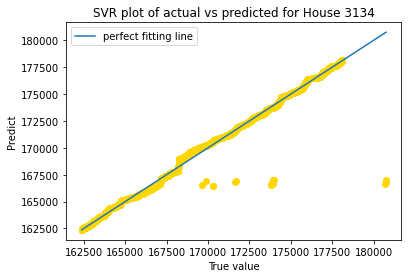

Training score for house 6836 is 0.8763671386934506
Testing score for house 6836 is 0.8797858525988853


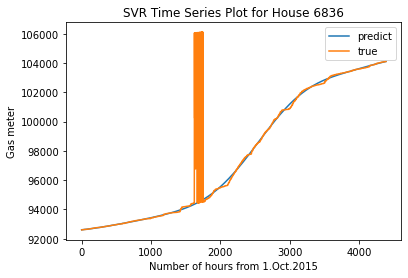

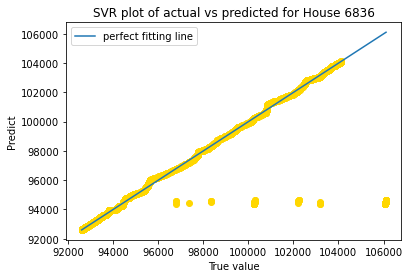

Training score for house 1042 is 0.9989903443634295
Testing score for house 1042 is 0.998919077292749


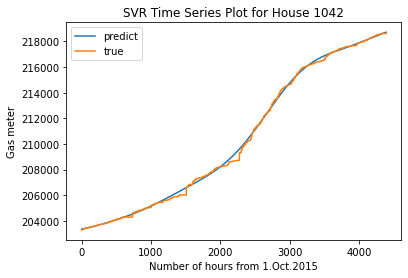

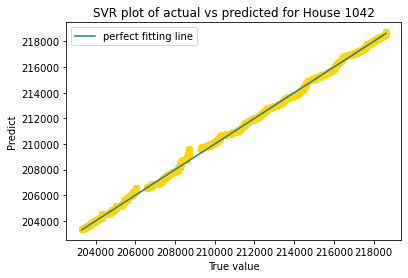

Training score for house 4373 is 0.9991168977961186
Testing score for house 4373 is 0.9991751132158169


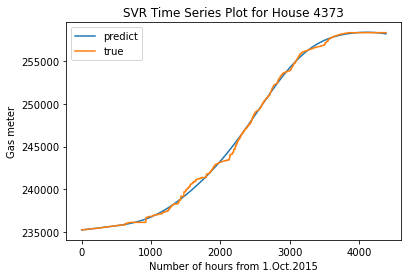

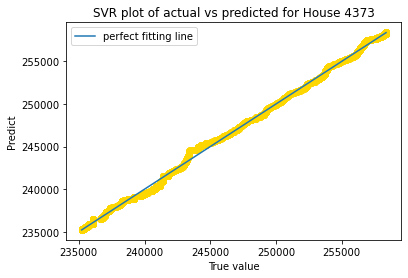

Training score for house 5484 is 0.9997102723264453
Testing score for house 5484 is 0.9996500840492725


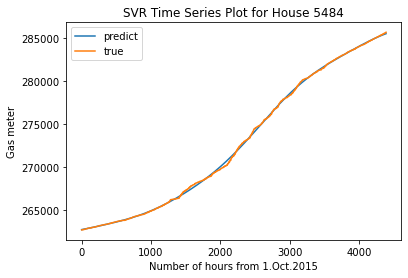

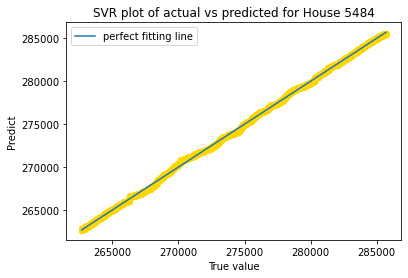

Training score for house 2072 is 0.9986887843491379
Testing score for house 2072 is 0.9987589295812153


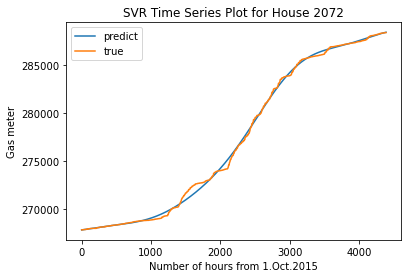

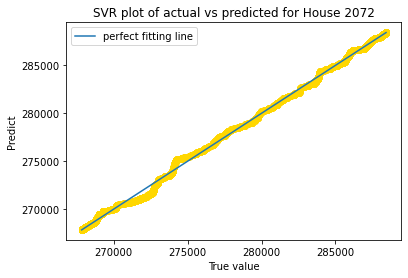

Training score for house 2461 is 0.9988869809129285
Testing score for house 2461 is 0.9987740660033744


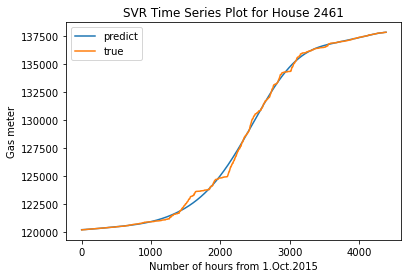

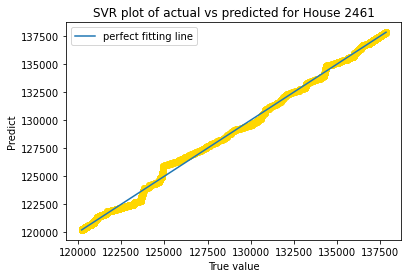

Training score for house 744 is 0.9995724154097021
Testing score for house 744 is 0.9996114833320252


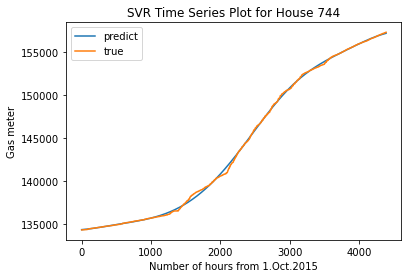

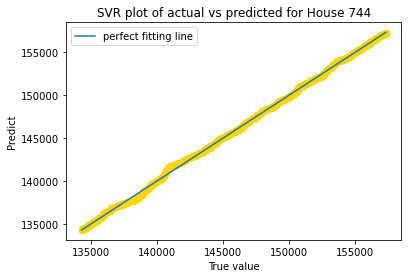

Training score for house 9982 is 0.980804312368571
Testing score for house 9982 is 0.9993747042663027


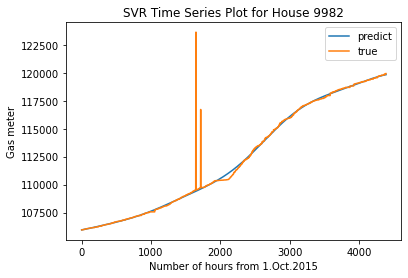

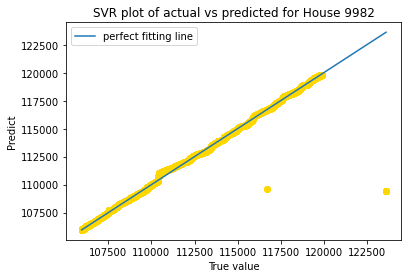

Training score for house 1790 is 0.9989036243263357
Testing score for house 1790 is 0.9989346513784779


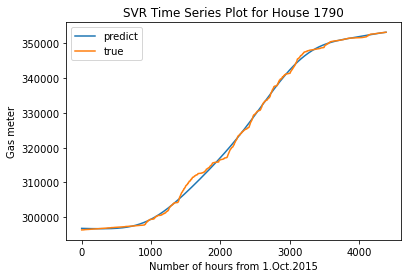

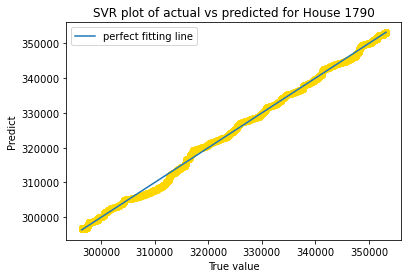

Training score for house 1800 is 0.9988038751382523
Testing score for house 1800 is 0.9988127283005098


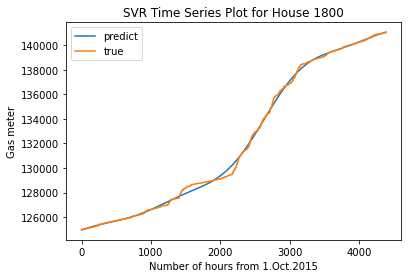

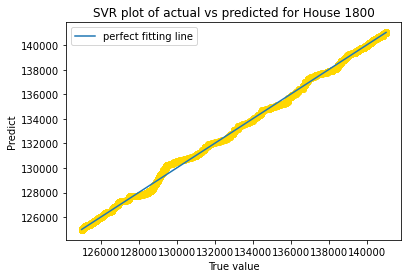

Training score for house 2980 is 0.9994384903021238
Testing score for house 2980 is 0.9994449575454826


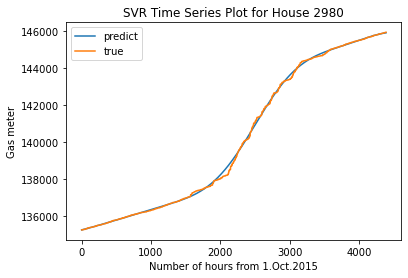

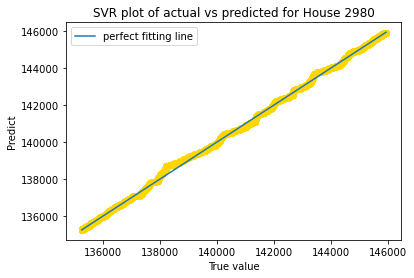

Training score for house 2094 is 0.9993645130758435
Testing score for house 2094 is 0.9994150906181833


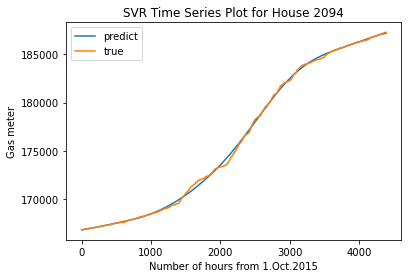

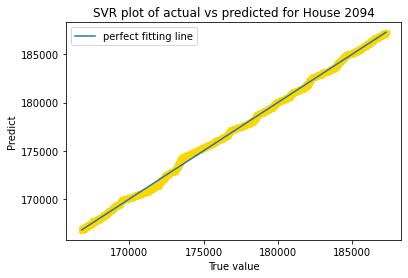

Training score for house 5892 is 0.9995415605314328
Testing score for house 5892 is 0.9995691090929067


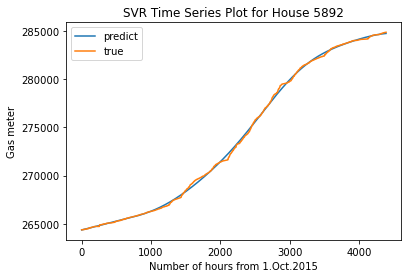

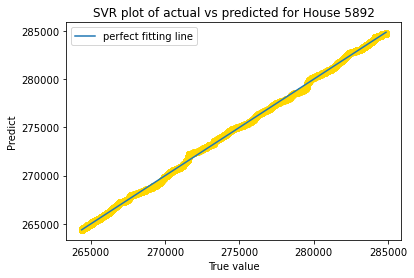

Training score for house 7900 is 0.9992079601818908
Testing score for house 7900 is 0.9992415475899108


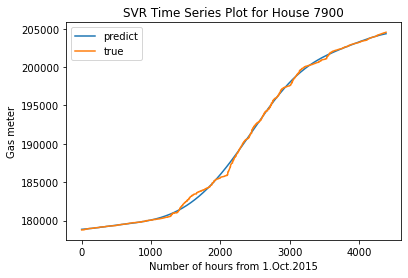

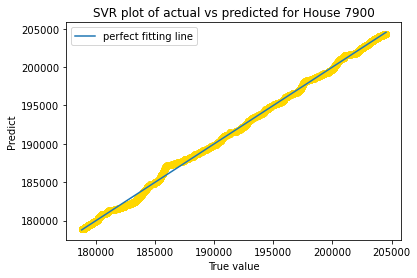

Training score for house 8084 is 0.9982287263381971
Testing score for house 8084 is 0.9984524138107655


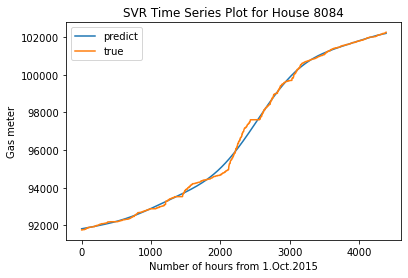

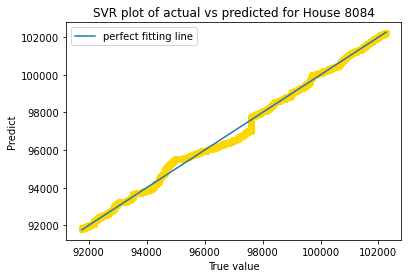

Training score for house 3527 is 0.9991836538414254
Testing score for house 3527 is 0.9991694532455957


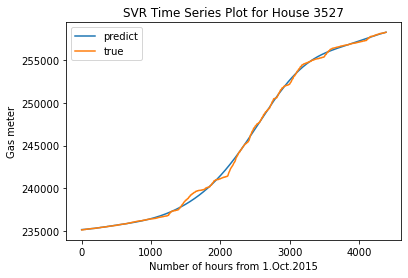

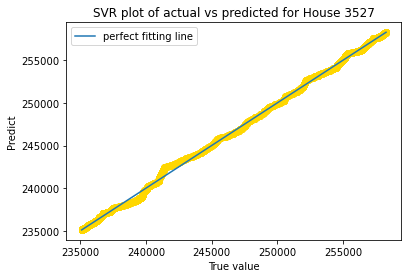

Training score for house 3849 is 0.9983482039746226
Testing score for house 3849 is 0.9980501168593516


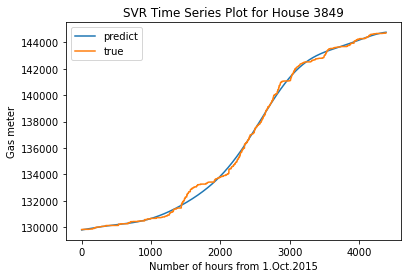

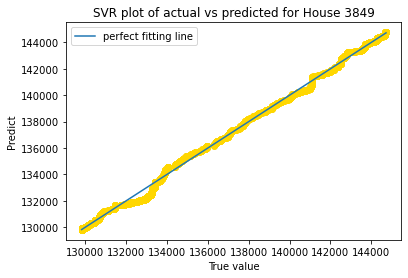

Training score for house 4356 is 0.9989887127292474
Testing score for house 4356 is 0.9991169582172765


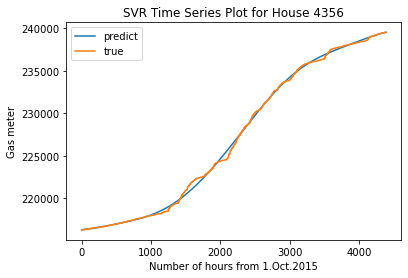

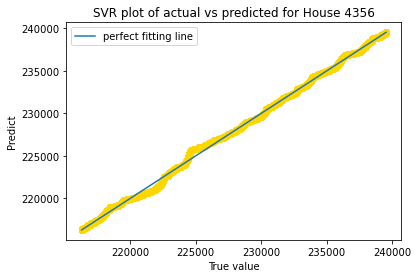

Training score for house 2129 is 0.9991127802134564
Testing score for house 2129 is 0.9988956474589693


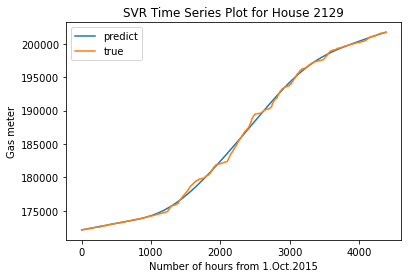

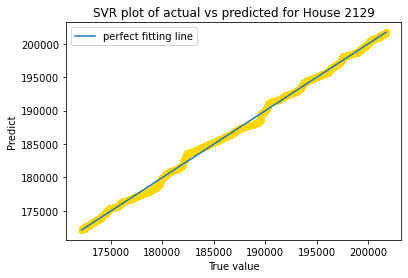

Training score for house 2965 is 0.9991251511761879
Testing score for house 2965 is 0.9990947882172082


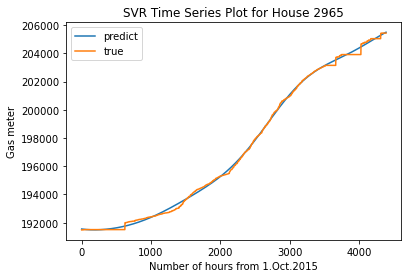

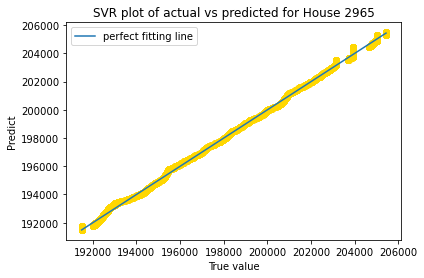

Training score for house 2575 is 0.9997412762736736
Testing score for house 2575 is 0.999721946260762


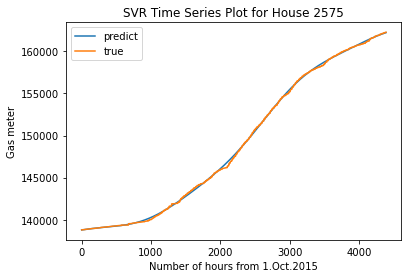

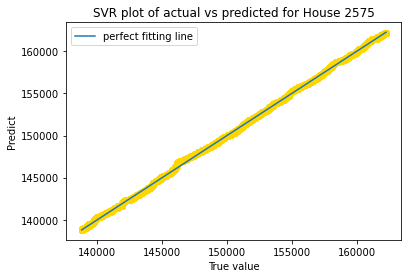

Training score for house 8086 is 0.9991508200734869
Testing score for house 8086 is 0.999092194687024


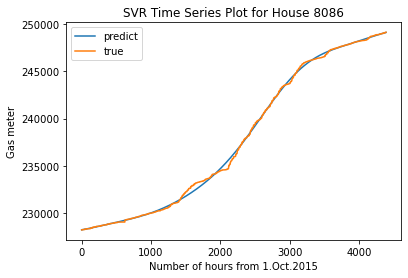

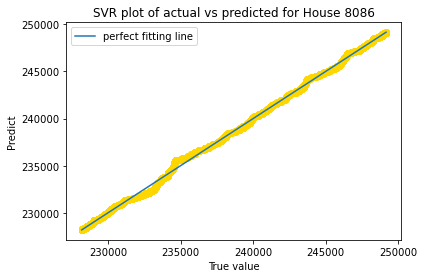

Training score for house 1415 is 0.9991584994460189
Testing score for house 1415 is 0.9991215188673573


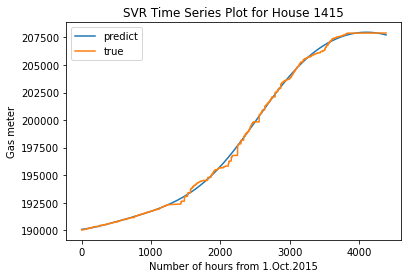

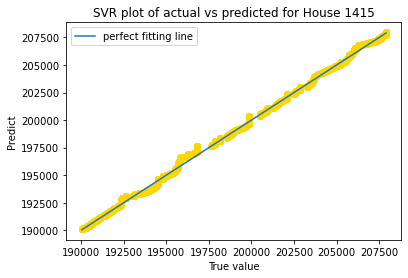

Training score for house 2233 is 0.9790795102318296
Testing score for house 2233 is 0.9795045157233339


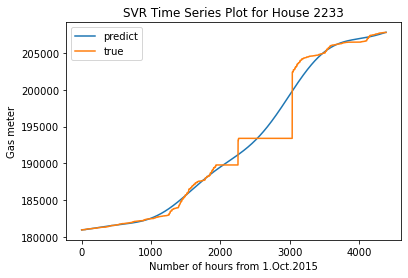

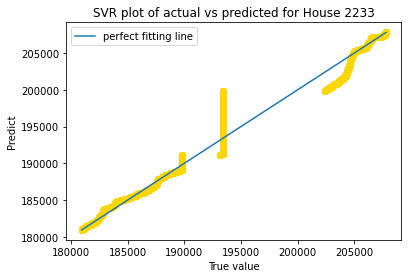

Training score for house 6863 is 0.9714617526065845
Testing score for house 6863 is 0.9675193692620411


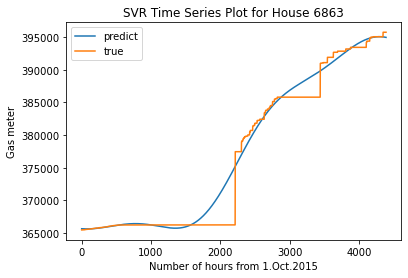

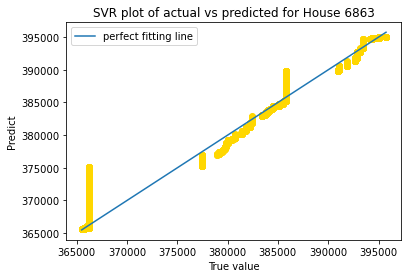

Training score for house 2470 is 0.9987731471940066
Testing score for house 2470 is 0.9987612649447836


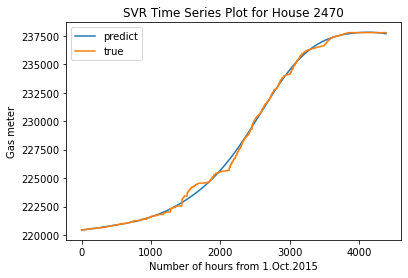

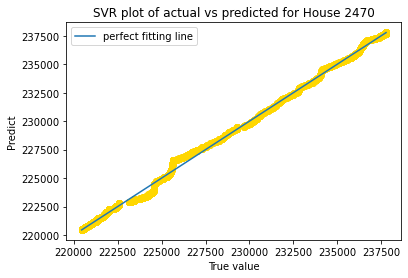

Training score for house 3778 is 0.9994137562639391
Testing score for house 3778 is 0.9993528763799958


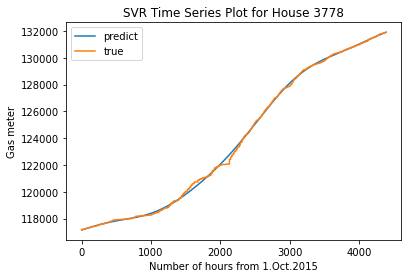

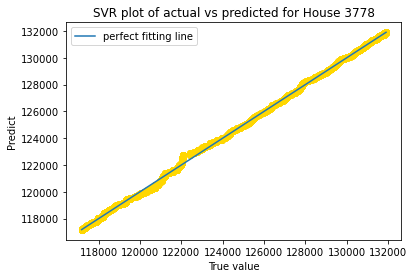

Training score for house 2378 is 0.9984041296893996
Testing score for house 2378 is 0.9985029171899069


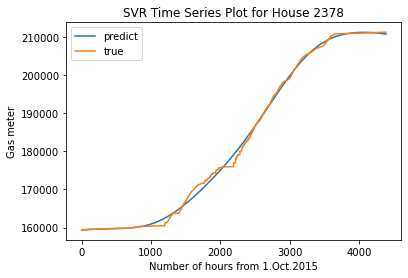

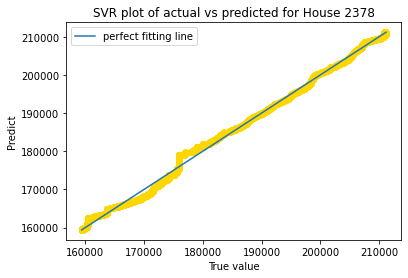

Training score for house 6830 is 0.9993023808874514
Testing score for house 6830 is 0.9992999530765628


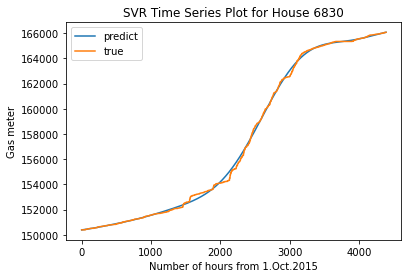

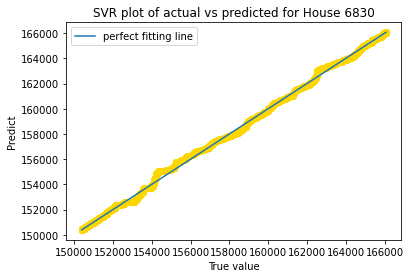

Training score for house 9766 is 0.9991777232023111
Testing score for house 9766 is 0.9991157150291219


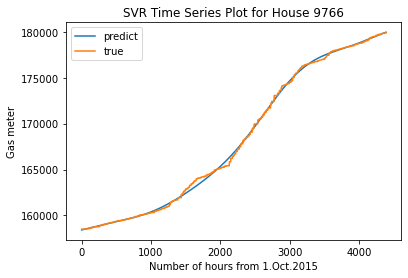

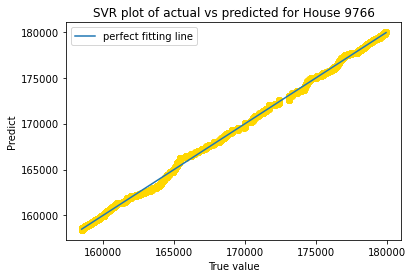

Training score for house 4193 is 0.9982734999582423
Testing score for house 4193 is 0.9981753673480476


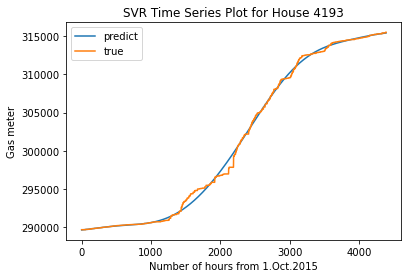

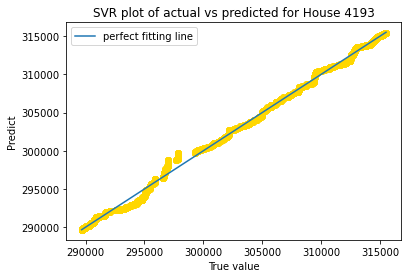

Training score for house 8703 is 0.9927307973320206
Testing score for house 8703 is 0.9922437189084793


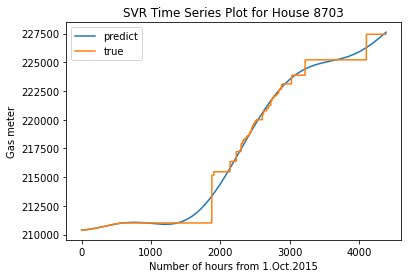

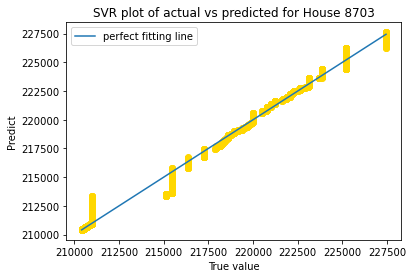

Training score for house 6578 is 0.9953828915635976
Testing score for house 6578 is 0.9949984554700092


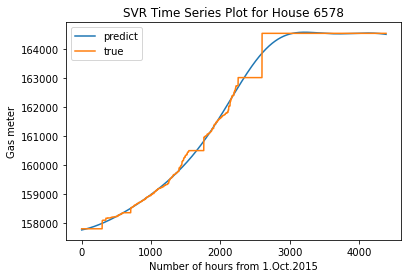

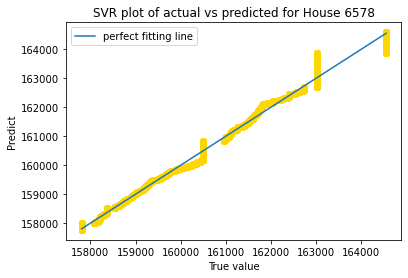

Training score for house 4228 is 0.9989998161227602
Testing score for house 4228 is 0.9990342640395458


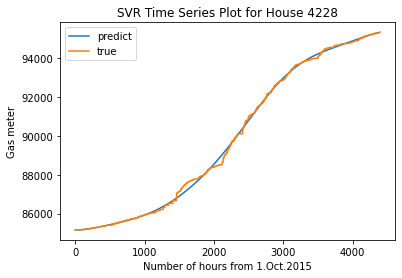

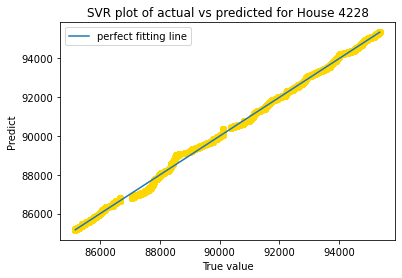

Training score for house 2645 is 0.9798800245753915
Testing score for house 2645 is 0.9802774070678326


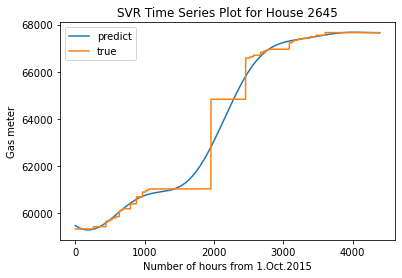

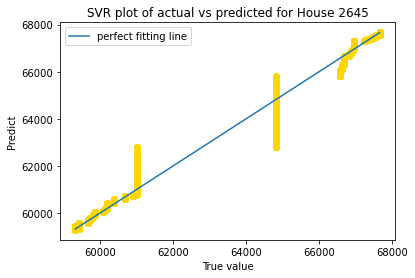

Training score for house 6505 is 0.9982887278917909
Testing score for house 6505 is 0.9984634906192711


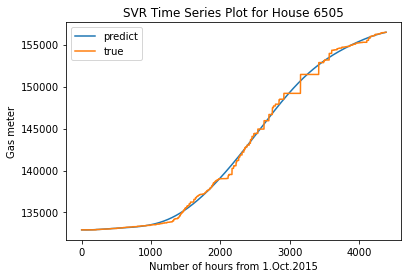

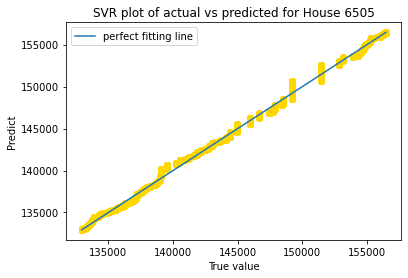

Training score for house 5395 is 0.9985573164351456
Testing score for house 5395 is 0.998683499069397


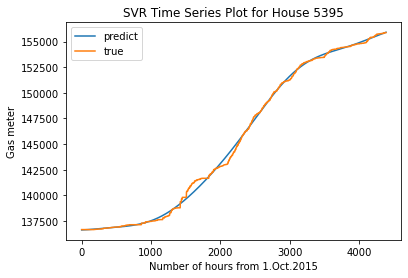

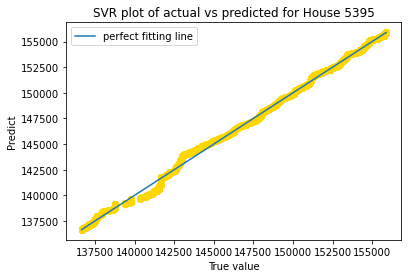

Training score for house 8059 is 0.9965101134154918
Testing score for house 8059 is 0.996731219169356


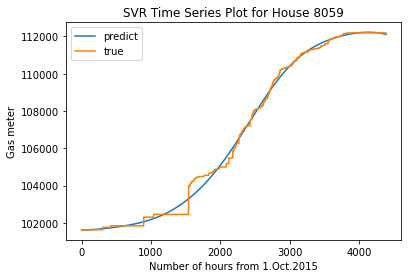

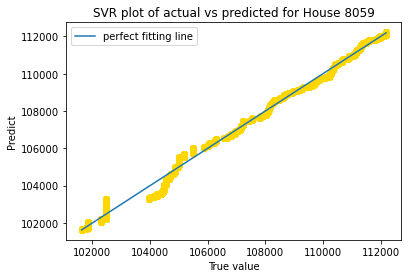

Training score for house 7965 is 0.9939299835872358
Testing score for house 7965 is 0.9945976010738656


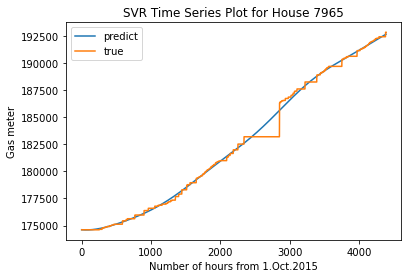

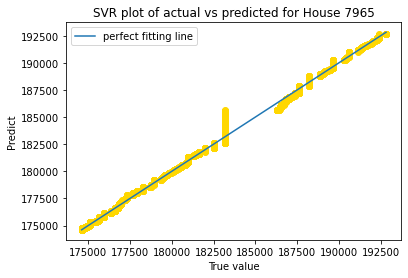

Training score for house 44 is 0.9979587812099614
Testing score for house 44 is 0.9982477279261501


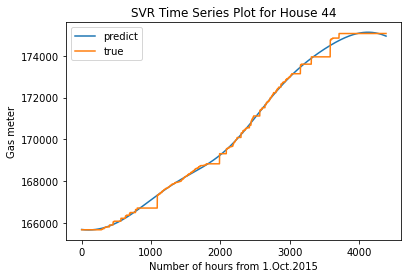

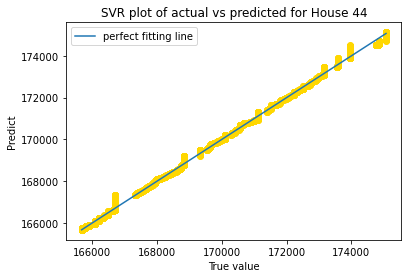

Training score for house 4671 is 0.9508847146756584
Testing score for house 4671 is 0.9445073847915828


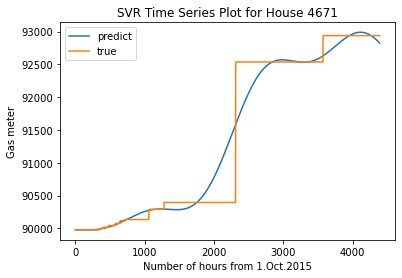

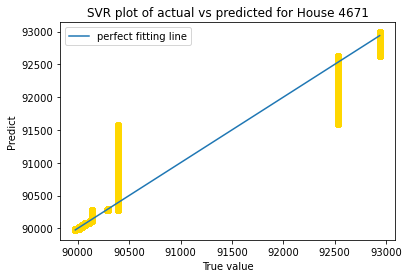

Training score for house 6685 is 0.9871054307243691
Testing score for house 6685 is 0.9851091306142339


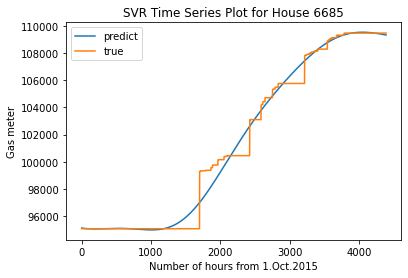

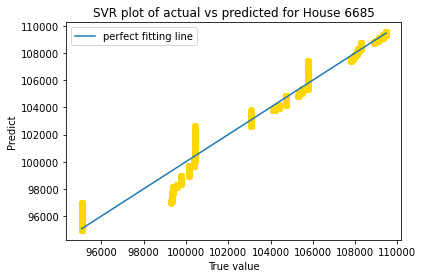

Training score for house 7989 is 0.9994170641004586
Testing score for house 7989 is 0.9994297150191436


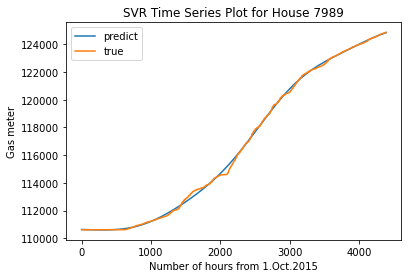

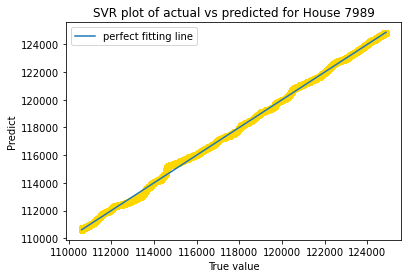

Training score for house 2945 is 0.9994990206808764
Testing score for house 2945 is 0.9995142713804461


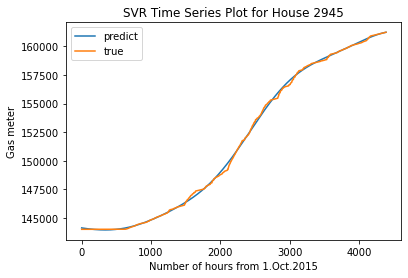

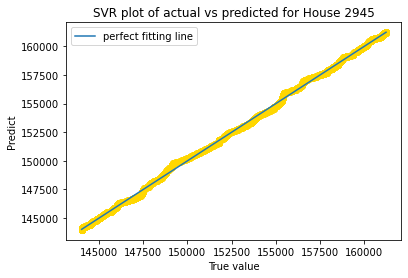

Training score for house 2818 is 0.9984960666058712
Testing score for house 2818 is 0.998524363705078


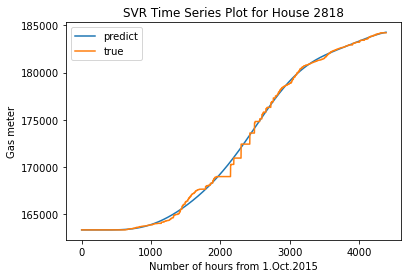

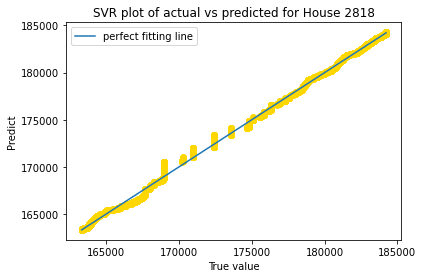

Training score for house 7016 is 0.9977440253443391
Testing score for house 7016 is 0.9971854119065585


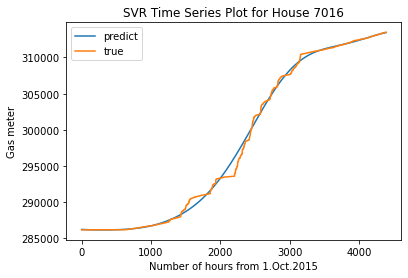

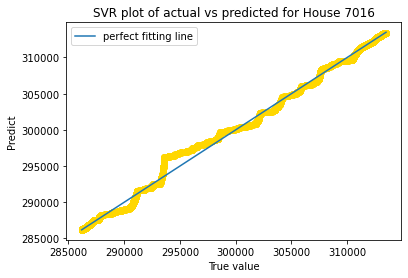

Training score for house 8967 is 0.9959637804350642
Testing score for house 8967 is 0.9961264668109999


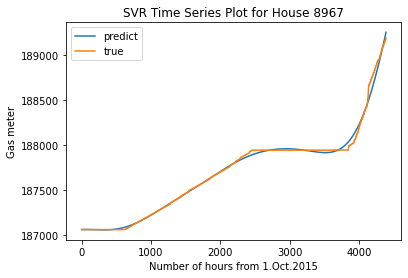

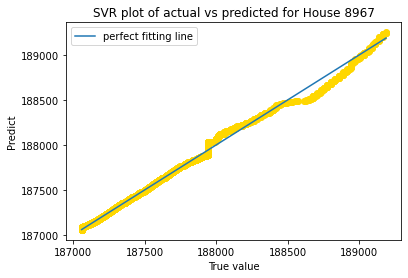

Training score for house 3310 is 0.999054426917696
Testing score for house 3310 is 0.9990260560252111


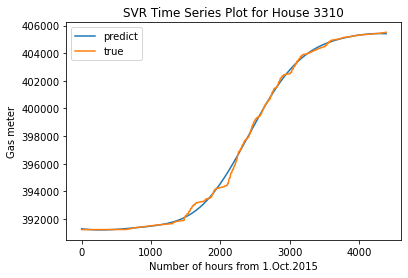

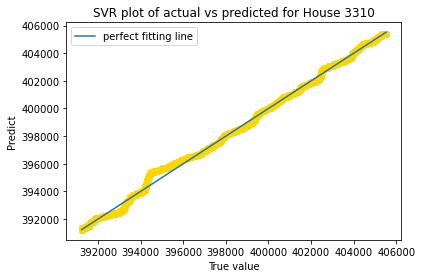

Training score for house 3918 is 0.9984140567507588
Testing score for house 3918 is 0.9984064676566251


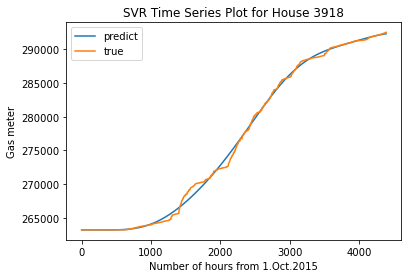

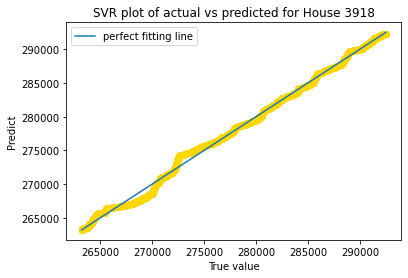

Training score for house 8386 is 0.9994537352840535
Testing score for house 8386 is 0.999415838424355


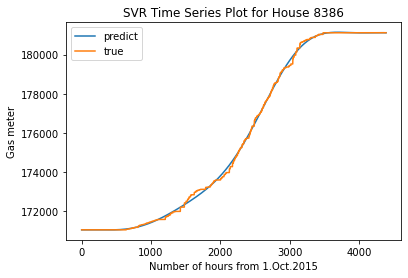

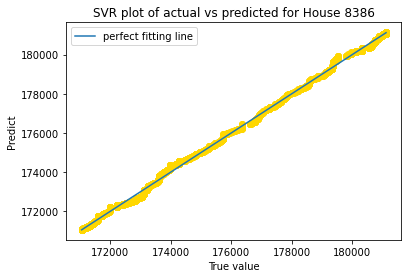

Training score for house 1103 is 0.9989343640279835
Testing score for house 1103 is 0.9989888201006891


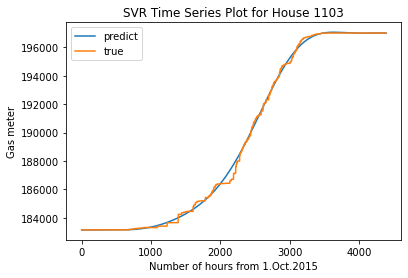

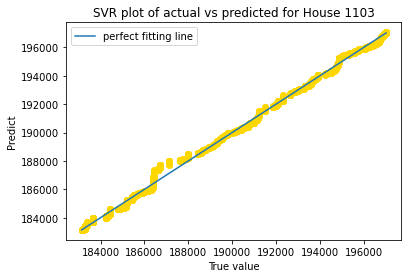

Training score for house 9620 is 0.9768007145465532
Testing score for house 9620 is 0.977117724373758


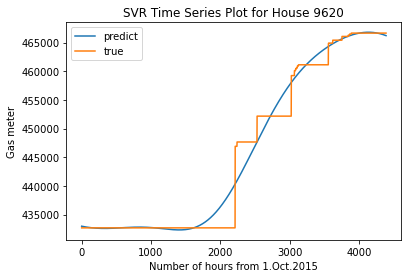

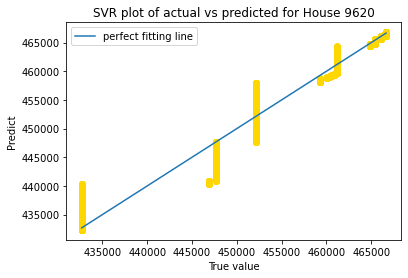

Training score for house 5658 is 0.9967772978197921
Testing score for house 5658 is 0.9963799976093011


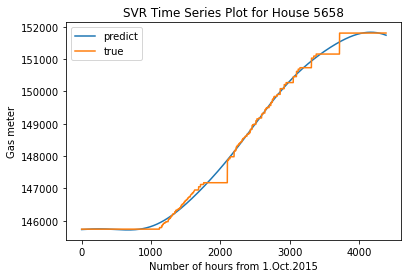

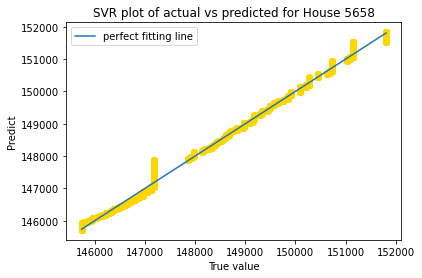

Training score for house 5545 is 0.9923509344584958
Testing score for house 5545 is 0.9929697700951657


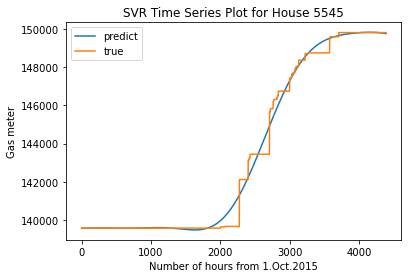

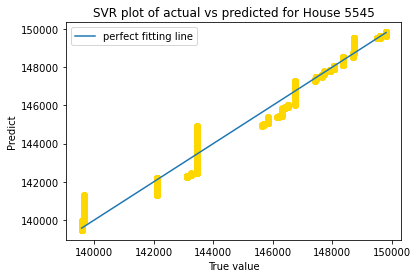

Training score for house 5317 is 0.985262711428544
Testing score for house 5317 is 0.9842280291938347


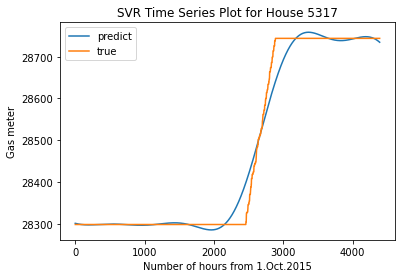

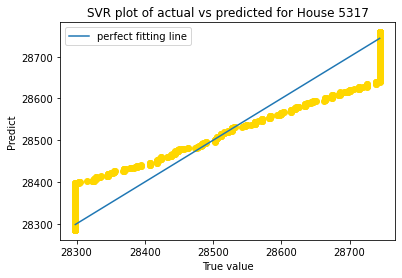

Training score for house 3036 is 0.9778721885021896
Testing score for house 3036 is 0.9769254303317852


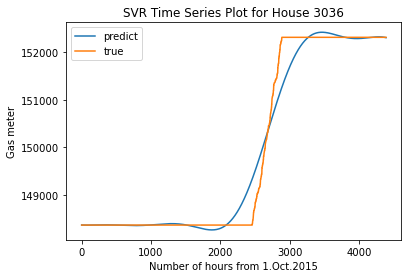

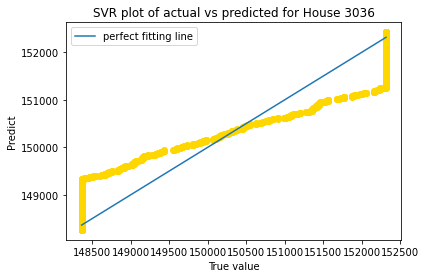

Training score for house 9160 is 0.9773725375945209
Testing score for house 9160 is 0.975825012539564


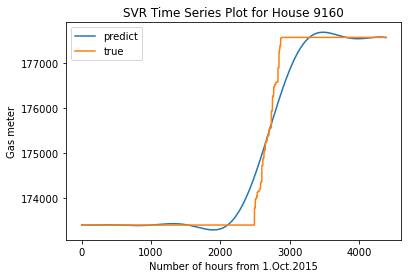

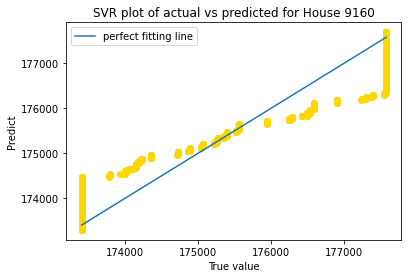

Training score for house 8244 is 0.9779105111774173
Testing score for house 8244 is 0.9769709290186628


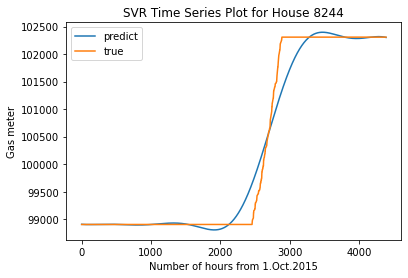

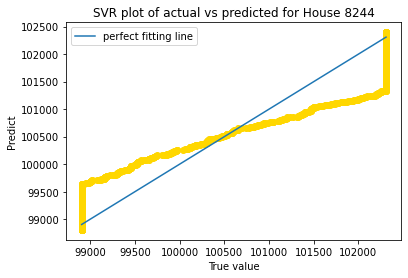

Training score for house 2755 is 0.9780777976381345
Testing score for house 2755 is 0.9763230464747612


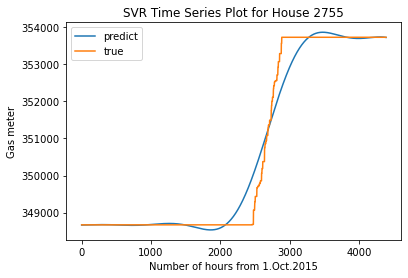

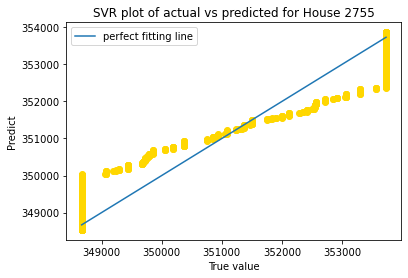

Training score for house 9600 is 0.9782598333616493
Testing score for house 9600 is 0.9753803175529189


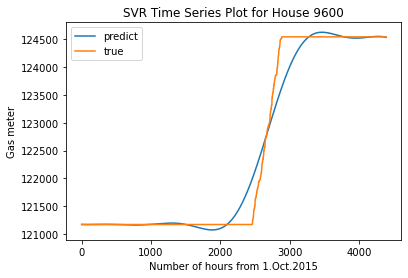

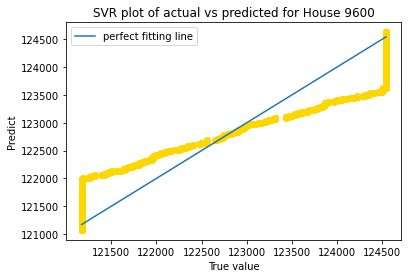

Training score for house 2946 is 0.9752229497645968
Testing score for house 2946 is 0.9737815892957115


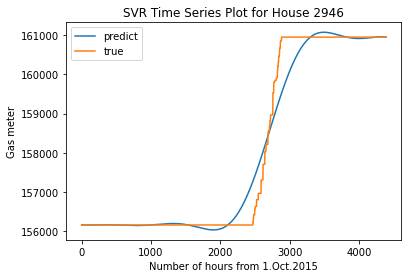

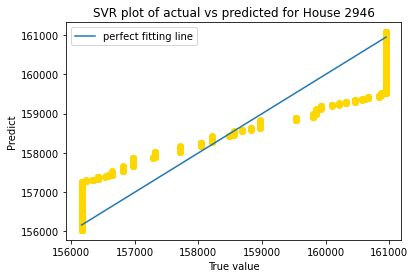

Training score for house 1403 is 0.9745541268026725
Testing score for house 1403 is 0.9800129167111165


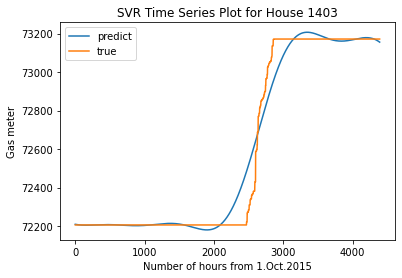

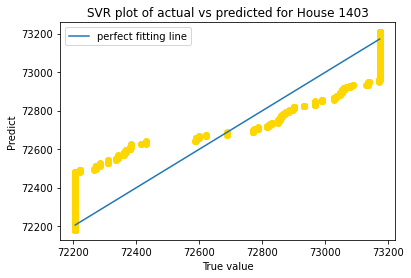

Training score for house 7566 is 0.9759452088742818
Testing score for house 7566 is 0.9770369148128962


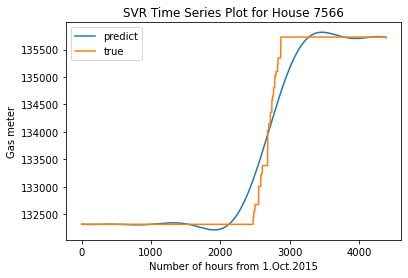

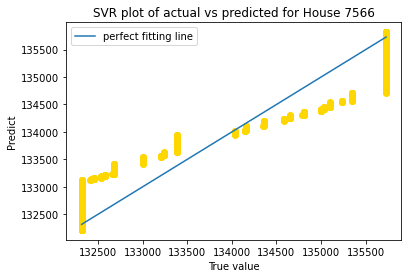

Training score for house 6673 is 0.9975982278358683
Testing score for house 6673 is 0.9974179586448741


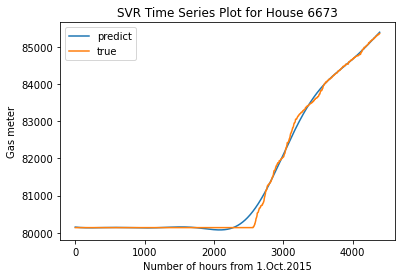

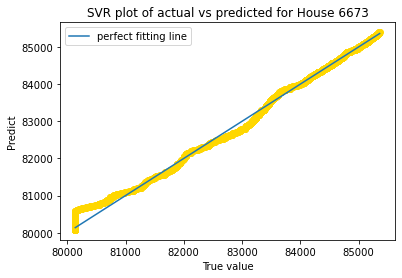

Training score for house 2814 is 0.9895803709150345
Testing score for house 2814 is 0.9897237394229276


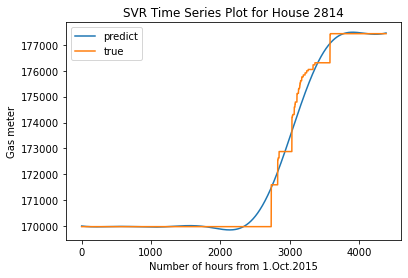

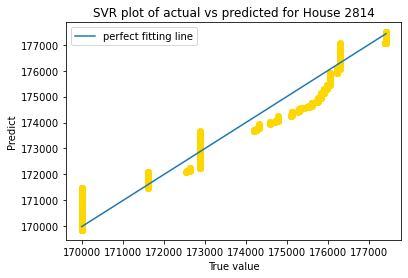

Training score for house 6101 is 0.9357236489414621
Testing score for house 6101 is 0.9404122144695185


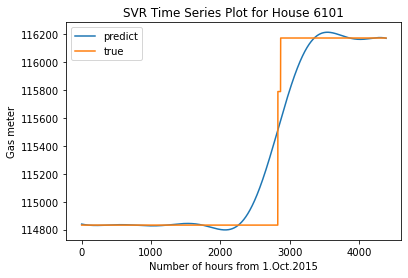

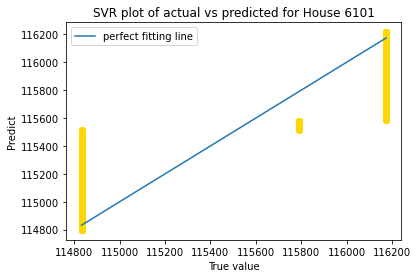

Training score for house 4874 is 0.8503593769817906
Testing score for house 4874 is 0.8489122178229859


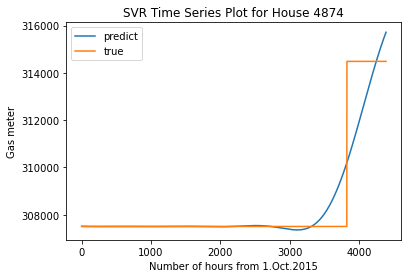

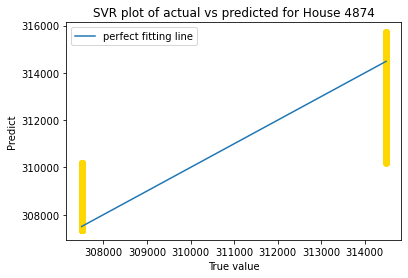

In [11]:
file_name = 'dataport-export_gas_oct2015-mar2016.csv'
file = pd.read_csv(file_name)
ID_list = file['dataid'].unique()
for ID in ID_list:
    SVR_pre(file_name,ID)